# Tarea Minería de Datos

## Ejercicio 1 

### 1.1 Estudio Descriptivo FEV

In [1]:
from NuestrasFunciones import *
pd.set_option("display.max_rows", None, "display.max_columns", None)

fev=pd.read_csv(r'C:\Users\Sarita\Desktop\UCM\4_Mineria de datos\Tarea 1 mineria\FEV_data.csv')
fev.head()

,seqnbr,subjid,age,fev,height,sex,smoke
0,1,301,9,1.708,57.0,2,2
1,2,451,8,1.724,67.5,2,2
2,3,501,7,1.720,54.5,2,2
3,4,642,9,1.558,53.0,1,2
4,5,901,9,1.895,57.0,1,2


**Tipos de variables**

In [2]:
fev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 654 entries, 0 to 653
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   seqnbr  654 non-null    int64  
 1   subjid  654 non-null    int64  
 2   age     654 non-null    int64  
 3   fev     654 non-null    float64
 4   height  654 non-null    float64
 5   sex     654 non-null    int64  
 6   smoke   654 non-null    int64  
dtypes: float64(2), int64(5)
memory usage: 35.9 KB


- Non-Null Count: todas las variables tienen 654 valores no-nulos, por lo que no hay datos faltantes o missings.

In [3]:
fev.describe()

,seqnbr,subjid,age,fev,height,sex,smoke
count,654.00000,654.000000,654.000000,654.000000,654.000000,654.000000,654.000000
mean,327.50000,37169.571865,9.931193,2.636780,61.143578,1.486239,1.900612
std,188.93782,23690.860350,2.953935,0.867059,5.703513,0.500193,0.299412
min,1.00000,201.000000,3.000000,0.791000,46.000000,1.000000,1.000000
25%,164.25000,15811.000000,8.000000,1.981000,57.000000,1.000000,2.000000
50%,327.50000,36071.000000,10.000000,2.547500,61.500000,1.000000,2.000000
75%,490.75000,53638.500000,12.000000,3.118500,65.500000,2.000000,2.000000
max,654.00000,90001.000000,19.000000,5.793000,74.000000,2.000000,2.000000


**Comentarios**

- seqnbr (numero de estudio): de 1 a 654 - sigue rango esperado
- subjid (numero de identificación): parecen valores normales
- age (edad): con valores mínimos de 3 años y máximo de 19 años: parece extraño que un niño de 3 años se incluya en un estudio sobre fumar. Por otro lado, hay 'niños' de hasta 19 años. Sin embargo, esto se debe a que el estudio recoge tanto niños como adolescentes.
- fev: min 0.79 litros/segundo, max 5.79 l/s
- height (altura): min 46inch(116cm), max 74 inch(187cm) -> no parece haber valores extraños, más teniendo en cuenta que se incluyen sujetos de hasta 19 años, y por tanto, más altos
- sex (genero): valores encajan con la descripción (1 male, 2 female)
- smoke (fumar): encaja con la descripción (1 sí, 2 no)

In [4]:
#Valores únicos de las variables

fev.nunique()

seqnbr    654
subjid    654
age        17
fev       575
height     56
sex         2
smoke       2
dtype: int64

No hay valores repetidos para el número de estudio ni de identificación, por lo que no se repiten los datos de un mismo niño. Sex y smoke (codificadas como entero), al tener sólo dos valores y coincidiendo con la descripción de los datos, pasarían a ser categóricas.

**Conversión a factor/categórica de variables con menos de 10 valores**

In [5]:
to_factor = list(fev.loc[:,fev.nunique() < 10]);  

fev[to_factor] = fev[to_factor].astype('category')

fev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 654 entries, 0 to 653
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   seqnbr  654 non-null    int64   
 1   subjid  654 non-null    int64   
 2   age     654 non-null    int64   
 3   fev     654 non-null    float64 
 4   height  654 non-null    float64 
 5   sex     654 non-null    category
 6   smoke   654 non-null    category
dtypes: category(2), float64(2), int64(3)
memory usage: 27.2 KB


In [6]:
fev.describe(exclude=np.number)

,sex,smoke
count,654,654
unique,2,2
top,1,2
freq,336,589


**Análisis gráfico de las variables**

Cont


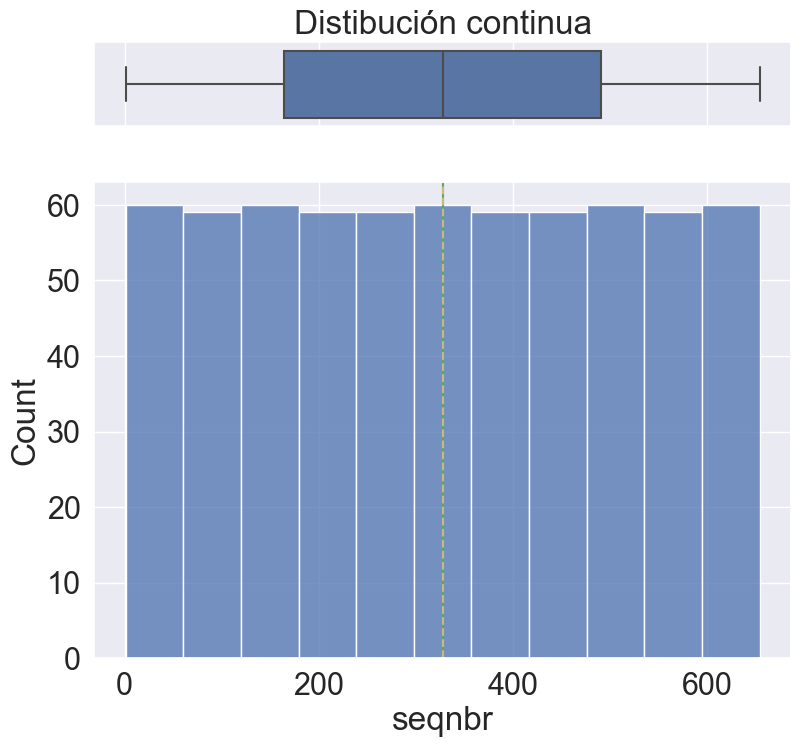

Cont


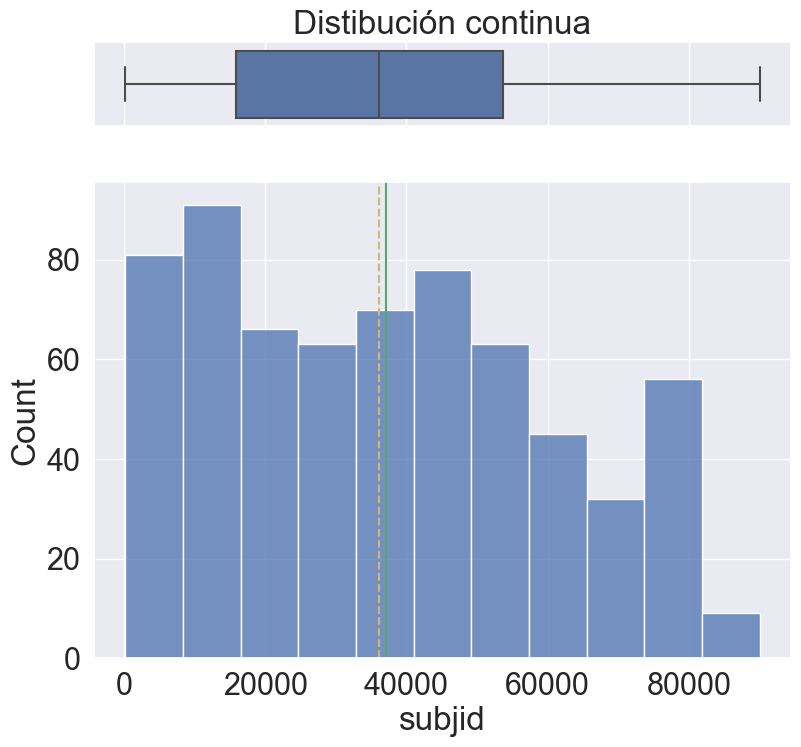

Cont


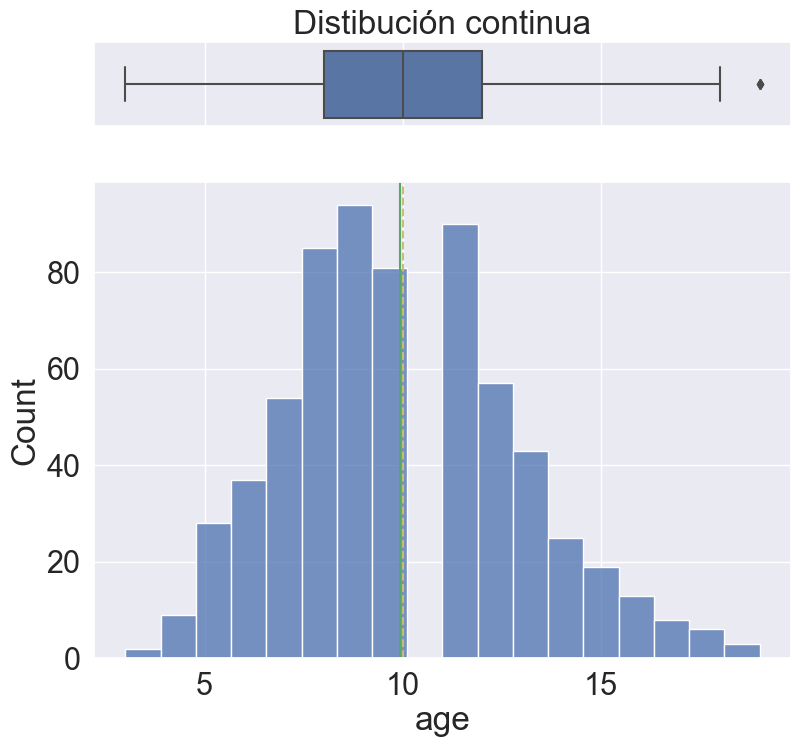

Cont


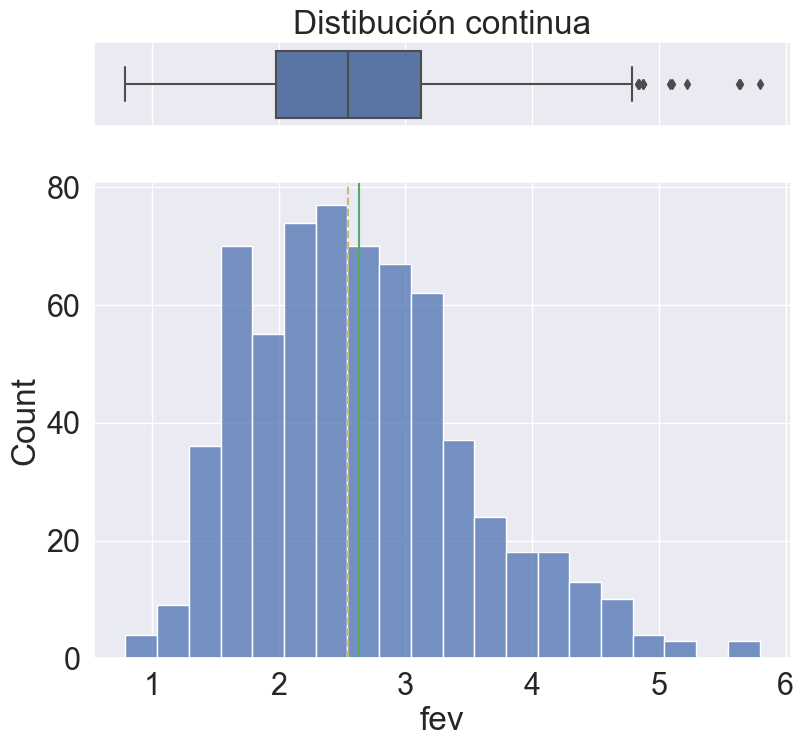

Cont


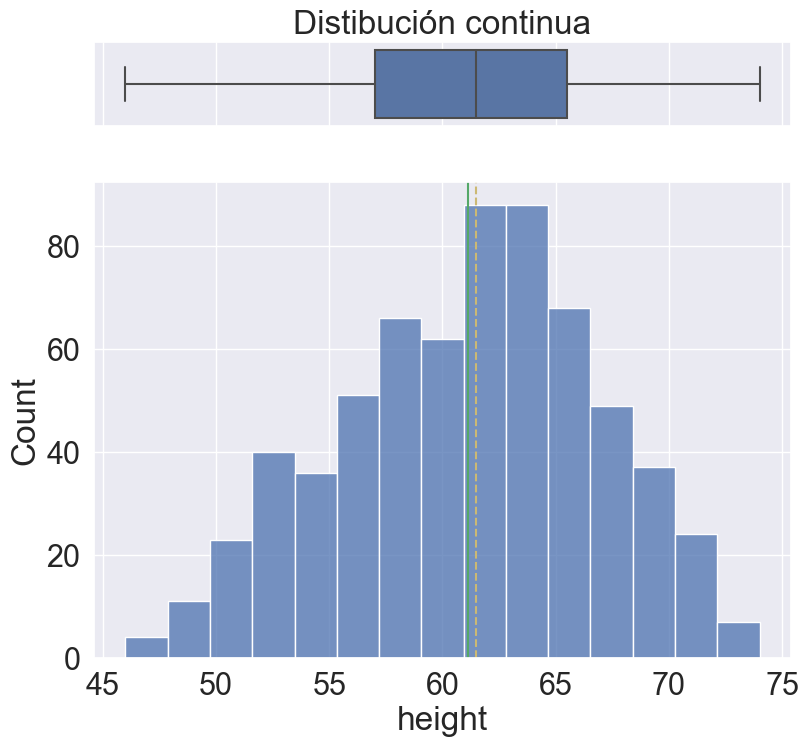

Cat


Cat


seqnbr    None
subjid    None
age       None
fev       None
height    None
sex       None
smoke     None
dtype: object

In [7]:
fev.apply(plot)

Variables continuas - análisis con histograma y boxplot

- age: hay un hueco en mitad del histograma, parece que no hay niños de 11/12 años (aproximadamente) incluidos en el estudio.  Por otro lado, parece haber tanto niños como adolescentes, aunque mayor incidencia de niños. Hay un valor atípico, el de 19 años.
- fev: varios atípicos con un mayor volumen respiratorio, a partir de unos 4.75 l/s
- height: no hay atípicos

Por otro lado, no parece haber presencia de bimodalidad o dos poblaciones distintas en ninguna de las variables continuas.


Variables categóricas - análisis con gráfico de barras

- sex: bastante equilibrado, casi misma incidencia de chicos (1) que chicas (2)
- smoke: muy desequilibrado. Casi todos los niños no fuman (1), y un porcentage muy pequeño fuma (2). Debido al desequilibrio de las categorías, esta variable dará problemas de cara al modelado. A pesar de esto, el objeto del estudio no era mostrar un equilibrio entre estas categorías, sino mostrar la proporción real de estas en la población.

In [1]:
#Atípicos en variable age

fev.sort_values(by='age', ascending=False).head()


NameError: name 'dt' is not defined

Como se veía en los histogramas de arriba, había dos variables con valores atípicos según el boxplot:
- FEV: atípicos en valores altos. Pero al ser la variable objetivo que intento predecir, decido no modificarla.
- age: atípicos de 19 años. Sin embargo, como se observa en la tabla, hay tres valores de 19, y no son extremos, ya que también se incluyen valores de 18 años y sólo hay una unidad de diferencia. Por lo tanto, no los considero outliers relevantes y decido dejarlos como están y no winsorizar.

### 1.2 Variables descartadas de cara al modelado

- seqnbr: número de estudio
- subjid: número de identificación

Descarto estas variables porque no aportan información relevante, ya que son números de identificación de cada participante del estudio. Mantengo age, height, sex y smoke; ya que son valores que pueden afectar a fev. 

In [9]:
fev = fev.drop(['seqnbr','subjid'],axis=1)
fev.head()


,age,fev,height,sex,smoke
0,9,1.708,57.0,2,2
1,8,1.724,67.5,2,2
2,7,1.720,54.5,2,2
3,9,1.558,53.0,1,2
4,9,1.895,57.0,1,2


In [10]:
#Separación de variable objetivo del resto de variables

varObj = fev.fev
imput = fev.drop(['fev'],axis=1)

imput.head()

,age,height,sex,smoke
0,9,57.0,2,2
1,8,67.5,2,2
2,7,54.5,2,2
3,9,53.0,1,2
4,9,57.0,1,2


### 1.3 Regresión lineal sin interacciones

**Estudio descriptivo de relaciones con variable objetivo**

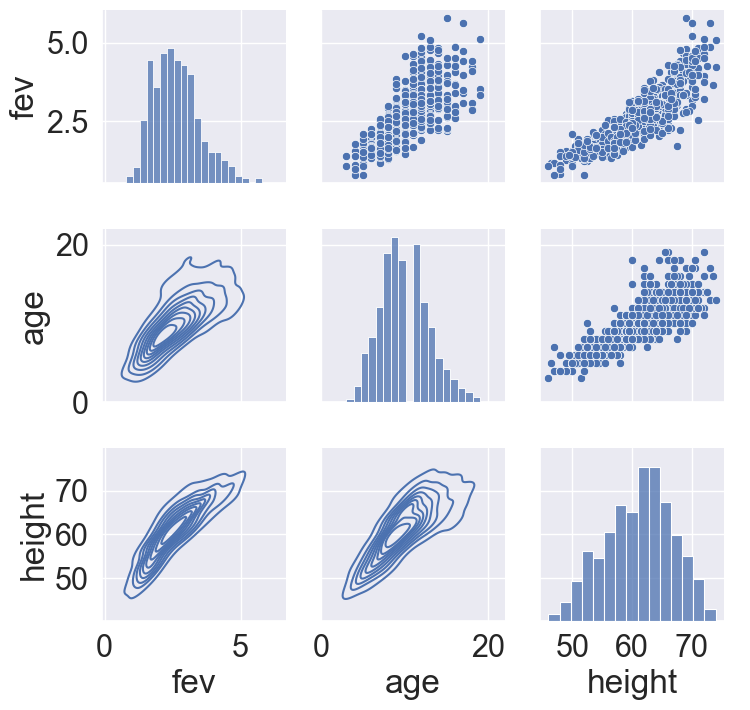

In [11]:
g = sns.PairGrid(fev[['fev','age','height']])
g.map_diag(sns.histplot)
g.map_lower(sns.kdeplot)
g.map_upper(sns.scatterplot)
g.add_legend()

**Variables cuantitativas**

1. relación variable objetivo con predictoras

- age: positiva. A mayor edad, mayor FEV.
- height: positiva. A más altura, más FEV.

2. relación entre variables predictoras

- age, height: correlación positiva. A mayor altura, mayor edad. También a la inversa, a mayor edad, mayor altura. Es decir, hay colinearidad entre estas dos variables predictoras

**Variables de control**

Creo dos variables aleatorias, las cuales al ser generadas de esta forma no deberían tener relación con la variable objetivo fev. Comparando con las demás variables predictoras, en caso de observar que una de estas tiene menor relación con fev que la relación de un aleatorio con fev, probablemente dicha variable predictora no tenga un efecto relevante en la variable objetivo.

In [12]:
fev['aleatorio'] = np.random.uniform(0,1,size=fev.shape[0])
fev['aleatorio2'] = np.random.uniform(0,1,size=fev.shape[0])
fev.head()

,age,fev,height,sex,smoke,aleatorio,aleatorio2
0,9,1.708,57.0,2,2,0.028203,0.434809
1,8,1.724,67.5,2,2,0.980917,0.525180
2,7,1.720,54.5,2,2,0.736353,0.000916
3,9,1.558,53.0,1,2,0.067724,0.791507
4,9,1.895,57.0,1,2,0.836109,0.596399


In [13]:
import pandas_profiling
pandas_profiling.ProfileReport(fev)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Pandas profiling: 

- age correlacionada con height y smoke (colinearidad entre variables dependientes) y con fev (variable objetivo, correlación con fev me ayuda a estimarlo)
- height correlacionada con age (dependiente), fev (objetivo)
- smoke correlacionado con age (dependiente)
- sex no tiene correlación relevante

**Análisis de correlaciones con V de Cramer**

Utilizando las categorías de variables categóricas y tramificando en 5 las variables continuas

In [14]:
tablaCramer = pd.DataFrame(imput.apply(lambda x: cramers_v(x,varObj)),columns=['VCramer'])
px.bar(tablaCramer,x=tablaCramer.VCramer,title='Relaciones frente a FEV').update_yaxes(categoryorder="total ascending")

V de Cramer:

Height tiene la mayor relación con FEV, seguida de age, sex y finalmente smoke. Siguiendo la interpretación de IBM sobre la V de Cramer, los valores situados entre 0.2 y 0.6 (inclusives) indican una asociación moderada, como es el caso en todas las variables analizadas con respecto a fev.

Referencia: https://www.ibm.com/docs/es/cognos-analytics/11.1.0?topic=terms-cramrs-v

In [15]:
# ANOVA con dos factores e interacción
from statsmodels.formula.api import ols

model = ols('fev ~ C(smoke) + C(sex) + C(smoke):C(sex)', data=fev).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(smoke),33.681467,1.0,50.514229,3.122201e-12
C(sex),25.435769,1.0,38.147633,1.156236e-09
C(smoke):C(sex),2.512660,1.0,3.768396,5.266157e-02
Residual,433.401724,650.0,NaN,NaN


los efectos e incluso interaccion sex,smoke son significativos p valor menor a 0.05

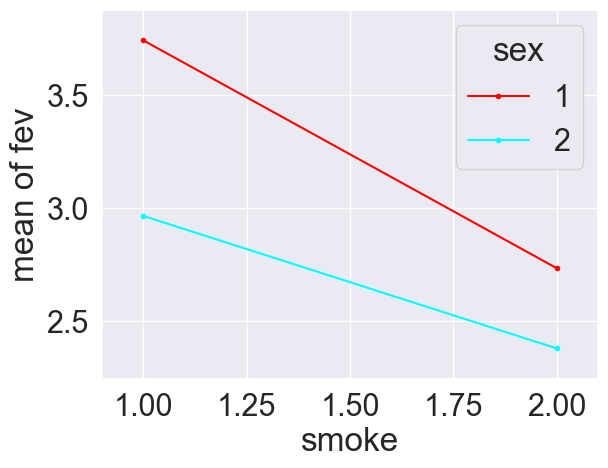

In [16]:
from statsmodels.graphics.factorplots import interaction_plot
import matplotlib.pyplot as plt


# Gráfico de interacción de las componentes del ANOVA
fig = interaction_plot(x=fev.smoke.astype('object'), trace=fev['sex'].astype('object'), response=fev['fev'])
plt.show()

Se evidencia interacción entre los factores cuando las líneas se cortan en algún punto. No es el caso, no parece haber interacción

**Transformaciones de variables continuas**


In [17]:
# Aplicar a las variables continuas la mejor transfromación según correlacion frente a varObj (fev)
transf_cor = imput.select_dtypes(include=np.number).apply(lambda x: mejorTransf(x,varObj, tipo='cor'))

# Pedir los nombres de las transformaciones y asignarlos a las columnas
transf_cor_names = imput.select_dtypes(include=np.number).apply(lambda x: mejorTransf(x,varObj,tipo='cor', name=True))
transf_cor.columns = transf_cor_names.values

transf_cor.head()

,age_ident,height_sqr
0,2.032843,3.725719
1,1.694053,14.232450
2,1.355262,2.224722
3,2.032843,1.508852
4,2.032843,3.725719


Mejores transformaciones para continuas segun correlation:
- age: identidad
- height: squared root

In [18]:
# Aplicar a las variables continuas la mejor transfromación según cramer frente a varObj (fev)
transf_cramer = imput.select_dtypes(include=np.number).apply(lambda x: mejorTransf(x,varObj, tipo='cramer'))
transf_cramer_names = imput.select_dtypes(include=np.number).apply(lambda x: mejorTransf(x,varObj,tipo='cramer', name=True))
transf_cramer.columns = transf_cramer_names.values

transf_cramer.head()

,age_ident,height_sqr
0,2.032843,3.725719
1,1.694053,14.232450
2,1.355262,2.224722
3,2.032843,1.508852
4,2.032843,3.725719


Mejores transformaciones para continuas segun VCramer:
- age: identidad
- height: squared root

In [19]:
# Input con transfromadas según correlación
imput_transf_cor = imput.join(transf_cor)

# Input con transfromadas según cramer
imput_transf_cramer = imput.join(transf_cramer)

**Gráfico correlaciones**

Comprobar si las transformaciones en variables continuas mejoran el valor de correlacion lineal con fev. Al obtener las mismas transformaciones con correlación que con VCramer utilizo solo uno de estos datasets (correlacion).

<AxesSubplot:>

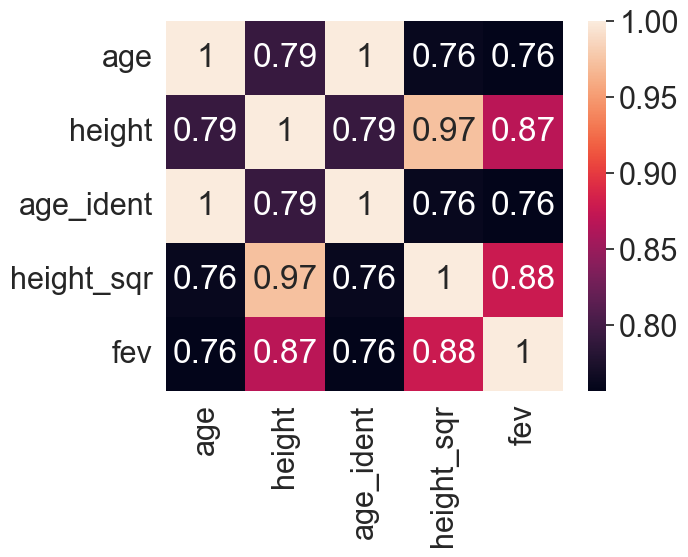

In [20]:
# Matriz de correlaciones incluyendo transformaciones
corr = imput_transf_cor.join(varObj).corr(numeric_only=True)

#La siguiente lineas de formato no la puedo ejecutar por un probema con jinja2
#corr.style.background_gradient(cmap='coolwarm').format(precision=3)

sns.heatmap(corr, annot=True)

- age: correlacion de 0.76 con FEV --> transformación age_ident mantiene la correlación con FEV en 0.76. No ha cambiado, por lo que no es necesario hacer la transformación y mantengo la variable original.
- height: correlacion de 0.87 con FEV --> transformación height_sqr aumenta la correlación con FEV a 0.88 - apenas ha cambiado, sólo aumenta un 0.01. Podría mantener la variable original para facilitar la interpretación.


**Partición Training-Test**

In [21]:
from sklearn.model_selection import train_test_split

#Divido el dataset en training (80%) y test (20%)
X_train, X_test, y_train, y_test = train_test_split(imput, varObj, test_size=0.2, random_state=42)

print('Training dataset shape:', X_train.shape, y_train.shape)
print('Testing dataset shape:', X_test.shape, y_test.shape)

Training dataset shape: (523, 4) (523,)
Testing dataset shape: (131, 4) (131,)


In [22]:
#Junto variable objetivo con variables explicativas de training
data_train = X_train.join(y_train)

**Modelo completo de referencia**

Modelo con todas las variables explicativas que usaré para comparar con otros modelos, en busca del que tenga mejor R2, AIC, BIC 

In [23]:
#Generar la fórmula con todas las variables

form=ols_formula(data_train,'fev')
form

'fev ~ age + height + sex + smoke'

In [24]:
#Modelo completo OLS
#sin matriz explícita
modeloC = ols(form,data=data_train).fit()
modeloC.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.766
Model:                            OLS   Adj. R-squared:                  0.764
Method:                 Least Squares   F-statistic:                     423.4
Date:                Thu, 22 Dec 2022   Prob (F-statistic):          1.09e-161
Time:                        12:43:19   Log-Likelihood:                -281.13
No. Observations:                 523   AIC:                             572.3
Df Residuals:                     518   BIC:                             593.6
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -4.3576      0.271    -16.067      0.000      -4.890      -3.825
sex[T.2]      -0.1511      0.038     -4.028      0.000      -0.225      -0.077
smoke[T.2]     0.0652      0.066      0.983      0.326      -0.065       0.196
age            0.0632      0.011      5.678      0.000       0.041       0.085
height         0.1041      0.005     19.150      0.000       0.093       0.115
==============================================================================
Omnibus:                       11.617   Durbin-Watson:                   2.092
Prob(Omnibus):                  0.003   Jarque-Bera (JB):               17.038
Skew:                           0.178   Prob(JB):                     0.000200
Kurtosis:                       3.810   Cond. No.                         932.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

R2adj = 0.764; AIC = 572.3; BIC = 593.6
- todas las variables son significativas (p-valor menor a 0.05), excepto smoke (p-valor = 0.326)

**Importancia de las variables** (en cuanto a su aporte al R2 del modelo)

Antes de aplicarlo, creo la matriz de diseño del modelo con patsy, para poder incluir las variables categóricas por medio de dummies.

In [25]:
import patsy

# Generar las matrices de diseño según la fórmula de modelo completo
y, X = patsy.dmatrices(form, data_train, return_type='dataframe')

#Modelo completo OLS con matriz explícita de diseño
model=sm.OLS(y,X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.766
Model:                            OLS   Adj. R-squared:                  0.764
Method:                 Least Squares   F-statistic:                     423.4
Date:                Thu, 22 Dec 2022   Prob (F-statistic):          1.09e-161
Time:                        12:43:21   Log-Likelihood:                -281.13
No. Observations:                 523   AIC:                             572.3
Df Residuals:                     518   BIC:                             593.6
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -4.3576      0.271    -16.067      0.000      -4.890      -3.825
sex[T.2]      -0.1511      0.038     -4.028      0.000      -0.225      -0.077
smoke[T.2]     0.0652      0.066      0.983      0.326      -0.065       0.196
age            0.0632      0.011      5.678      0.000       0.041       0.085
height         0.1041      0.005     19.150      0.000       0.093       0.115
==============================================================================
Omnibus:                       11.617   Durbin-Watson:                   2.092
Prob(Omnibus):                  0.003   Jarque-Bera (JB):               17.038
Skew:                           0.178   Prob(JB):                     0.000200
Kurtosis:                       3.810   Cond. No.                         932.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Mismos resultados que en el modelo completo sin matriz de diseño:
- R2adj = 0.764; AIC = 572.3; BIC = 593.6
- todas las variables son significativas (p-valor menor a 0.05), excepto smoke (p-valor = 0.326)


In [26]:
#Calcular importancia relativa de todas las variables respecto R2 modelo
from relativeImp import relativeImp
names=X.columns.tolist()[1:]

# Calcular importancia relativa
df_results = relativeImp(X.join(y), outcomeName = 'fev', driverNames = names)

# Ordenar valores 
df_results.sort_values(by='normRelaImpt', ascending=False)

,driver,rawRelaImpt,normRelaImpt
3,height,0.443669,57.937958
2,age,0.277787,36.275651
0,sex[T.2],0.024235,3.164859
1,smoke[T.2],0.020075,2.621533


Teniendo en cuenta que el R2 del modelo completo es 0.764:
- height aporta el 57.9% del R2 total, es decir contribuye más que ninguna otra variable a la explicación de la variación de la variable objetivo fev
- age el 36.3%
- sex el 3.2%
- smoke el 2.6%

In [27]:
# Mostrar gráficamente la importancia relativa en base a R2 
px.bar(df_results,x='normRelaImpt',y='driver',title='Importancia relativa por aportación al R2').update_yaxes(categoryorder="total ascending").show()

**Análisis de multicolinealidad con VIF**

Como se veía en el análisis previo de relaciones entre las variables, la variable age estaba correlacionada con height y smoke. Para decidir si mantengo ambas variables en el modelo (sobretodo age y height que son las que más aportan al R2 y son significativas), calculo el factor de inflación de la varianza (VIF). A mayor sea este valor, mayor la colinealidad.

In [28]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns

# calculating VIF for each feature
vif_data["VIF"] = [round(variance_inflation_factor(X.values, i),2)
                          for i in range(len(X.columns))]
  
print(vif_data)

      feature     VIF
0   Intercept  222.10
1    sex[T.2]    1.06
2  smoke[T.2]    1.19
3         age    3.04
4      height    2.87


El VIF de age (3.04) y height (2.87) no supera el valor de 5, y menos el de 10, por lo que acorde a la mayoría de la literatura podrían mantenerse ambas variables en el modelo. (Aunque algunos autores más conservadores indican un 2.5 como punto de corte) En mi caso, decido mantener ambas variables.

**Elección de modelo - proceso backward**

Empiezo con el modelo completo, y voy eliminando las variables con menor p-valor hasta obtener el R2 más alto posible.

Modelo completo de referencia: R2adj = 0.764; AIC = 572.3; BIC = 593.6

1. Elimino smoke --> R2 = 0.764; AIC = 571.2; BIC = 588.3 --> R2 se mantiene igual pero AIC y BIC han disminuido, por lo que ha mejorado ligeramente. Ahora todas las variables son significativas. 
2. Si elimino smoke y sex, empeora R2.

Conclusión: mantengo modelo con age, height y sex

In [29]:
form2='fev ~ age + height + sex'
modeloC2 = ols(form2,data=data_train).fit()
modeloC2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.765
Model:                            OLS   Adj. R-squared:                  0.764
Method:                 Least Squares   F-statistic:                     564.2
Date:                Thu, 22 Dec 2022   Prob (F-statistic):          6.86e-163
Time:                        12:43:28   Log-Likelihood:                -281.61
No. Observations:                 523   AIC:                             571.2
Df Residuals:                     519   BIC:                             588.3
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -4.2829      0.260    -16.450      0.000      -4.794      -3.771
sex[T.2]      -0.1540      0.037     -4.117      0.000      -0.227      -0.081
age            0.0601      0.011      5.629      0.000       0.039       0.081
height         0.1043      0.005     19.223      0.000       0.094       0.115
==============================================================================
Omnibus:                       11.573   Durbin-Watson:                   2.100
Prob(Omnibus):                  0.003   Jarque-Bera (JB):               17.840
Skew:                           0.155   Prob(JB):                     0.000134
Kurtosis:                       3.850   Cond. No.                         892.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

**Selección automática**

**Comparación de modelos sin interacciones por validación cruzada**

Comparo el modelo completo con el modelo backward y forward

In [31]:
manual_ni = [form, form2]

In [32]:
list_manual_ni = pd.DataFrame(map(lambda x: cross_val_lin(x,fev, seed=2022),manual_ni))

Modelo: fev ~ age + height + sex + smoke
Coeficiente de determinación R2: 0.767 (0.030)
Modelo: fev ~ age + height + sex
Coeficiente de determinación R2: 0.767 (0.029)


**Aplicación de los modelos en test para decidir**

Comparo el modelo completo (modelo_C) con el modelo backwards (modelo_C2), y los aplico para predecir en el dataset de test.

In [36]:
# Predicciones para test modelo completo
fev_y_pred_C = modeloC.predict(X_test)

# Cálculo de error cuadrático en la estimación de fev
print("Mean squared error: %.2f" % np.sqrt(mean_squared_error(y_test, fev_y_pred_C)))
# Coeficiente de determinación - como el R2, 1=predicción perfecta
print("Coefficient of determination: %.2f" % r2_score(y_test, fev_y_pred_C))

Mean squared error: 0.40
Coefficient of determination: 0.81


In [37]:
# Predicciones para test modelo backward
fev_y_pred_C2 = modeloC2.predict(X_test)

# Cálculo de error cuadrático en la estimación de fev
print("Mean squared error: %.2f" % np.sqrt(mean_squared_error(y_test, fev_y_pred_C2)))
# Coeficiente de determinación - como el R2, 1=predicción perfecta
print("Coefficient of determination: %.2f" % r2_score(y_test, fev_y_pred_C2))

Mean squared error: 0.40
Coefficient of determination: 0.80


Los modelos dan valores prácticamente iguales, e incluso el R2 disminuye en 0.01 en el modelo backward sin la variable smoke. Esto puede deberse a la semilla utilizada y la partición training y test que ha salido. Por eso, a continuación realizo validación cruzada repetida con distintas particiones training-test para que el modelo realice este proceso múltiples veces.

**Ajuste por validación cruzada repetida**

In [38]:
#Modelo completo

model = LinearRegression()
#model = sm.OLS(y,X)

# Establecemos esquema de validación fijando random_state (reproducibilidad)
cv = RepeatedKFold(n_splits=5, n_repeats=20, random_state=12345)

# Obtenemos los resultados de R2 para cada partición tr-tst
scores = cross_val_score(model, X, y, cv=cv)

# Sesgo y varianza
print('Coeficiente de determinación R2: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

Coeficiente de determinación R2: 0.756 (0.035)


In [40]:
#Modelo backward

y2, X2 = patsy.dmatrices(form2, fev, return_type='dataframe')

# Obtenemos los resultados de R2 para cada partición tr-tst
scores = cross_val_score(model, X2, y2, cv=cv)

# Sesgo y varianza
print('Coeficiente de determinación R2 Modelo Final Backward: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

Coeficiente de determinación R2 Modelo Final Backward: 0.768 (0.031)


In [34]:
#R2 de cada modelo

results_ni = list_manual_ni.T.melt()
results_ni.columns = ['Modelo','R2']
results_ni.head()

,Modelo,R2
0,0,0.786218
1,0,0.711223
2,0,0.817981
3,0,0.743759
4,0,0.767015


<AxesSubplot:xlabel='Modelo', ylabel='R2'>

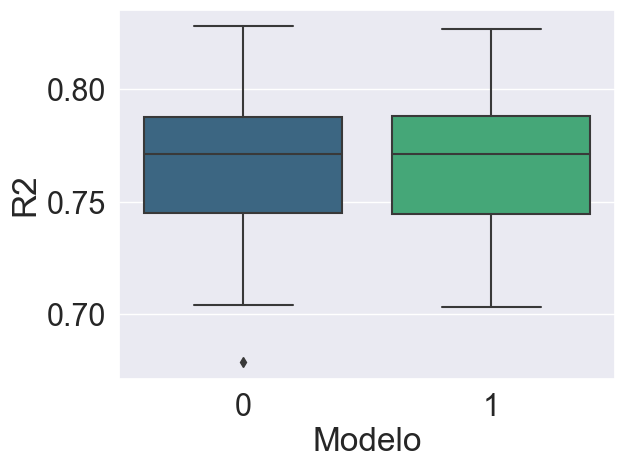

In [35]:
# Boxplot paralelo para comparar
sns.boxplot(x='Modelo',y='R2',data=results_ni,palette='viridis')

- Modelo 0 = modelo completo: fev ~ age + height + sex + smoke
- Modelo 1 = modelo backward: fev ~ age + height + sex --> funciona mejor que 0

#### Seleccion automatica de variables sin interacciones


Sequential Backward Selection:
('age', 'height', 'sex')
CV Score:

Sequential Forward Selection:
('age', 'height')
CV Score:
0.7516891963163784
Coeficiente de determinación R2: 0.768 (0.026)
Coeficiente de determinación R2: 0.761 (0.027)


<AxesSubplot:xlabel='Modelo', ylabel='R2'>

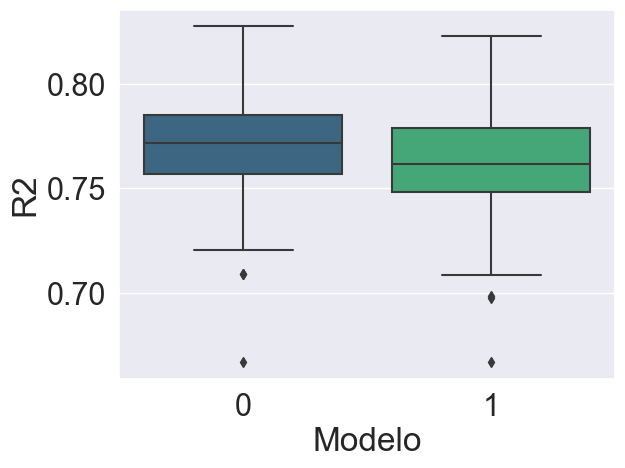

In [60]:
from sklearn.linear_model import LinearRegression
from mlxtend.feature_selection import SequentialFeatureSelector as sfs

clf = LinearRegression()

# Build step forward feature selection
sfs_back = sfs(clf,k_features = 'best',forward=False,floating=False, scoring='r2',cv=5)

# Perform SFFS
sfs_back = sfs_back.fit(X_train, y_train)

#print(sfs1.subsets_)

print('\nSequential Backward Selection:')
print(sfs_back.k_feature_names_)
print('CV Score:')
sfs_back.k_score_

pd.DataFrame.from_dict(sfs_back.get_metric_dict()).T

# Sequential Forward Selection
sfs_forw = sfs(clf, 
          k_features='parsimonious', 
          forward=True, 
          floating=False, 
          scoring='r2',
          cv=4)

sfs_forw = sfs_forw.fit(X_train, y_train)

print('\nSequential Forward Selection:')
print(sfs_forw.k_feature_names_)
print('CV Score:')
print(sfs_forw.k_score_)

# Proceso backward
pd.DataFrame.from_dict(sfs_forw.get_metric_dict()).T


#Comparacion por validacion cruzada

list_sfs = [sfs_back,sfs_forw]
list_sfs

model =LinearRegression()

def cross_val (sfs, data, y, seed=12345):
        
        X = sfs

        if not isinstance(sfs,pd.DataFrame):
            X = sfs.transform(data)

        # Establecemos esquema de validación fijando random_state (reproducibilidad)
        cv = RepeatedKFold(n_splits=5, n_repeats=20, random_state=seed)

        # Obtenemos los resultados de R2 para cada partición tr-tst
        scores = cross_val_score(model, X, y, cv=cv)

        # Sesgo y varianza
        print('Coeficiente de determinación R2: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

       # sns.violinplot(y=scores,palette='viridis')

        return(scores)

list_res_sfs = pd.DataFrame(map(lambda x: cross_val(x,imput,varObj, seed=2435),list_sfs))

#Trasponer dataframe y pasar de wide a long


results_sfs = list_res_sfs.T.melt()
results_sfs.columns = ['Modelo','R2']
results_sfs.head()

# Boxplot paralelo para comparar
sns.boxplot(x='Modelo',y='R2',data=results_sfs,palette='viridis')

- Modelo 0: automático Backward: fev ~ age + height + sex --> funciona mejor que 1
- Modelo 1: automático Forward: fev ~ age + height 

**MODELO FINAL SIN INTERACCIONES**

El modelo final elegido sin interacciones es el modelo backward, que ha resultado igual manualmente que automático:
**fev ~ age + height + sex**

- R2 de 0.768 > R2 de 0.756 del modelo completo 
- Sesgo y varianza de 0.031 < 0.035 del modelo completo
- En ambos aspectos, el modelo backwards tiene mejores resultados. También se observa en los boxplots, sonde vemos su distribución situada más hacia arriba (es decir, con más R2)


### 1.3 Regresion Lineal con interacciones

In [61]:
form3 = 'fev ~ age + height + age*height + sex + smoke'

modeloC3 = ols(form3,data=data_train).fit()
modeloC3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.787
Model:                            OLS   Adj. R-squared:                  0.785
Method:                 Least Squares   F-statistic:                     381.7
Date:                Thu, 22 Dec 2022   Prob (F-statistic):          6.56e-171
Time:                        13:06:29   Log-Likelihood:                -256.48
No. Observations:                 523   AIC:                             525.0
Df Residuals:                     517   BIC:                             550.5
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.5653      0.590     -0.957      0.339      -1.725       0.595
sex[T.2]      -0.0899      0.037     -2.442      0.015      -0.162      -0.018
smoke[T.2]     0.1166      0.064      1.829      0.068      -0.009       0.242
age           -0.3959      0.065     -6.081      0.000      -0.524      -0.268
height         0.0408      0.010      3.984      0.000       0.021       0.061
age:height     0.0073      0.001      7.148      0.000       0.005       0.009
==============================================================================
Omnibus:                       14.027   Durbin-Watson:                   2.049
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               28.239
Skew:                          -0.008   Prob(JB):                     7.38e-07
Kurtosis:                       4.138   Cond. No.                     2.26e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.26e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [62]:
form4 = 'fev ~ age + height + age*height + sex'

modeloC4 = ols(form4,data=data_train).fit()
modeloC4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.785
Model:                            OLS   Adj. R-squared:                  0.784
Method:                 Least Squares   F-statistic:                     474.1
Date:                Thu, 22 Dec 2022   Prob (F-statistic):          1.49e-171
Time:                        13:06:30   Log-Likelihood:                -258.17
No. Observations:                 523   AIC:                             526.3
Df Residuals:                     518   BIC:                             547.6
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.5429      0.592     -0.918      0.359      -1.705       0.619
sex[T.2]      -0.0968      0.037     -2.635      0.009      -0.169      -0.025
age           -0.3881      0.065     -5.961      0.000      -0.516      -0.260
height         0.0431      0.010      4.229      0.000       0.023       0.063
age:height     0.0071      0.001      6.971      0.000       0.005       0.009
==============================================================================
Omnibus:                       14.277   Durbin-Watson:                   2.066
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               28.474
Skew:                          -0.054   Prob(JB):                     6.56e-07
Kurtosis:                       4.138   Cond. No.                     2.26e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.26e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [63]:
form5 = 'fev ~ age + height + sex + sex*height*age'

modeloC5 = ols(form5,data=data_train).fit()
modeloC5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.798
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     290.1
Date:                Thu, 22 Dec 2022   Prob (F-statistic):          3.59e-174
Time:                        13:06:31   Log-Likelihood:                -242.78
No. Observations:                 523   AIC:                             501.6
Df Residuals:                     515   BIC:                             535.6
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               0.4564      0.762      0.599      0.549      -1.040       1.953
sex[T.2]               -4.0869      1.224     -3.339      0.001      -6.491      -1.682
age                    -0.5609      0.086     -6.560      0.000      -0.729      -0.393
sex[T.2]:age            0.6852      0.144      4.755      0.000       0.402       0.968
height                  0.0280      0.013      2.167      0.031       0.003       0.053
sex[T.2]:height         0.0626      0.021      3.000      0.003       0.022       0.104
height:age              0.0098      0.001      7.535      0.000       0.007       0.012
sex[T.2]:height:age    -0.0108      0.002     -4.751      0.000      -0.015      -0.006
==============================================================================
Omnibus:                        8.126   Durbin-Watson:                   2.093
Prob(Omnibus):                  0.017   Jarque-Bera (JB):               12.686
Skew:                          -0.014   Prob(JB):                      0.00176
Kurtosis:                       3.762   Cond. No.                     5.90e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.9e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [64]:
form6 = 'fev ~ height*sex + age'

modeloC6 = ols(form6,data=data_train).fit()
modeloC6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.775
Model:                            OLS   Adj. R-squared:                  0.773
Method:                 Least Squares   F-statistic:                     446.5
Date:                Thu, 22 Dec 2022   Prob (F-statistic):          2.74e-166
Time:                        13:06:31   Log-Likelihood:                -270.42
No. Observations:                 523   AIC:                             550.8
Df Residuals:                     518   BIC:                             572.1
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          -4.8677      0.283    -17.193      0.000      -5.424      -4.311
sex[T.2]            1.8025      0.413      4.368      0.000       0.992       2.613
height              0.1128      0.006     20.117      0.000       0.102       0.124
height:sex[T.2]    -0.0322      0.007     -4.760      0.000      -0.045      -0.019
age                 0.0662      0.011      6.276      0.000       0.045       0.087
==============================================================================
Omnibus:                        6.036   Durbin-Watson:                   2.109
Prob(Omnibus):                  0.049   Jarque-Bera (JB):                7.799
Skew:                           0.090   Prob(JB):                       0.0203
Kurtosis:                       3.570   Cond. No.                     1.74e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.74e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [69]:
#Comparacion por validacion cruzada

list_form = [form, form2, form3, form4, form5, form6]
list_form

['fev ~ age + height + sex + smoke',
 'fev ~ age + height + sex',
 'fev ~ age + height + age*height + sex + smoke',
 'fev ~ age + height + age*height + sex',
 'fev ~ age + height + sex + sex*height*age',
 'fev ~ height*sex + age']

In [70]:
#Trasponer dataframe y pasar de wide a long

list_res = pd.DataFrame(map(lambda x: cross_val_lin(x,fev, seed=2022),list_form))

Modelo: fev ~ age + height + sex + smoke
Coeficiente de determinación R2: 0.767 (0.030)
Modelo: fev ~ age + height + sex
Coeficiente de determinación R2: 0.767 (0.029)
Modelo: fev ~ age + height + age*height + sex + smoke
Coeficiente de determinación R2: 0.786 (0.033)
Modelo: fev ~ age + height + age*height + sex
Coeficiente de determinación R2: 0.786 (0.032)
Modelo: fev ~ age + height + sex + sex*height*age
Coeficiente de determinación R2: 0.793 (0.030)
Modelo: fev ~ height*sex + age
Coeficiente de determinación R2: 0.777 (0.029)


In [71]:
#R2 de cada modelo

results_int = list_res.T.melt()
results_int.columns = ['Modelo','R2']
results_int.head()

,Modelo,R2
0,0,0.786218
1,0,0.711223
2,0,0.817981
3,0,0.743759
4,0,0.767015


<AxesSubplot:xlabel='Modelo', ylabel='R2'>

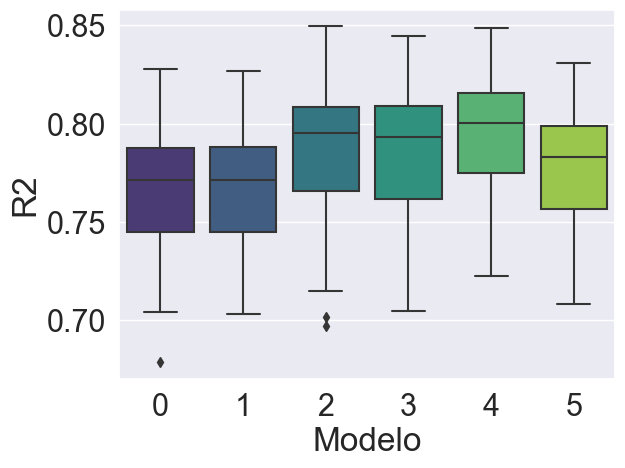

In [72]:
# Boxplot paralelo para comparar
sns.boxplot(x='Modelo',y='R2',data=results_int,palette='viridis')

El mejor modelo manual con interacciones es el 4 (form 5, con triple interacción entre age * height * smoke)
-  **'fev ~ age + height + sex + sex*height*age'**

**Seleccion de variables con interacciones**

In [73]:
sel_col = ['sex', 'age', 'height', 'smoke']

imput_red = imput[sel_col]
X_train_red = X_train[sel_col]

In [74]:
from sklearn.preprocessing import OneHotEncoder, PolynomialFeatures 

interaction = PolynomialFeatures(degree=3, include_bias=False, interaction_only=True)
interaction


PolynomialFeatures(degree=3, include_bias=False, interaction_only=True)

In [75]:
imput_inter = pd.DataFrame(interaction.fit_transform(imput_red), columns=interaction.get_feature_names_out(input_features=imput_red.columns))
X_inter = pd.DataFrame(interaction.fit_transform(X_train_red), columns=interaction.get_feature_names_out(input_features=X_train_red.columns))
X_inter.head(3)

,sex,age,height,smoke,sex age,sex height,sex smoke,age height,age smoke,height smoke,sex age height,sex age smoke,sex height smoke,age height smoke
0,1.0,12.0,71.0,2.0,12.0,71.0,2.0,852.0,24.0,142.0,852.0,24.0,142.0,1704.0
1,1.0,12.0,68.0,2.0,12.0,68.0,2.0,816.0,24.0,136.0,816.0,24.0,136.0,1632.0
2,1.0,10.0,62.0,2.0,10.0,62.0,2.0,620.0,20.0,124.0,620.0,20.0,124.0,1240.0


In [76]:
# Eliminar columnas constantes (interacciones sin sentido)
X_inter = X_inter.loc[:, X_inter.var() != 0.0]

X_inter.head(3)

,sex,age,height,smoke,sex age,sex height,sex smoke,age height,age smoke,height smoke,sex age height,sex age smoke,sex height smoke,age height smoke
0,1.0,12.0,71.0,2.0,12.0,71.0,2.0,852.0,24.0,142.0,852.0,24.0,142.0,1704.0
1,1.0,12.0,68.0,2.0,12.0,68.0,2.0,816.0,24.0,136.0,816.0,24.0,136.0,1632.0
2,1.0,10.0,62.0,2.0,10.0,62.0,2.0,620.0,20.0,124.0,620.0,20.0,124.0,1240.0


In [77]:
# Sequential Backward Selection
sfs_back_int = sfs(clf, 
          k_features=10, 
          forward=False, 
          floating=False, 
          scoring='r2',
          cv=4)

sfs_back_int = sfs_back_int.fit(X_inter, y_train)

print('\nSequential Backward Selection:')
print(sfs_back_int.k_feature_names_)
print('CV Score:')
print(sfs_back_int.k_score_)


Sequential Backward Selection:
('sex', 'age', 'sex age', 'sex height', 'sex smoke', 'age height', 'age smoke', 'sex age height', 'sex height smoke', 'age height smoke')
CV Score:
0.7939658101776007


In [78]:
# Sequential Forward Selection
sfs_forw_int = sfs(clf, 
          k_features='best', 
          forward=True, 
          floating=False, 
          scoring='r2',
          cv=4)

sfs_forw_int = sfs_forw_int.fit(X_inter, y_train)

print('\nSequential Backward Selection:')
print(sfs_forw_int.k_feature_names_)
print('CV Score:')
print(sfs_forw_int.k_score_)


Sequential Backward Selection:
('sex', 'age', 'height', 'smoke', 'sex age', 'sex height', 'sex smoke', 'age height', 'age smoke', 'sex age height', 'sex age smoke', 'sex height smoke', 'age height smoke')
CV Score:
0.7931226214523637


In [79]:
#Comparacion con validacion cruzada

list_sfs_int = [sfs_back_int,sfs_forw_int]
list_sfs_int

[SequentialFeatureSelector(cv=4, estimator=LinearRegression(), forward=False,
                           k_features=(10, 10), scoring='r2'),
 SequentialFeatureSelector(cv=4, estimator=LinearRegression(),
                           k_features=(1, 14), scoring='r2')]

In [80]:
model =LinearRegression()
list_res_sfs_int = pd.DataFrame(map(lambda x: cross_val(x,imput,varObj, seed=2435),list_sfs))



Coeficiente de determinación R2: 0.768 (0.026)
Coeficiente de determinación R2: 0.761 (0.027)


In [81]:
results_sfs_int = list_res_sfs_int.T.melt()
results_sfs_int.columns = ['Modelo','R2']
results_sfs_int.head()

,Modelo,R2
0,0,0.773584
1,0,0.801072
2,0,0.775185
3,0,0.786717
4,0,0.666755


<AxesSubplot:xlabel='Modelo', ylabel='R2'>

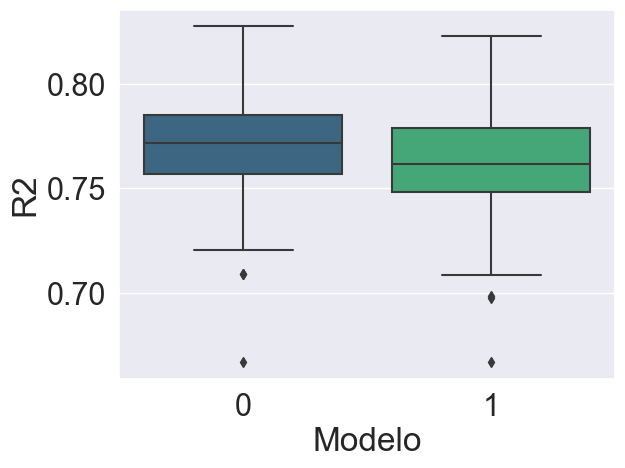

In [82]:
# Boxplot paralelo para comparar
sns.boxplot(x='Modelo',y='R2',data=results_sfs_int,palette='viridis')

Los modelos de interacciones automáticos no superan en R2 al modelo manual: **'fev ~ age + height + sex + sexheightage'**, que quedaría como modelo final con interacciones

### 1.4 Elección de modelo final por VC

Modelo: fev ~ age + height + sex
Coeficiente de determinación R2: 0.767 (0.029)
Modelo: fev ~ age + height + sex + sex*height*age
Coeficiente de determinación R2: 0.793 (0.030)


<AxesSubplot:xlabel='Modelo', ylabel='R2'>

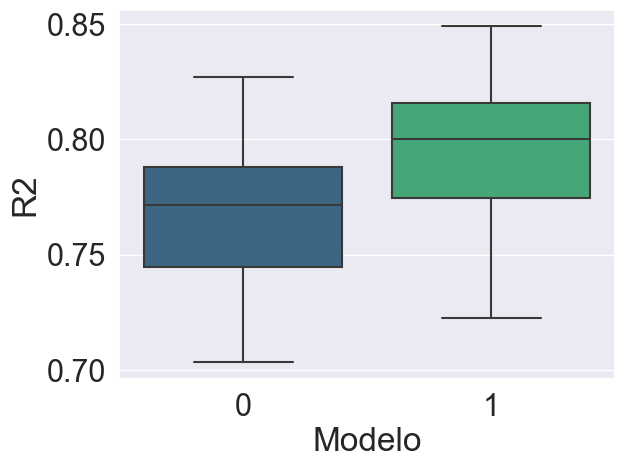

In [85]:
final = [form2, form5]
list_final = pd.DataFrame(map(lambda x: cross_val_lin(x,fev, seed=2022),final))
results_final = list_final.T.melt()
results_final.columns = ['Modelo','R2']
results_final.head()
sns.boxplot(x='Modelo',y='R2',data=results_final,palette='viridis')

El mejor modelo final es el modelo con interacciones:
- **'fev ~ age + height + sex + sexheightage'**
- R2 de 0.793 (interacciones) frente a 0.767 (sin interacciones)
- Varianza de 0.030 (interacciones) frente a 0.029 (sin interacciones), un poco peor en este caso para el modelo con iteracciones, aunque teniendo en cuenta el R2 es un modelo mejor

Como se veía en el summary del modelo, los coeficientes son significativos al 5%. Al tratarse de una triple interacción, el efecto en fev de un aumento marginal en age cuando no cambian height ni sex sería una disminución de -0.56. (coeficiente age) Si age va acompañada de un aumento unitario en height, el efecto en fev sería de -0.56 + 0.028 + 0.0098. (coeficiente age, height, age*height) Si el aumento en age va acompañado de un aumento en height y un cambio de clase en sex, el efecto en fev sería aplicando todos los coeficientes. (age, height, sex, age*height, age*sex, height*sex, age*height*sex)



## Ejercicio 3

### 3.1- Lectura y representación de la serie. Descomposición. Conclusiones.


In [129]:
# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

In [130]:
from NuestrasFunciones_Def import *

defunciones = pd.read_excel('defunciones.xlsx')
defunciones.head()

,,Todas las causas,Tumores,Causas externas
0,1980M01,28681,4883,1277
1,1980M02,23906,4493,1122
2,1980M03,25275,4957,1244
3,1980M04,22500,4523,1214
4,1980M05,22781,4893,1228


In [131]:
fechas = pd.date_range('1980-01-01','2018-12-01', 
              freq='MS').strftime("%Y-%m").tolist()
fechas = pd.Series(fechas)

# Unir en un data
defun = pd.concat([fechas,defunciones], axis=1)
defun.columns = ['Month','index','Todas las causas', 'Tumores', 'Causas externas']
defun = defun.drop(['index'], axis=1)
defun.head()

,Month,Todas las causas,Tumores,Causas externas
0,1980-01,28681,4883,1277
1,1980-02,23906,4493,1122
2,1980-03,25275,4957,1244
3,1980-04,22500,4523,1214
4,1980-05,22781,4893,1228


In [132]:
# Convertir en serie temporal
defun.set_index(['Month'],inplace=True)
defun.index=pd.to_datetime(defun.index)

defun.head()

,Todas las causas,Tumores,Causas externas
Month,,,
1980-01-01,28681,4883,1277
1980-02-01,23906,4493,1122
1980-03-01,25275,4957,1244
1980-04-01,22500,4523,1214
1980-05-01,22781,4893,1228


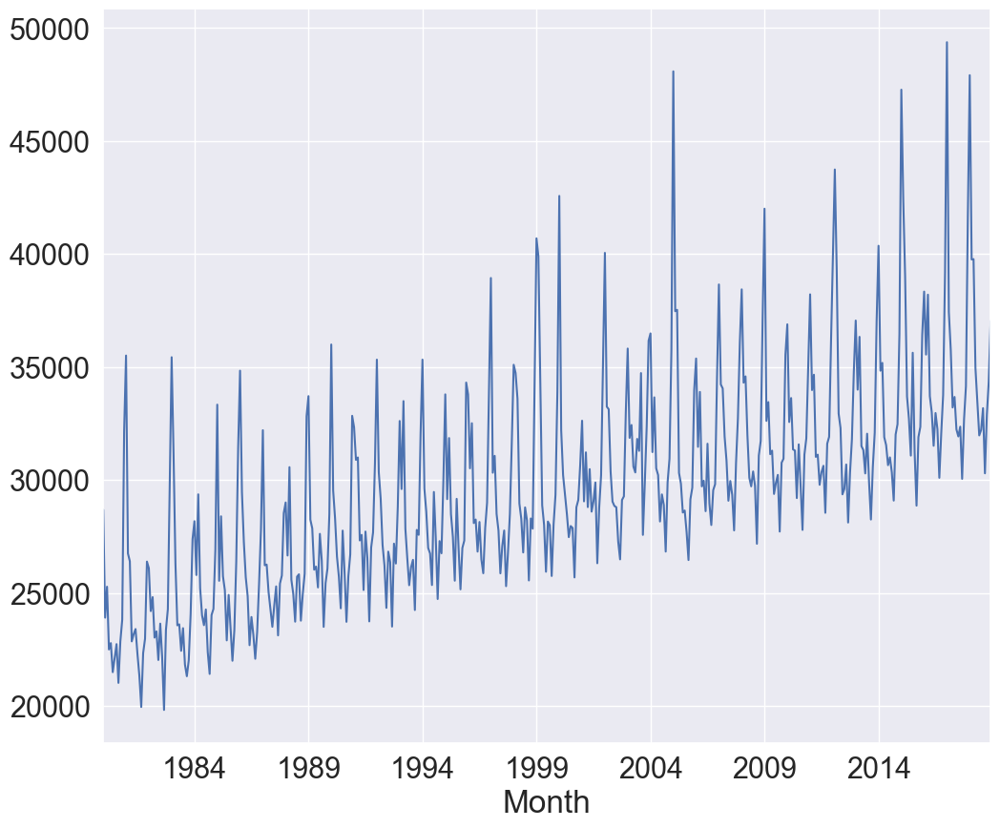

In [133]:
plt.rcParams["figure.figsize"] = (12,10)
defun['Todas las causas'].plot()
plt.show()

In [134]:
test_stationarity(defun['Todas las causas'])

Results of Dickey-Fuller Test:
Test Statistic                  -0.942604
p-value                          0.773619
#Lags Used                      14.000000
Number of Observations Used    453.000000
Critical Value (1%)             -3.444868
Critical Value (5%)             -2.867941
Critical Value (10%)            -2.570180
dtype: float64


Todas las causas:
- Test Dickey Fuller: p-valor alto - mantengo H0: la serie no es estacionaria

**Descomposición de la serie**

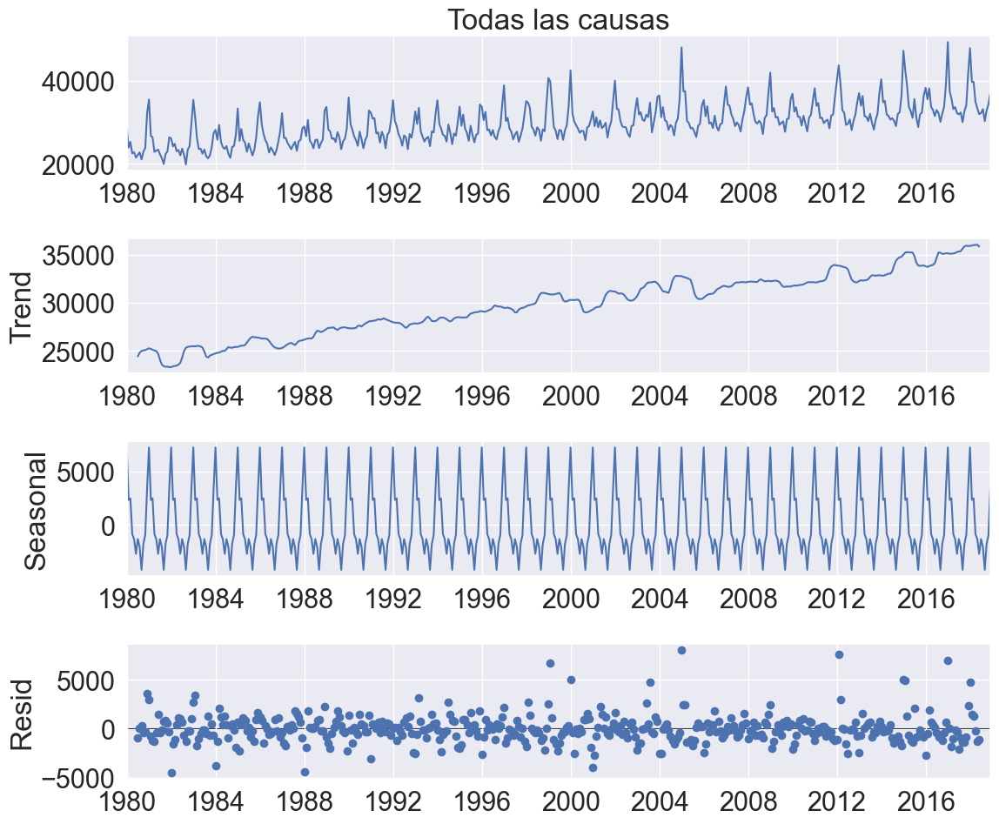

In [135]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Descomposición aditiva
defun_desc_Ad = seasonal_decompose(defun['Todas las causas'], model='additive',period=12)
defun_desc_Ad.plot()
plt.show()

In [136]:
test_stationarity(defun_desc_Ad.resid.dropna())

Results of Dickey-Fuller Test:
Test Statistic                -9.833132e+00
p-value                        4.975783e-17
#Lags Used                     1.800000e+01
Number of Observations Used    4.370000e+02
Critical Value (1%)           -3.445403e+00
Critical Value (5%)           -2.868177e+00
Critical Value (10%)          -2.570305e+00
dtype: float64


p-valor alto, residuos no son estacionarios

**Descomposición multiplicativa**

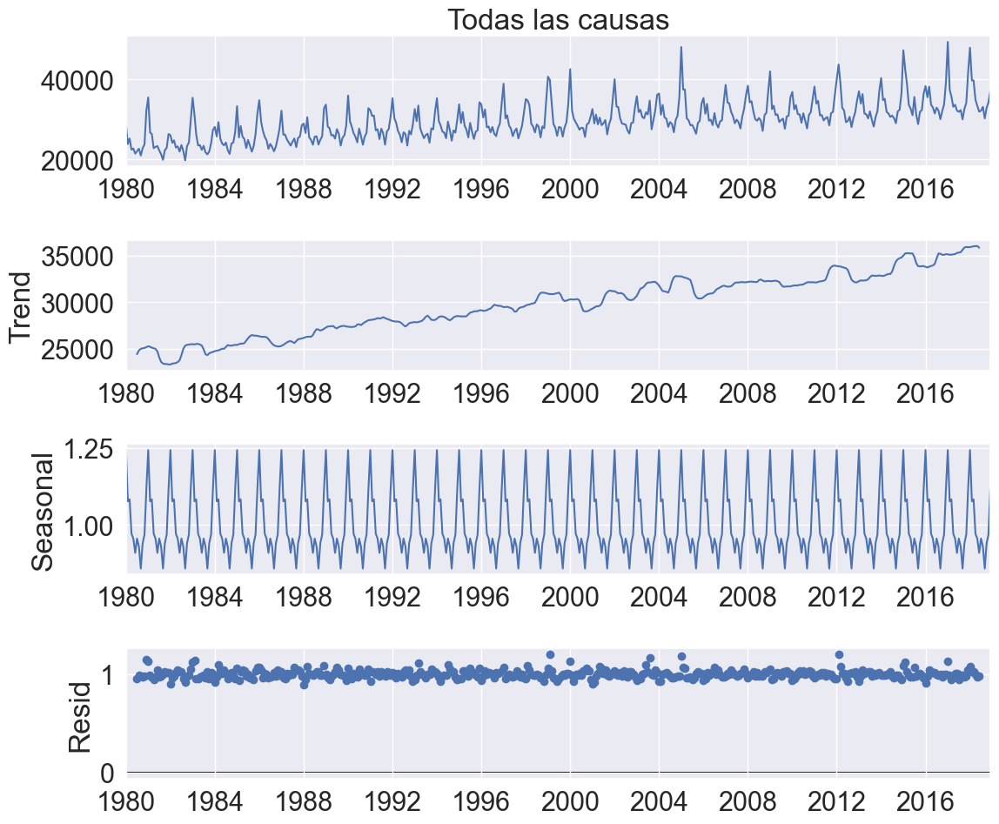

In [137]:
# Descomposición multiplicativa
defun_desc_Mul = seasonal_decompose(defun['Todas las causas'], model='multiplicative',period=12)
defun_desc_Mul.plot()
plt.show()


In [138]:
test_stationarity(defun_desc_Mul.resid.dropna())

Results of Dickey-Fuller Test:
Test Statistic                -9.977362e+00
p-value                        2.159804e-17
#Lags Used                     1.700000e+01
Number of Observations Used    4.380000e+02
Critical Value (1%)           -3.445368e+00
Critical Value (5%)           -2.868161e+00
Critical Value (10%)          -2.570297e+00
dtype: float64


p-valor alto, los residuos no son estacionarios. Aunque menor valor que con el modelo aditivo, por lo que el multiplicativo se acerca más a la estacionariedad.

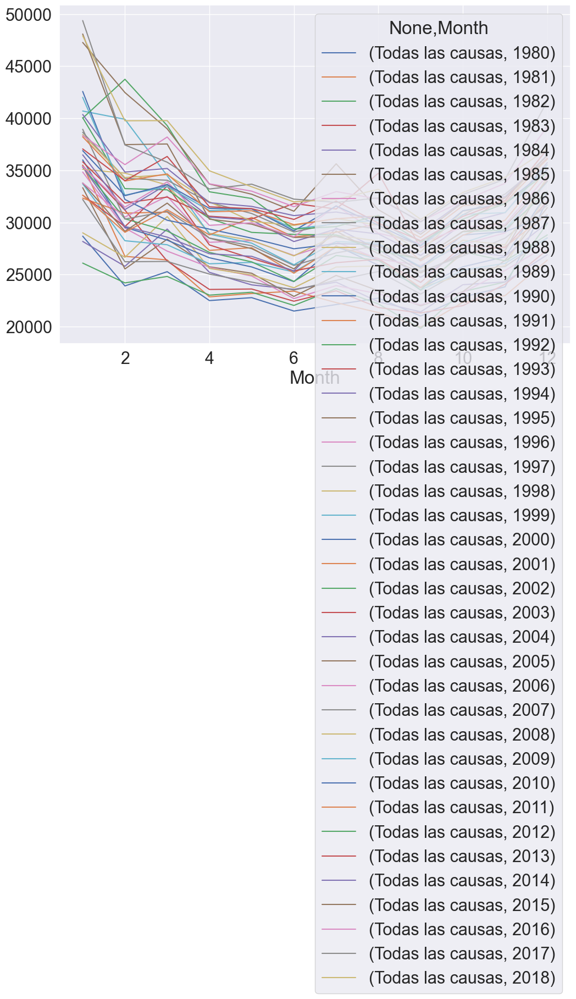

In [139]:
seasonal_plot(defun, column='Todas las causas' )
plt.show()

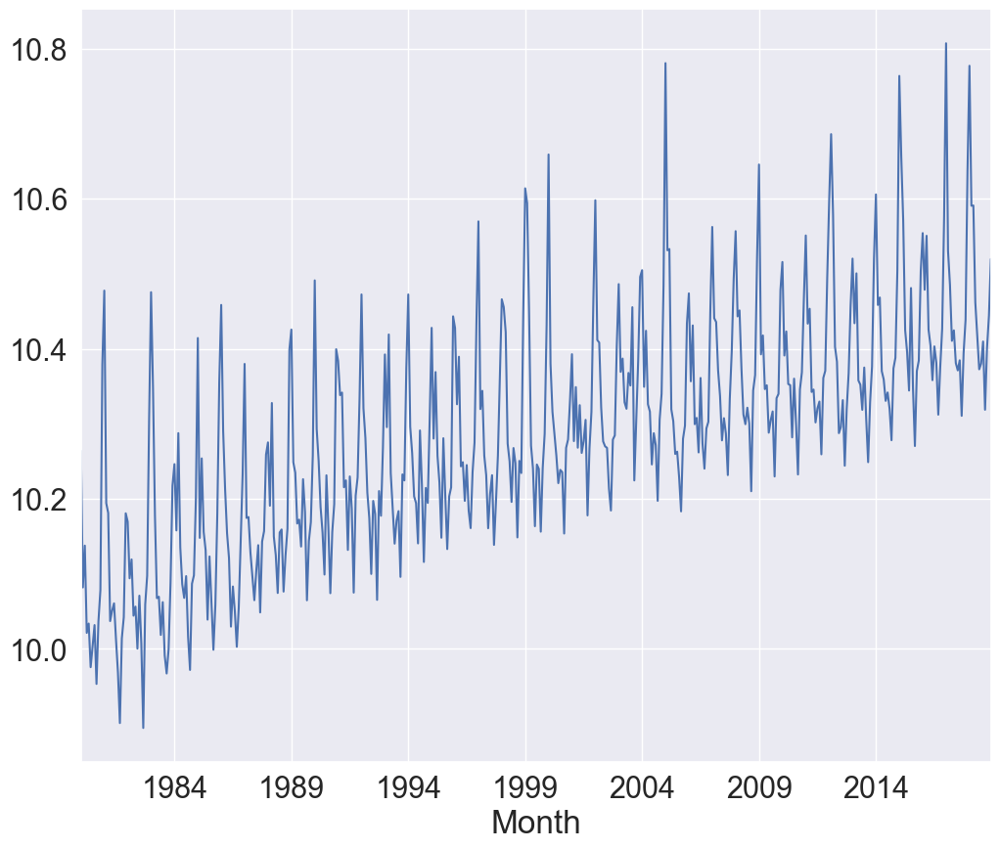

In [140]:
defunLog = np.log(defun['Todas las causas'])
defunLog.plot()
plt.show()

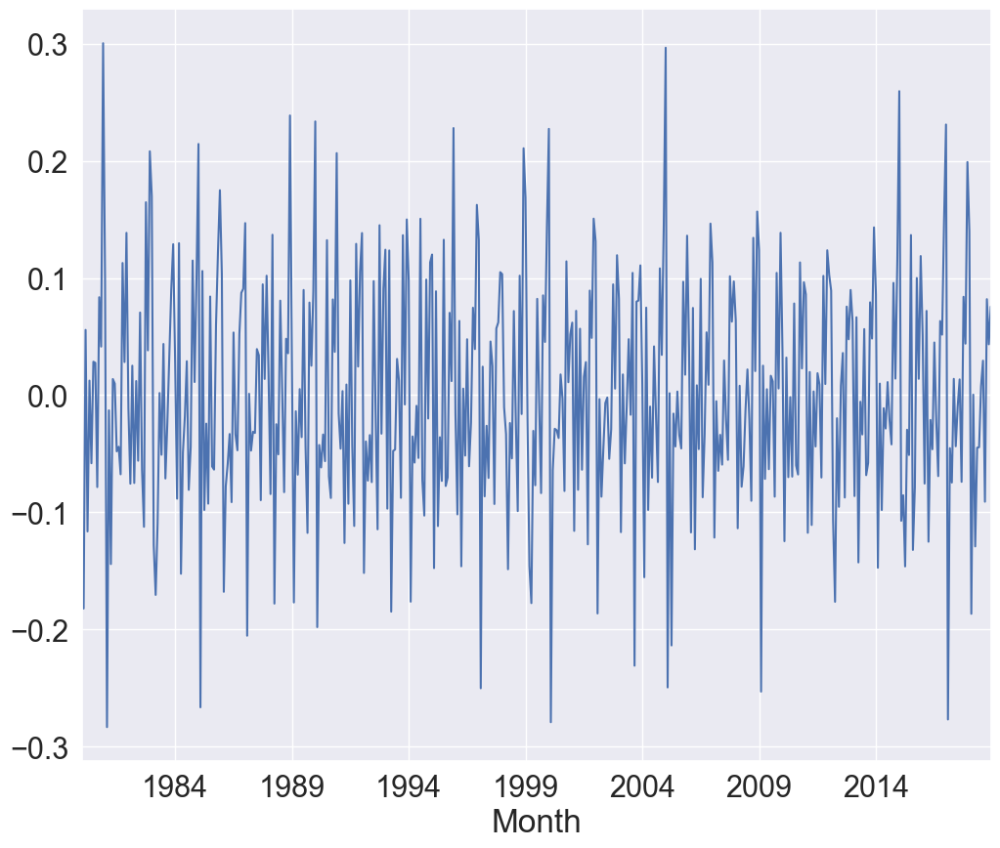

In [141]:
defunLog_diff_1 = defunLog.diff(periods=1)
defunLog_diff_1 .plot()
plt.show()

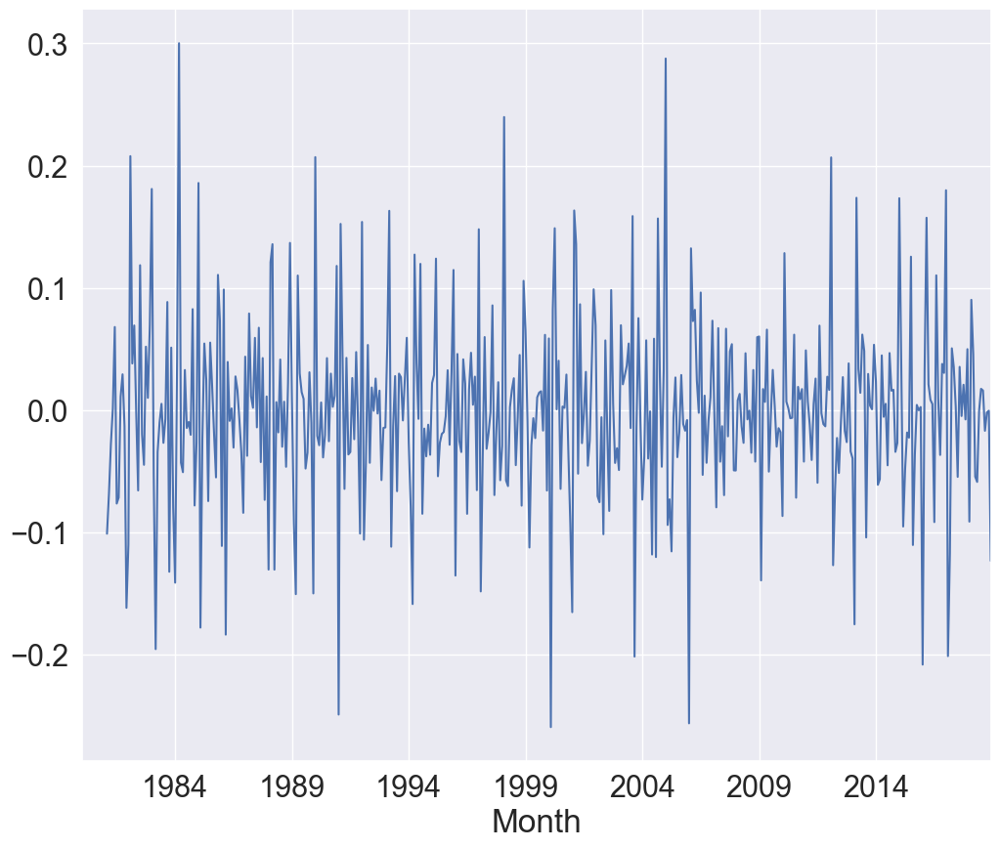

In [142]:
#Diferenciación estacional

defunLog_diff_1_12 = defunLog_diff_1.diff(periods=12)
defunLog_diff_1_12.plot()
plt.show()

In [143]:
#Comprobación de estacionariedad
test_stationarity(defunLog_diff_1_12.dropna(inplace=False))

Results of Dickey-Fuller Test:
Test Statistic                -1.029023e+01
p-value                        3.586141e-18
#Lags Used                     1.700000e+01
Number of Observations Used    4.370000e+02
Critical Value (1%)           -3.445403e+00
Critical Value (5%)           -2.868177e+00
Critical Value (10%)          -2.570305e+00
dtype: float64


In [144]:
test_stationarity(defunLog_diff_1.dropna(inplace=False))

Results of Dickey-Fuller Test:
Test Statistic                -9.156472e+00
p-value                        2.601666e-15
#Lags Used                     1.300000e+01
Number of Observations Used    4.530000e+02
Critical Value (1%)           -3.444868e+00
Critical Value (5%)           -2.867941e+00
Critical Value (10%)          -2.570180e+00
dtype: float64


Test Dickey-Fuller

- Diferenciación de orden 1: p-valor inferior a 0.05, la serie es estacional
- Diferenciación de orden 1, y diferenciación estacional: p-valor bajo: la serie es estacional

In [145]:
sm.stats.acorr_ljungbox(defunLog_diff_1_12.dropna(inplace=False), lags=[10], return_df=True)

,lb_stat,lb_pvalue
10,49.055084,3.979652e-07


Test LJung Box:
- H0: los residuos no están autocorrelacionados
    
p valor bajo, rechazo H0. Puede haber autocorrelación en los residuos

In [146]:
sm.stats.acorr_ljungbox(defun['Todas las causas'], lags=[10], return_df=True)

,lb_stat,lb_pvalue
10,830.660066,5.272461e-172


**Conclusiones**

La serie 'Todas las causas' no es estacionaria. Tras hacer una transformación logarítmica, una diferenciación de primer orden y una diferenciación estacional, los residuos no pasan el test de LJung Box. Es decir, no se puede afirmar que los residuos estén extentos de autocorrelación.

### 2- Partición training y test (los últimos 2 años de datos).

In [147]:
#Partición Training y Test

defun2 = defun.copy()
defun2 = defun2.drop(['Tumores', 'Causas externas'],axis=1)
defun2 = np.log(defun2)
defun_tr = defun2[:'2016-12-01']
defun_tst = defun2['2017-01-01':]

- Training: del 1980-01-01 al 2016-12-01 -> 444 observaciones
- Test: del 2017-01-01 al 2018-12-01 -> 24 observaciones
- Realizo el training y test sobre el logaritmo de la serie ya que se aproxima más a la estacionariedad, con un valor en el test LJungBox más favorable.

### 3- Mejor modelo de suavizado exponencial. ¿Pasa el test residual de Ljung.Box?

In [148]:
import statsmodels.tsa.holtwinters as ets
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error

1. Modelo de **suavizado simple**

- LJungBox p-valor = 0.146 -> mantengo H0. Los residuos no están autocorrelacionados
- MAPE: 1.37%

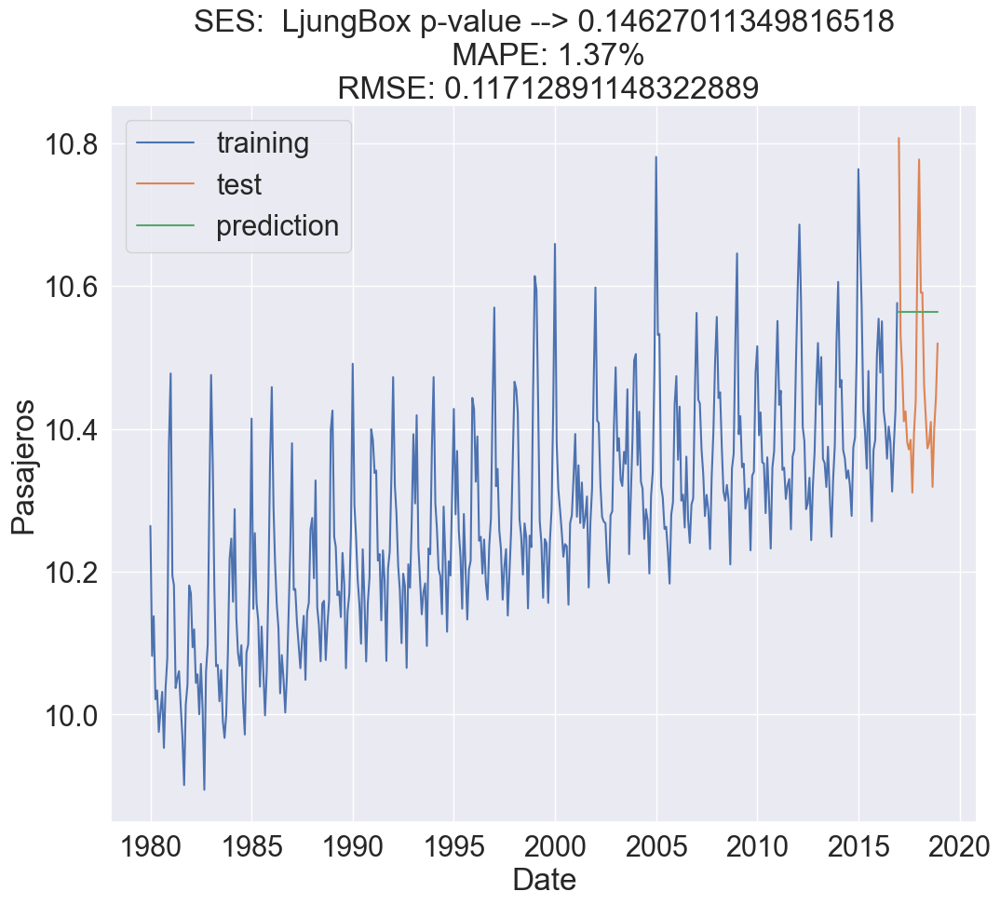

0.14627011349816518


In [149]:
ses = ets.SimpleExpSmoothing(defun_tr).fit()
#ses.summary()
eval_model(ses,defun_tr,defun_tst,'SES')

2. Modelo de **suavizado doble de Holt**

- LJungBox p-valor = 0.146 -> mantengo H0. Los residuos no están autocorrelacionados
- MAPE: 1.43% - ha empeorado respecto al modelo de suavizado simple

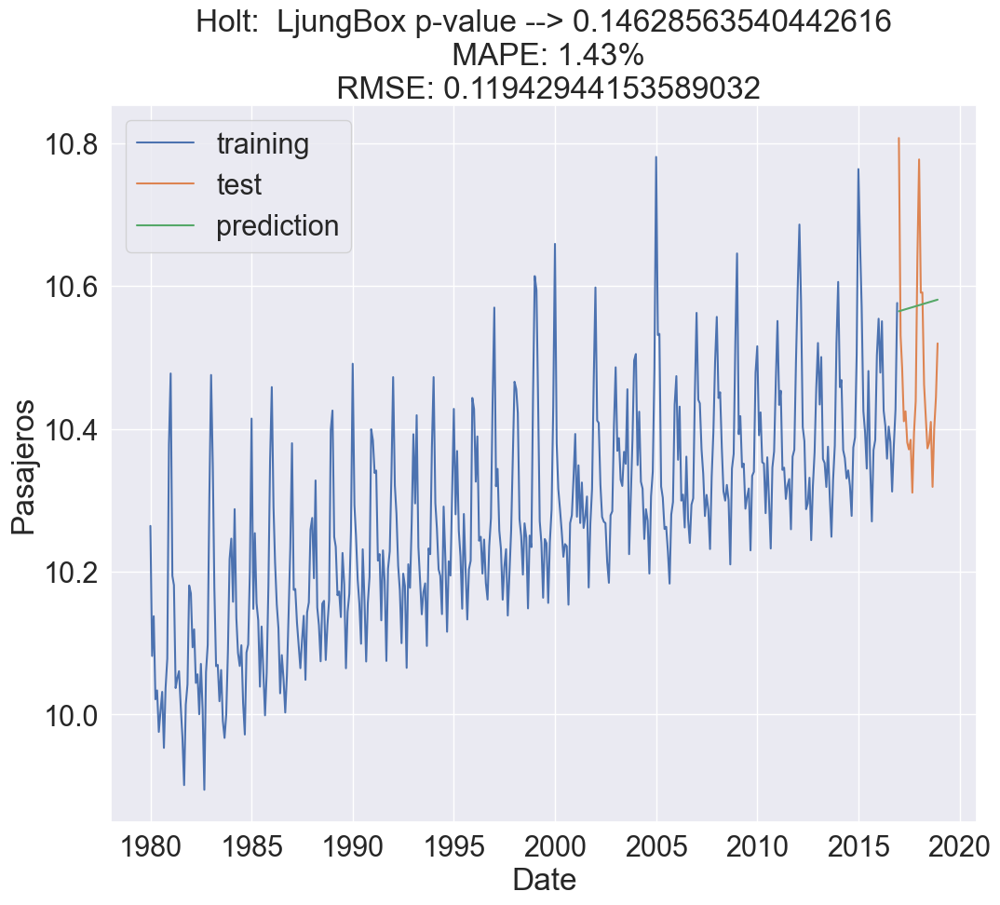

0.14628563540442616


In [150]:
holt = ets.Holt(defun_tr).fit()
#holt.summary()
eval_model(holt,defun_tr,defun_tst,'Holt')

3. Modelo de **suavizado de Holt Winters Aditivo**

- LJungBox p-valor = 0.00015 -> rechazo H0, no pasa el test. Los residuos están autocorrelacionados
- MAPE: 0.3% - ha mejorado respecto a los modelos anteriores

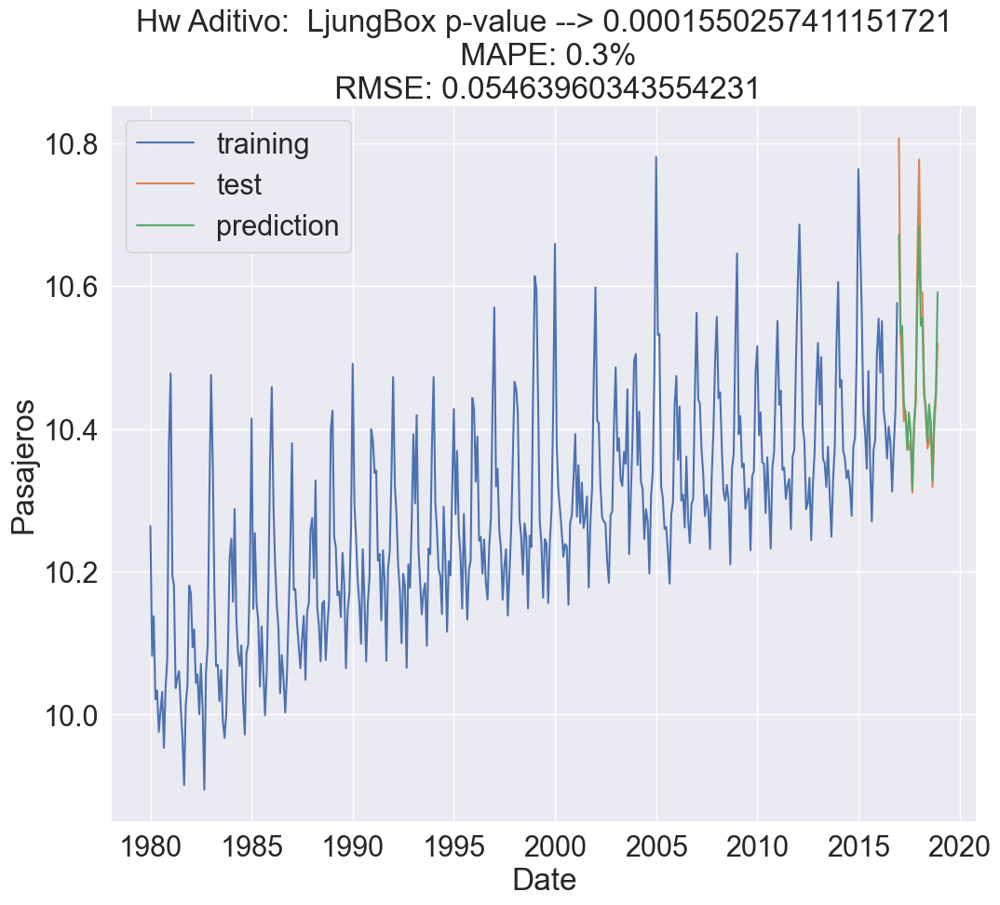

0.0001550257411151721


In [151]:
hw_add = ets.ExponentialSmoothing(defun_tr,trend='add', damped_trend=False, seasonal='add').fit()
#hw_add.summary()
eval_model(hw_add,defun_tr,defun_tst,'Hw Aditivo')

4. Modelo de **suavizado de Holt Winters multiplicativo**

- LJungBox p-valor = 0.00018 -> sigo rechazando H0, no pasa el test. Los residuos están autocorrelacionados. Aunque ha aumentado un poco el valor
- MAPE: 0.29% - ha mejorado un poco

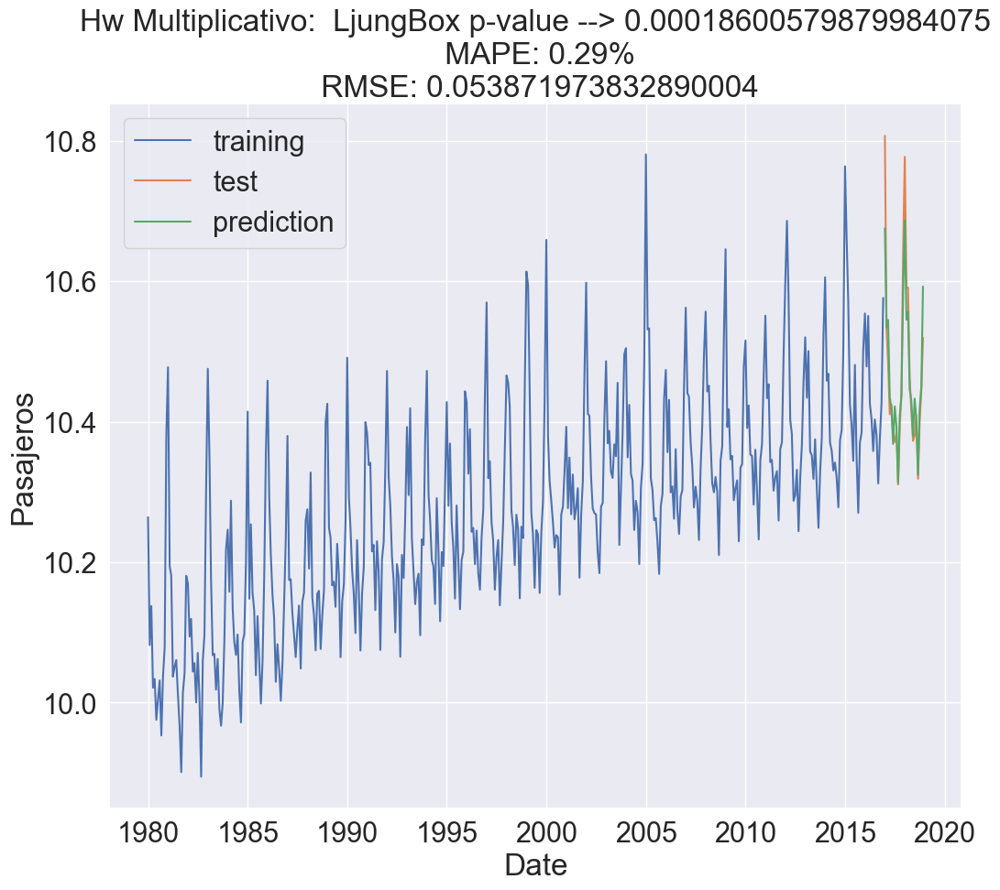

0.00018600579879984075


In [152]:
hw_mul = ets.ExponentialSmoothing(defun_tr,trend='mul', damped_trend=False, seasonal='mul').fit()
#hw_mul.summary()
eval_model(hw_mul,defun_tr,defun_tst,'Hw Multiplicativo')

**Gráficos de autocorrelaciones** con intervalos de confianza

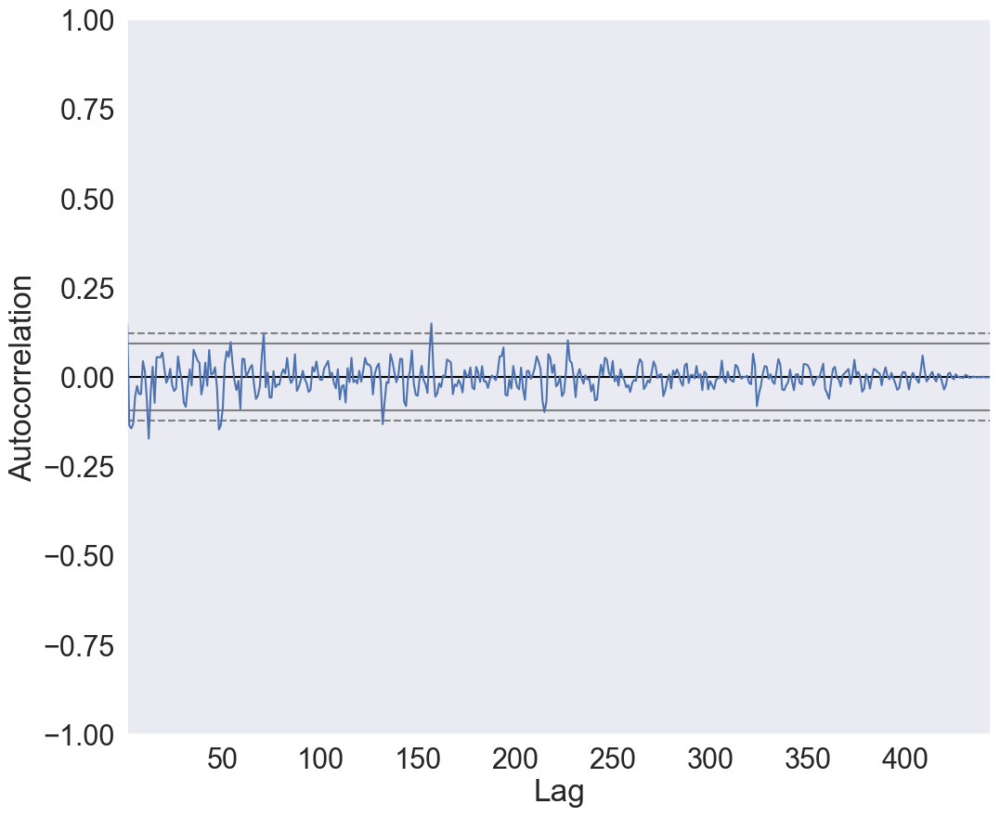

In [153]:
from pandas.plotting import autocorrelation_plot

plt.clf()
autocorrelation_plot(hw_add.resid)
plt.show()

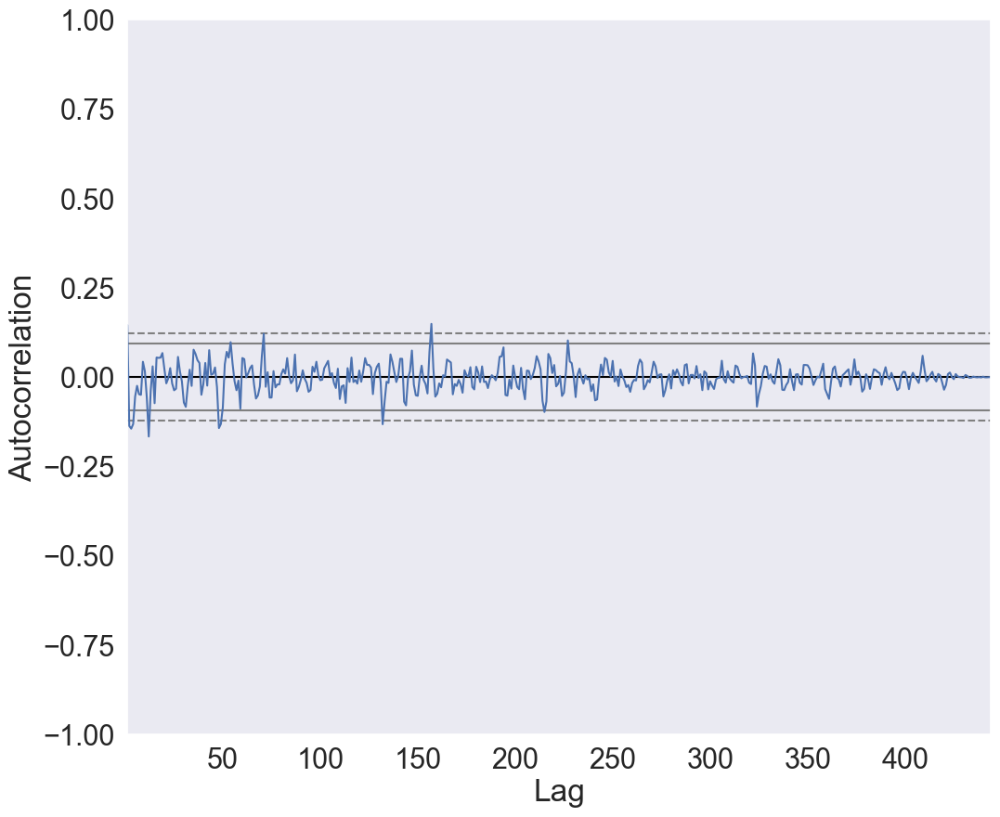

In [154]:
plt.clf()
autocorrelation_plot(hw_mul.resid)
plt.show()

**Conclusión**

Los dos mejores modelos en términos de error y ajuste a la serie temporal son el aditivo y el multiplicativo. Se puede observar esto en el ajuste a la serie en el gráfico, y también en el término de error (MAPE), que es más reducido en estos dos modelos. Ninguno de los dos pasa el test de LJung Box de autocorrelación de errores. Es decir, los errores parecen estar correlacionados. En cuanto a los gráficos de autocorrelaciones, vemos varios puntos que se salen ligeramente de las bandas de confianza. Esto indica la presencia de correlación en errores. 

Aunque casi no hay diferencia entre estos dos modelos, el mejor modelo sería el **Modelo multiplicativo de Holt Winters**, ya que tiene un valor más alto para el test de LJungBox y un valor más reducido en MAPE.

### 4- Mejor modelo ARIMA. ¿Pasa el test residual de Ljung.Box?

**Gráficos de autocorrelaciones**

- ACF y PACF: sin diferenciar

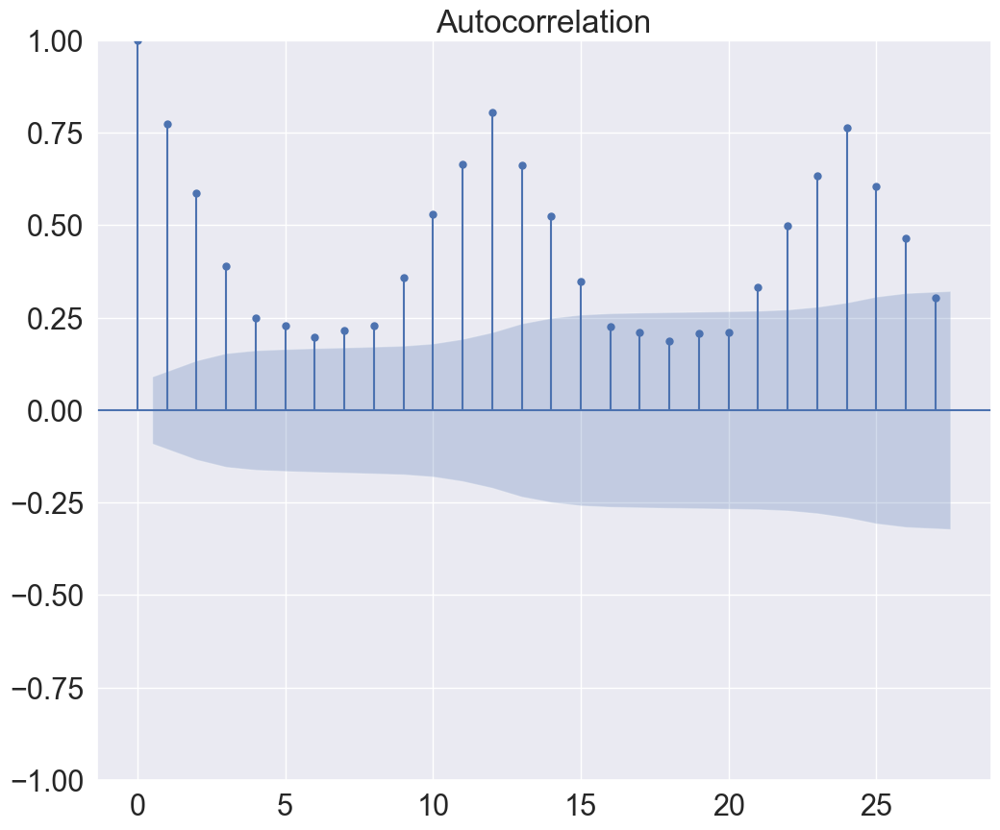

In [155]:
plot_acf(defun.dropna(inplace=False)['Todas las causas'])
plt.show()

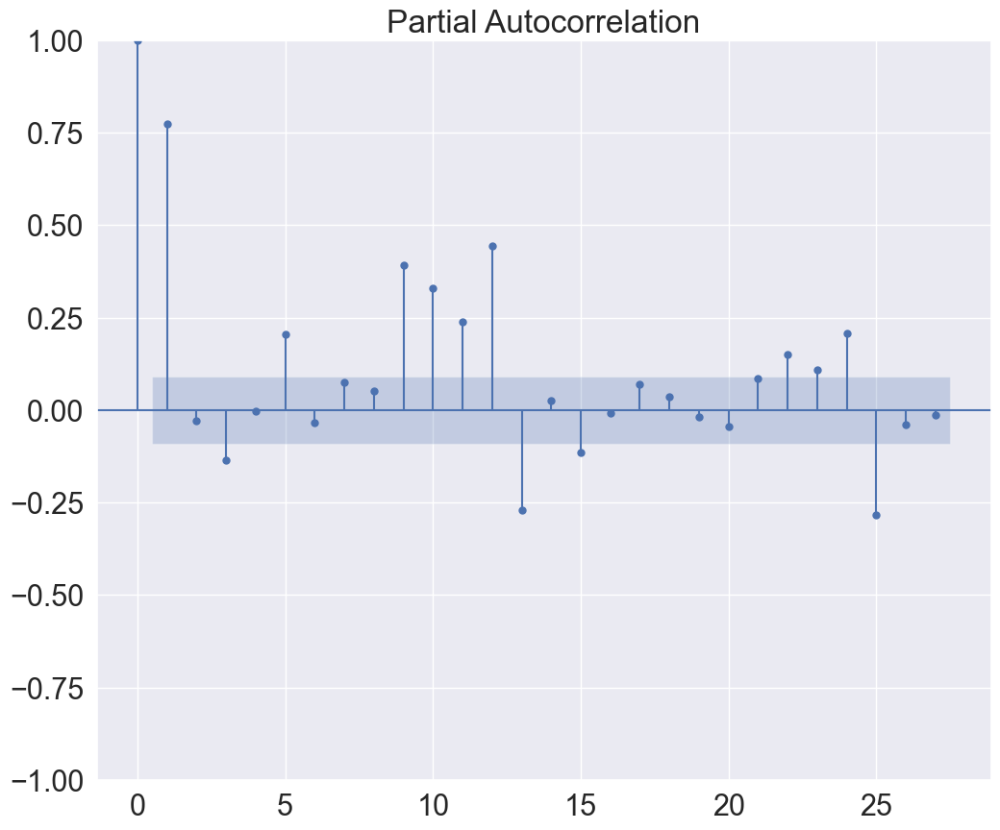

In [156]:
plot_pacf(defun.dropna(inplace=False)['Todas las causas'])
plt.show()

- ACF y PACF: con **diferenciación en lo regular**

Como se veia arriba con el test Dickey Fuller, la serie era estacionaria tras una diferenciación regular, sin ser necesario hacer otra diferenciación en lo estacional. Analizando los gráficos ACF y PACF:

ACF:
- En lo estacional hay dos lags o barras que se salen del área de los intervalos de confianza. Después del primer lag, derecimiento proresivo. Después del segundo, corte. Esto puede indicar un AR(1), MA(2)
- En lo regular, 2 lags y progresivo. AR(2)

PACF:
- Estacional: 2 lags, progresivo. MA(2)
- Regular: 2 lags, progresivo. MA(2)

Modelo final ARIMA(2,1,2)(1,0,2)[12]

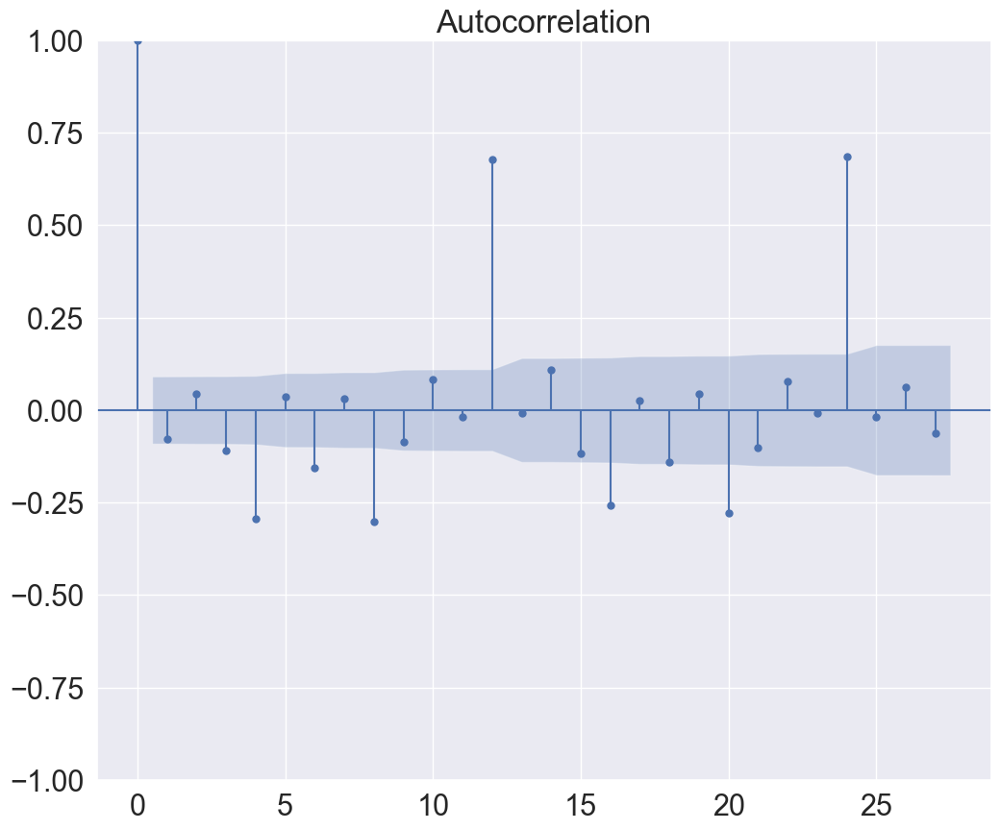

In [157]:
plot_acf(defunLog_diff_1.dropna(inplace=False))
plt.show()

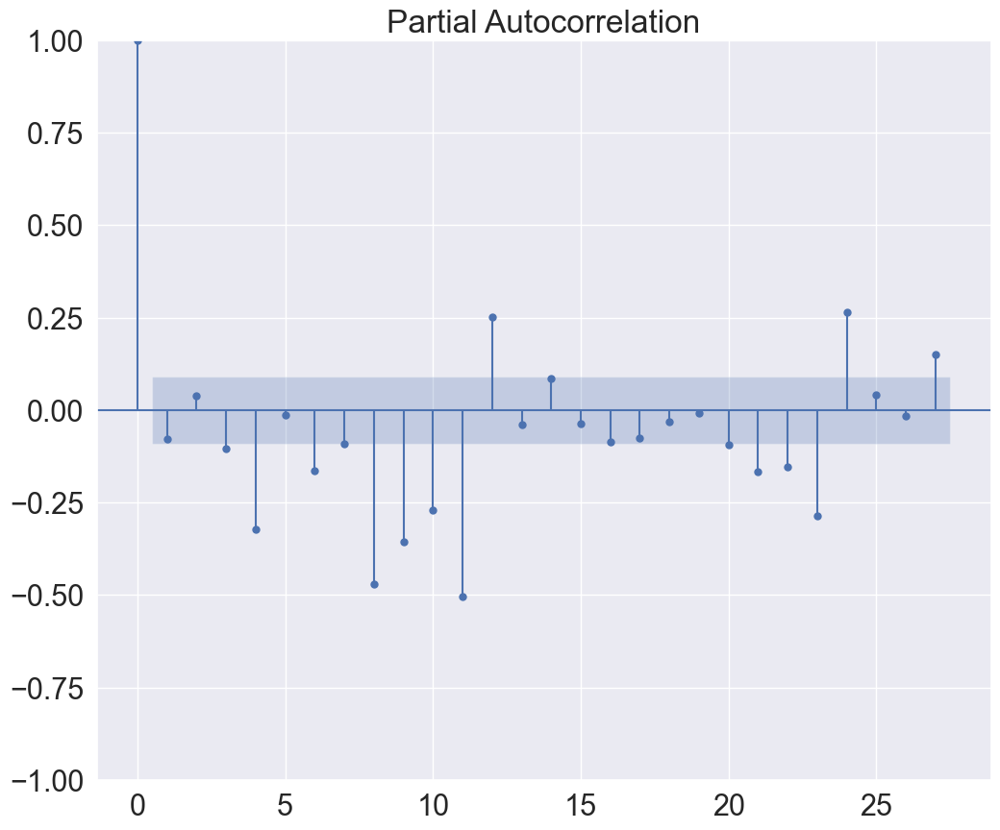

In [158]:
plot_pacf(defunLog_diff_1.dropna(inplace=False))
plt.show()

- ACF y PACF: con **diferenciación en lo regular y en lo estacional**

ACF:
- Estacional: 1-2 lags. Despues del primer lag, progresivo. Después del segundo, corte --> MA(2), AR(1)
- Regular: 2 lags, que podrían seguir o un decrecimiento progresivo o mostrar un corte --> MA(2) ó AR(2)

PACF:
- Estacional: 1-2 lags, progresivo --> MA(2)
- Regular: 2 lags, progresivo --> MA(2)

Modelo final ARIMA:(1,1,2)(1,1,2)[12]

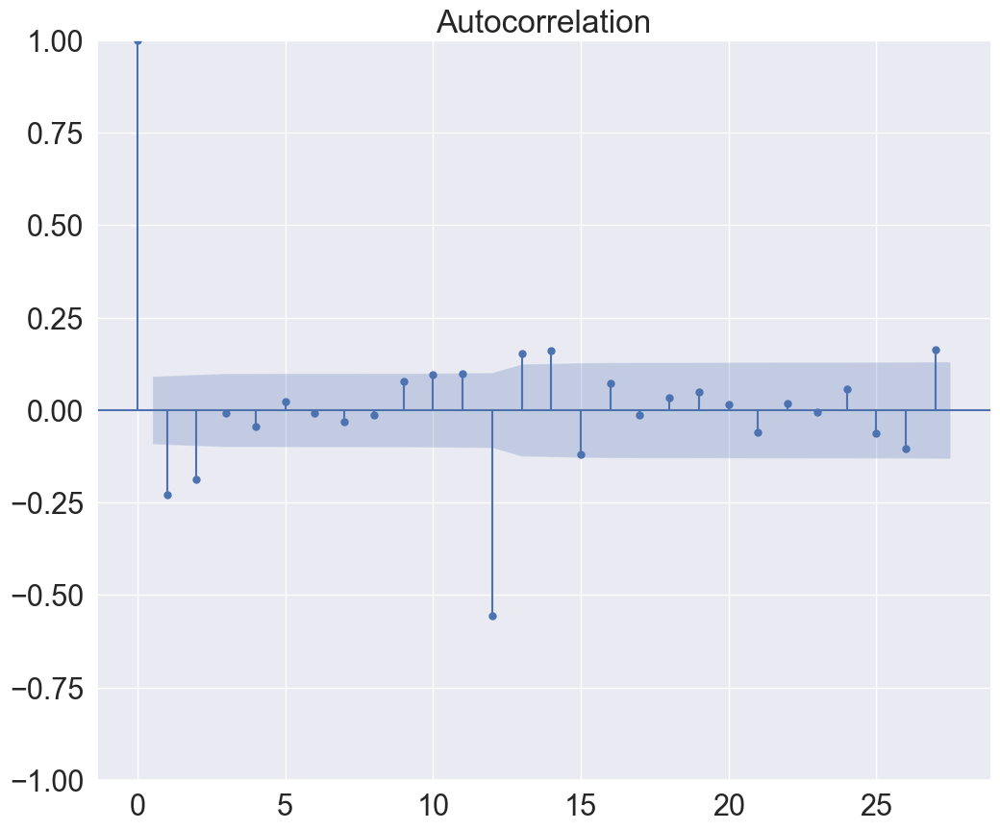

In [159]:
plot_acf(defunLog_diff_1_12.dropna(inplace=False))
plt.show()

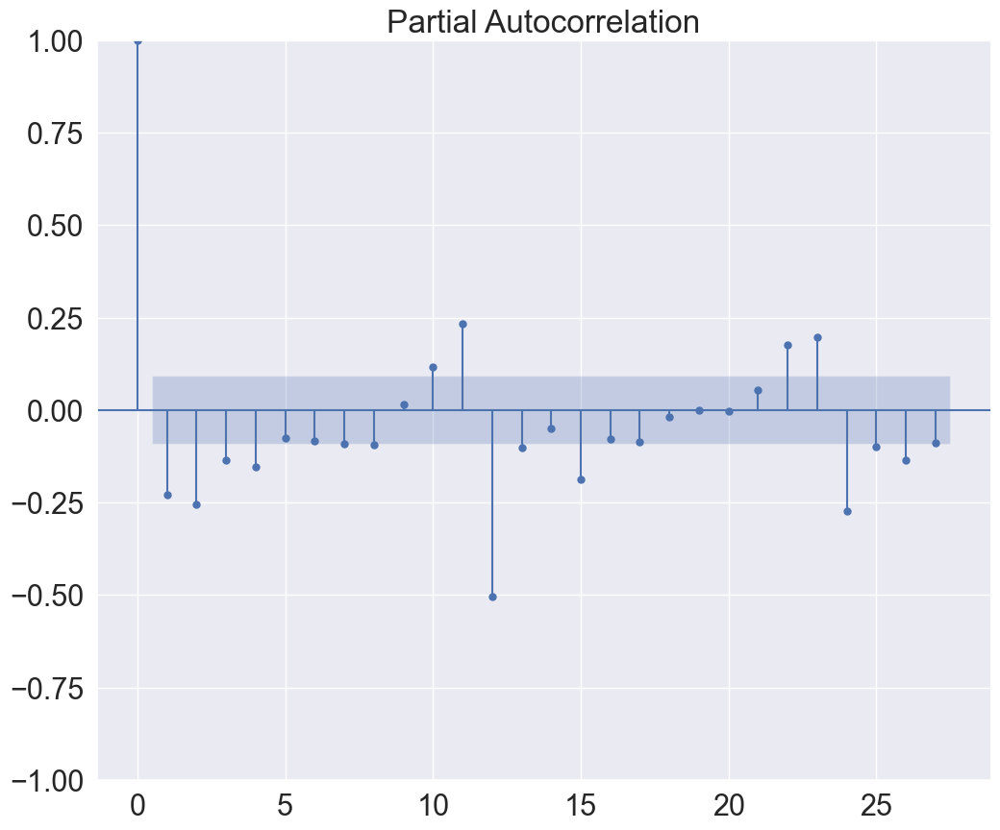

In [160]:
plot_pacf(defunLog_diff_1_12.dropna(inplace=False))
plt.show()

**Modelos ARIMA manuales**

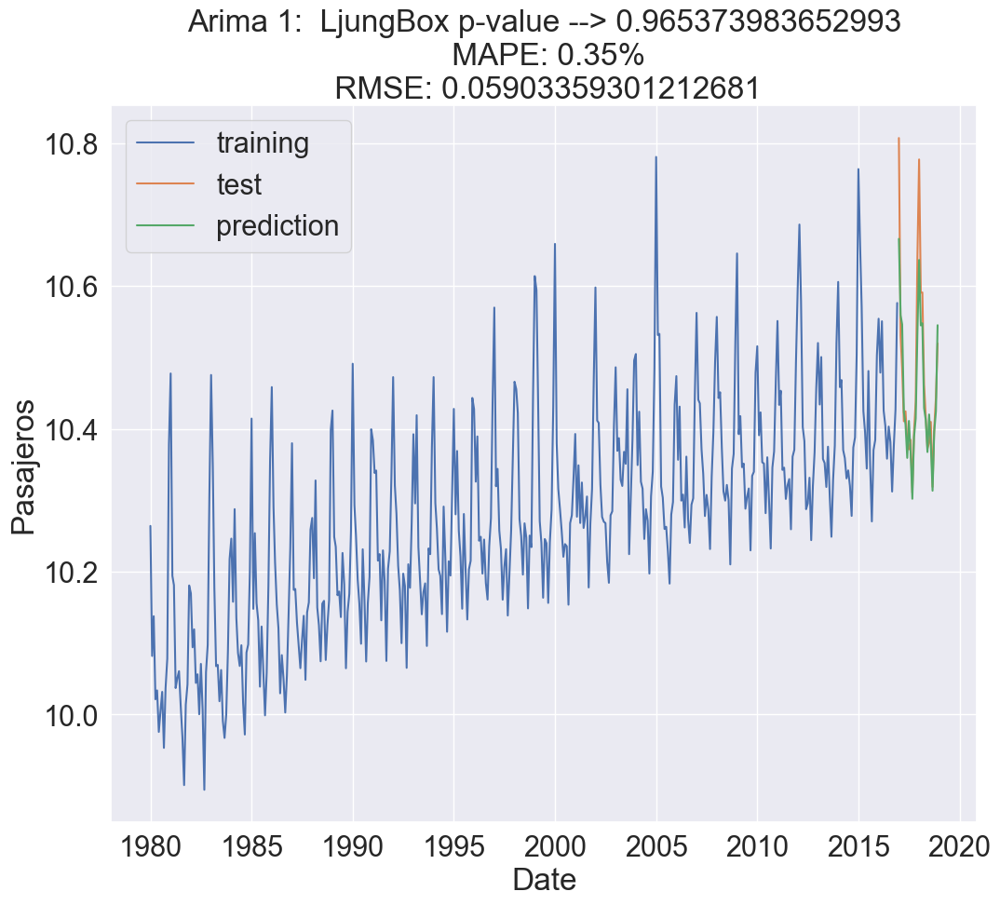

0.965373983652993


In [161]:
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

#Modelo ARIMA 1 SIN diferenciación estacional
arima1 = SARIMAX(defun_tr, 
                order = (2, 1, 2), 
                seasonal_order =(1, 0, 2, 12))

arima_1 = arima1.fit()
#arima_1.summary()
eval_model(arima_1,defun_tr,defun_tst,'Arima 1')

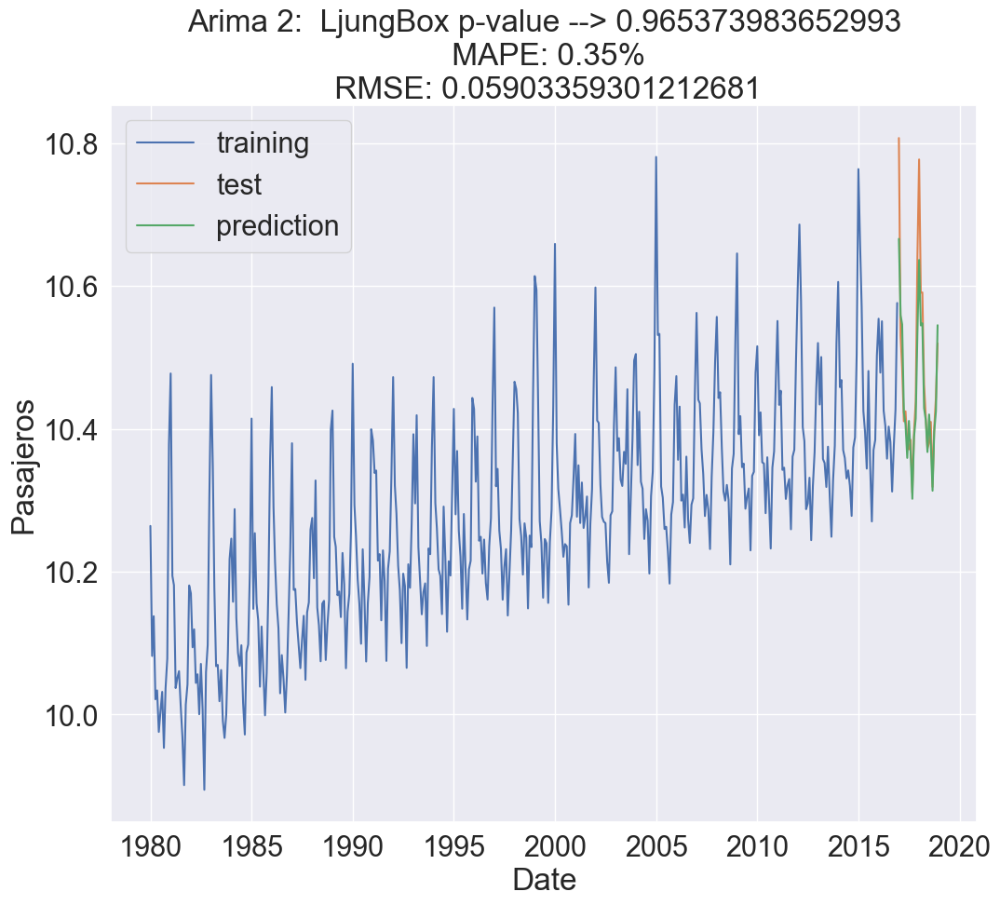

0.965373983652993


In [162]:
#Modelo ARIMA2 CON diferenciación estacional
arima2 = SARIMAX(defun_tr, 
                order = (1, 1, 2), 
                seasonal_order =(1, 1, 2, 12))

arima_2 = arima1.fit()

eval_model(arima_2,defun_tr,defun_tst,'Arima 2')

**Modelos ARIMA automaticos**

In [164]:
import pmdarima as pm

arima_auto = pm.auto_arima(defun_tr, start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=5, max_q=5, # maximum p and q
                      m=12,              # frequency of series
                      d=1,           # let model determine 'd'
                      seasonal=True,   # No Seasonality
                      #start_P=None, 
                      D=None, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=2.24 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-806.005, Time=0.20 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-1105.148, Time=0.83 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-956.045, Time=0.85 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-807.982, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=-807.152, Time=0.12 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=inf, Time=2.15 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.61 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=-954.432, Time=0.68 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=-1348.967, Time=4.43 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=4.83 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=4.24 sec
 ARIMA(0,1,0)(2,0,1)[12] intercept   : AIC=inf, Time=3.44 sec
 ARIMA(2,1,0)(2,0,1)[12] intercept   : AIC=-1351.009, Time=5.22 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : AIC=-13

In [165]:
print(arima_auto.summary())

                                        SARIMAX Results                                        
Dep. Variable:                                       y   No. Observations:                  444
Model:             SARIMAX(2, 1, 0)x(1, 0, [1, 2], 12)   Log Likelihood                 682.918
Date:                                 Thu, 22 Dec 2022   AIC                          -1351.837
Time:                                         18:56:50   BIC                          -1323.182
Sample:                                     01-01-1980   HQIC                         -1340.536
                                          - 12-01-2016                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept  -2.973e-05   3.63e-05     -0.820      0.412      -0.000    4.13

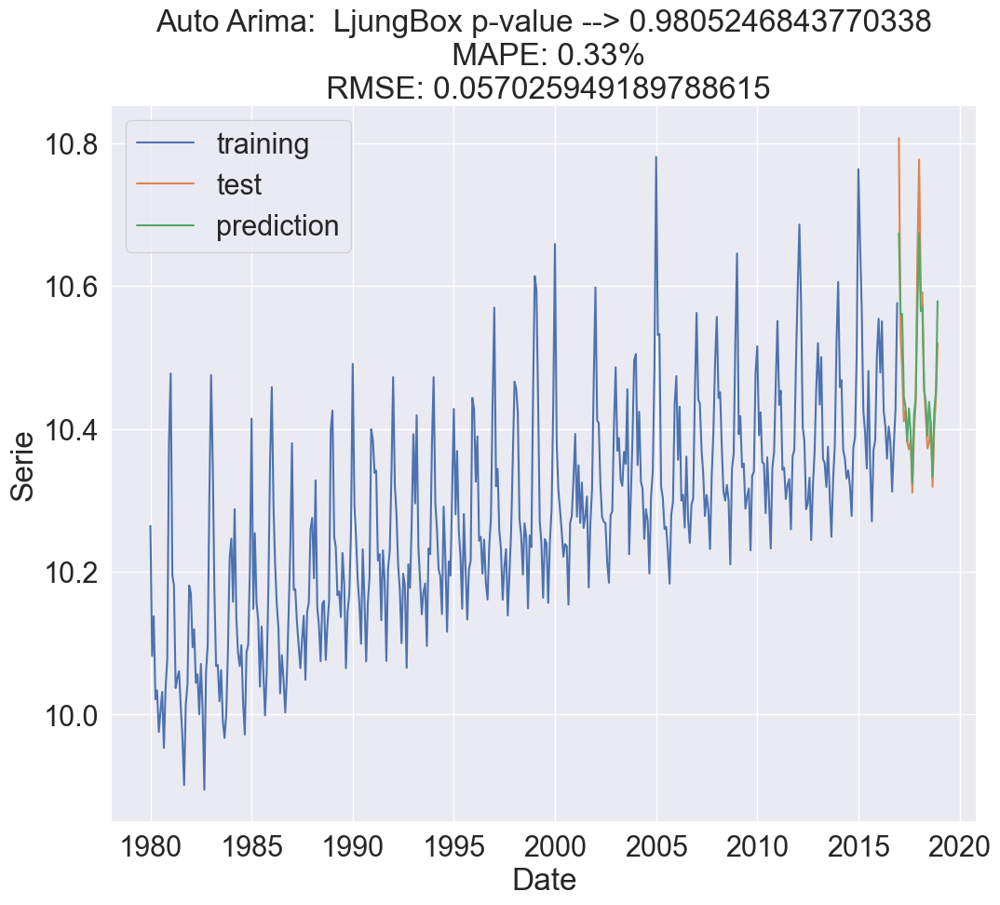

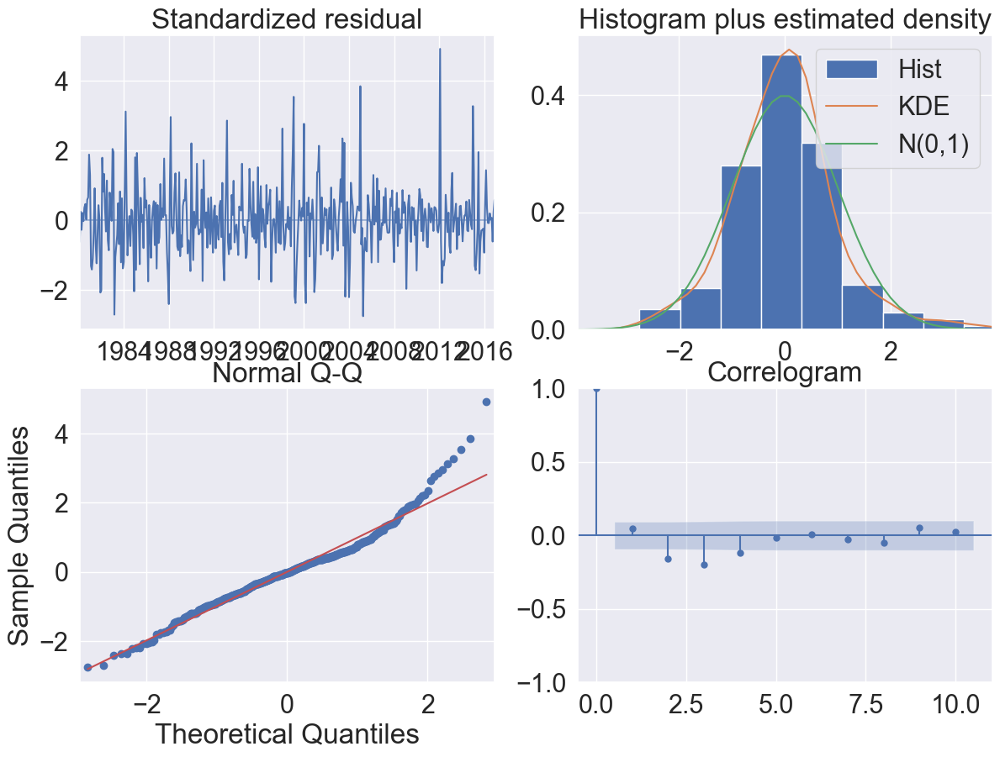

In [166]:
eval_model_Aarima(arima_auto,defun_tr,defun_tst,'Auto Arima')

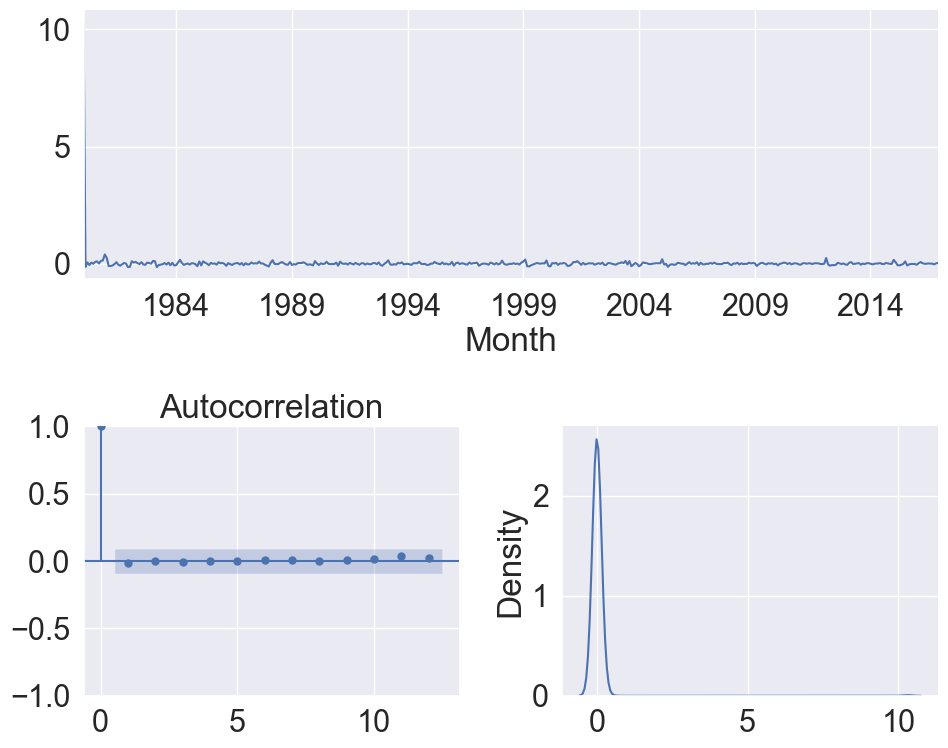

** Mean of the residuals:  0.02

** Ljung Box Test, p-value: 0.981 (>0.05, Uncorrelated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


(<AxesSubplot:xlabel='Month'>,
 <AxesSubplot:title={'center':'Autocorrelation'}>,
 <AxesSubplot:ylabel='Density'>)

In [167]:
residcheck(arima_auto.resid(),12)

**Conclusión**

El mejor modelo ARIMA es el automático, ya que obtiene un p-valor para el test de LJung Box más elevado (0.98 frente a 0.95), y un error cuadrático medio más reducido (0.33% frente a 0.35%)

Este modelo final sería un **ARIMA(2,1,0)(1,0,2)[12]**

### 5- Comparación. En relación al RMSE en el conjunto de tets, ¿Qué modelo resulta más preciso en sus predicciones?

RMSE: raíz del error cuadrático medio

- Multiplicativo Holt-Winters: 0.05387
- ARIMA(2,1,2)(1,0,2)[12]: 0.05903
- ARIMA:(1,1,2)(1,1,2)[12]: 0.05903
- auto ARIMA(2,1,0)(1,0,2)[12]: 0.05702

En relación al RMSE, el mejor modelo es el de **suavizado multiplicativo de Holt-Winters**
    

## Ejercicio 4

### 4.1- Leer el archivo

In [168]:
wis =pd.read_excel('wisconsin.xlsx')
wis.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [171]:
#Transformar los valores de diagnosis a 0 y 1 (B -> 0 , M -> 1)
wis['diagnosis'] = wis['diagnosis'].replace(['B', 'M'], ['0', '1'])
wis.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


### 4.2- Obtener la matriz de correlaciones entre las variables numéricas. Conclusiones.

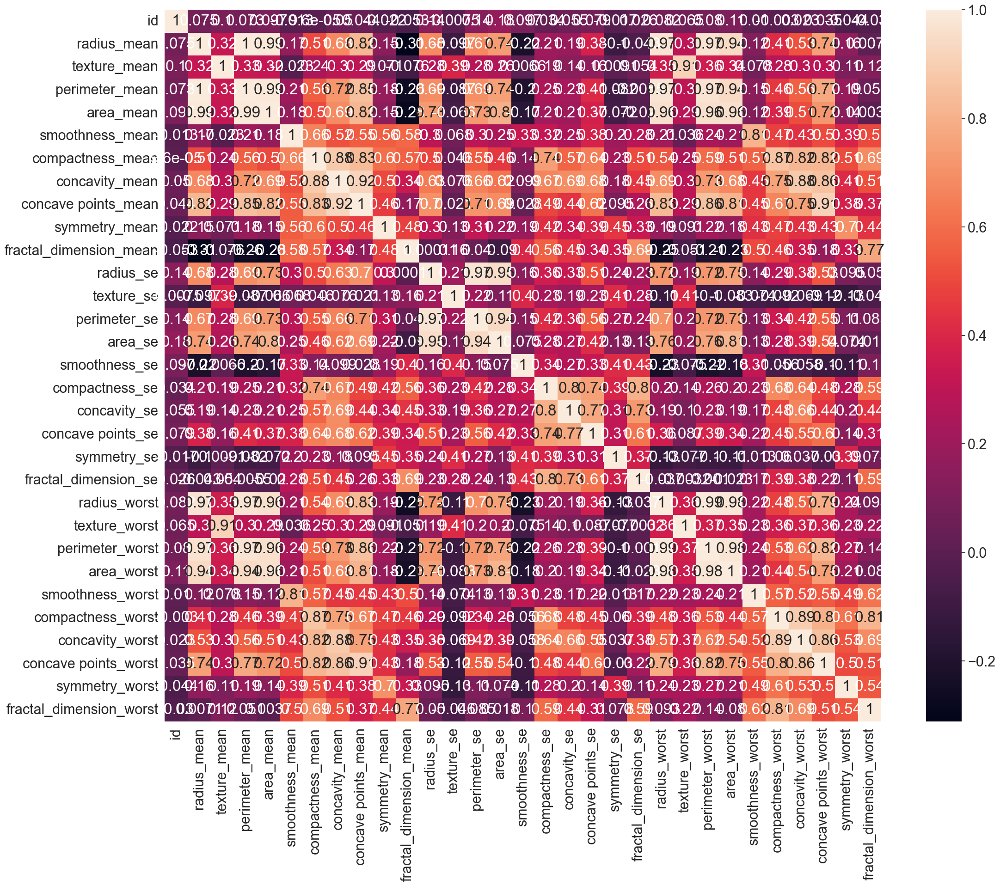

In [172]:
fig = plt.figure(figsize=(25,20))
sns.heatmap(wis.corr(numeric_only=True), annot=True)
plt.show()

Hay correlación alta entre las variables predictoras numéricas, por lo que existen problemas de multicolinearidad que afecta de cara al modelado para predecir la variable objetivo binaria 'diagnosis'. Esto se podría resolver con un análisis por componentes, creando componentes de variables que no están correlacionados entre ellos.

### 4.3- Sabiendo que se trata de predecir la variable binaria diagnosis (‘M,’B’). ¿Cual sería el modelo adecuado de predicción? ¿Qué problemas auguras a la luz de la información sobre las correlaciones del archivo?

Dado que se trata de una variable objetivo categórico-binaria, el modelo adecuado sería el de regresión logística binaria. En términos generales, la multicolinearidad entre variables predictoras da problemas de cara a la interpretación del modelo y a la identificación de los efectos individuales de cada predictor en la variable objetivo.


La multicolinearidad aumenta los coeficientes de los predictores correlados. Así, otras variables que pueden ser importantes pierden relevancia en el modelo e incluso resultar no relevantes por p-valor. Por otro lado, si dos variables están correladas, normalmente un aumento en una está acompañada de un aumento/descenso en la otra. Por lo que al comportarsde de forma similar es difícil distinguir realmente el efecto de X1 en la predicción de Y del de X2 en Y.

### 4.4- Como posible estrategia se plantea la realización de un ACP para la reducción de dimensiones y un modelo de predicción adecuado utilizando como predictores las componentes principales resultantes de tal forma que se retenga al menos el 70% de la variabilidad del archivo.

### 4.4.a. Valora la adecuación muestral a priori

Para poder realizar un ACP es necesario que las variables estén correlacionadas entre sí. Podemos confirmar esto, aparte de con la matriz de correlaciones, con una serie de tests numéricos

**Test de esferidad de Barlett**

H0: los datos están dispuestos en un conjunto hiper-esférico, es decir, no hay correlación entre las variables

In [173]:
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity

#Elimino la variable objetivo binaria y el id para analizar la correlación de las variables predictoras de interés
varObjBin = wis.diagnosis.astype('int64')
imputwis = wis.drop(['id','diagnosis'],axis=1)

calculate_bartlett_sphericity(imputwis)

(39362.120841132666, 0.0)

Valor estadístico muy alto y p-valor de 0 (< 0.05), por lo tanto rechazo la H0. Se rechaza que los datos se dispongan de manera ortogonal, sin correlación o varianza compartida. En este caso, parece confirmarse la existencia de correlaciones.

**KMO-MSA global y por variable** (índice de aduacuación muestral)

Contrasta la correlación observada entre pares de variables y sus correspondientes correlaciones parciales


In [174]:
from factor_analyzer.factor_analyzer import calculate_kmo
imputwis = imputwis.drop(['texture_se'],axis=1)
calculate_kmo(imputwis)

(array([0.83383775, 0.71380996, 0.85236309, 0.86613237, 0.8119036 ,
        0.87978917, 0.89148028, 0.8989748 , 0.83287842, 0.83044023,
        0.83272641, 0.83872779, 0.85713086, 0.61630817, 0.87022696,
        0.82281541, 0.83113907, 0.58402361, 0.80709036, 0.82286537,
        0.71827893, 0.88349999, 0.82210308, 0.75028776, 0.85248406,
        0.90181629, 0.88817103, 0.70426333, 0.81112789]),
 0.8398097573872351)

En este punto se buscan valores de 0.5 o superiores. En general todos los datos se encuentran por encima de este valor. El único inferior es el de 0.48458942, que se corresponde con la variable 'texture_se', por lo que decido eliminarla. El KMO del modelo también es bastante alto, con un 0.8398097573872351

### 4.4.b. Realiza el ACP sobre las numéricas. ¿Cuántas componentes se deberían considerar para cumplir el criterio mencionado? Interpreta la componente 1.

**Escalado de datos**

Ya que las variables tienen unidades de medida diferentes, habría que escalar los datos primero.

In [176]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from psynlig import pca_scree
from psynlig import pca_explained_variance_pie
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from psynlig import (
    pca_explained_variance,
    pca_residual_variance,
    pca_explained_variance_bar,
    pca_explained_variance_pie,
    pca_1d_loadings,
    pca_2d_loadings,
    pca_2d_scores
)

In [177]:
scaler = StandardScaler()
scaler.fit(imputwis)
X = scaler.transform(imputwis)
pca = PCA()
score = pca.fit_transform(X)

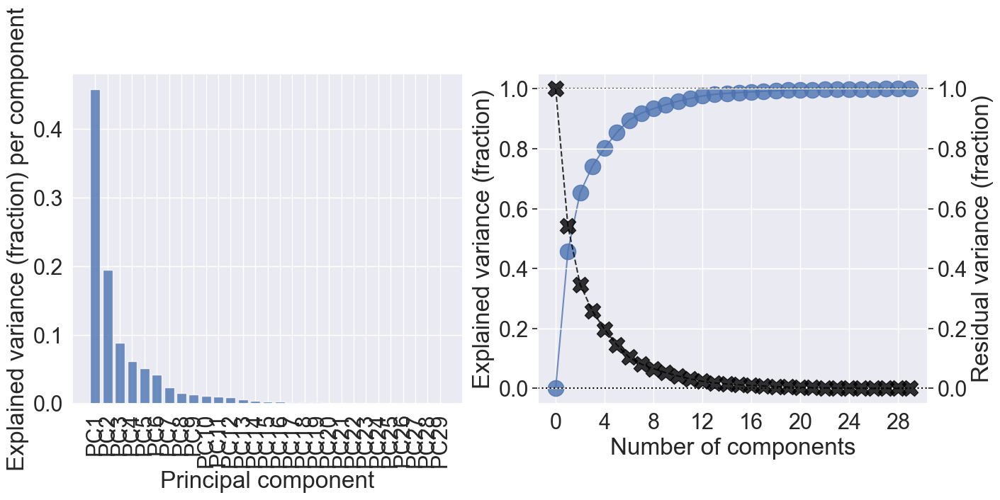

In [179]:
fig, (ax1, ax2) = plt.subplots(
    nrows=1, ncols=2, figsize=(14, 6), constrained_layout=True
)
pca_explained_variance_bar(pca, axi=ax1, alpha=0.8)
pca_explained_variance(pca, axi=ax2, marker='o', markersize=16, alpha=0.8)
ax4 = ax2.twinx()
pca_residual_variance(
    pca,
    ax4,
    marker='X',
    markersize=16,
    alpha=0.8,
    color='black',
    linestyle='--'
)
plt.show()

- El scree plot me muestra la variabilidad explicada con cada componente. Esto se observa en la línea entre cada punto. A más vertical, mayor variabilidad explicada. A partir del 3 se vuelve más horizontal y el añadir un componente nuevo no hace mucha diferencia. 
- Como se observa en el gráfico (derecha) de varianza explicada en relación al número de componentes, y **para poder explicar una variabilidad de al menos un 70%, sería necesario utilizar 4 componentes**.

**Interpretación de PC1**

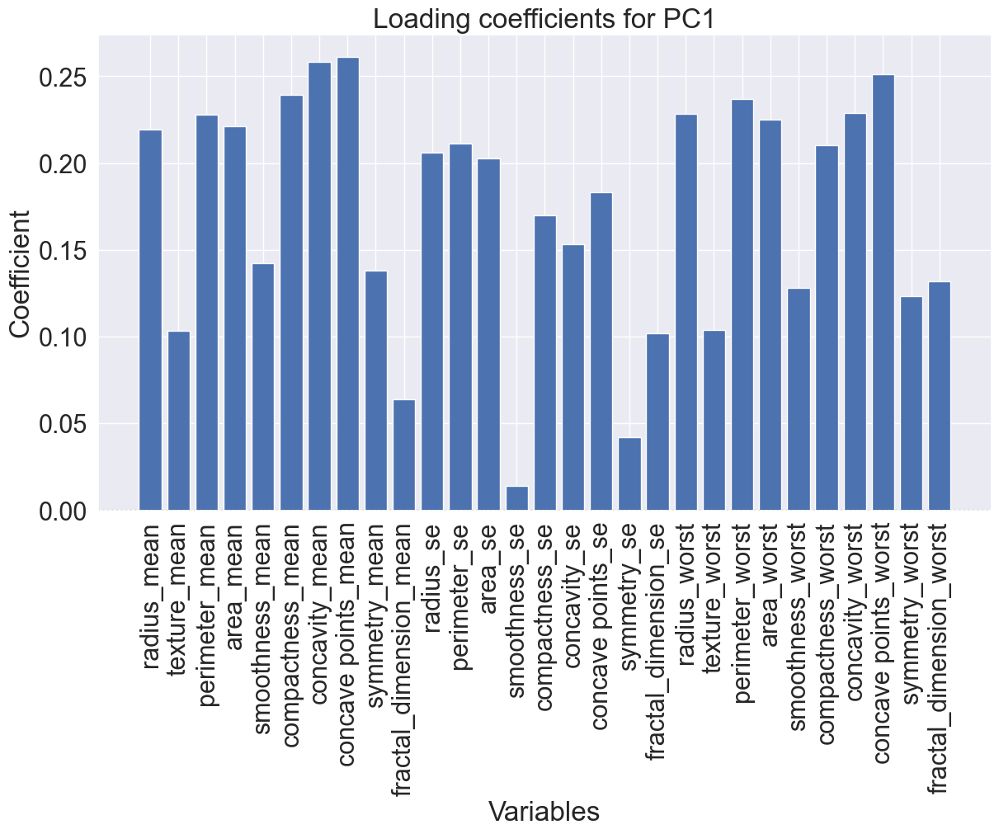

In [180]:
pca_1d_loadings(
        pca,
        imputwis.columns,
        select_components={1},
        plot_type='bar',
    )
plt.show()

Variables más relevantes en PC1:
- concave points_mean ; concavity_mean
- compactness_mean
- concave points_worst
- concavity_worst
- perimeter_worst
- radius_worst
- perimeter_mean
- area_mean
- radius mean

El primer componente está conformado, de manera general, por variables que miden la **concavidad y el tamaño del tumor**

### 4.4.c. Crea el input con estas componentes y ajusta un modelo de predicción adecuado para la variable objetivo diagnosis.

In [181]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, f1_score

#Partición training-test
X = imputwis
y = varObjBin
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)

#pca con 4 componentes

steps = [('scaler', StandardScaler()),
         ('pca', PCA(n_components=4)),
         ('clf', LogisticRegression())]
pipe_lr = Pipeline(steps)

pipe_lr.fit(X_train, y_train)
train_predictions = pipe_lr.predict(X_train)
test_predictions = pipe_lr.predict(X_test)

print("TRAIN:")
print(classification_report(y_train, train_predictions))

print("TEST:")
print(classification_report(y_test, test_predictions))

TRAIN:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       303
           1       0.97      0.93      0.95       180

    accuracy                           0.96       483
   macro avg       0.96      0.95      0.96       483
weighted avg       0.96      0.96      0.96       483

TEST:
              precision    recall  f1-score   support

           0       0.95      1.00      0.97        54
           1       1.00      0.91      0.95        32

    accuracy                           0.97        86
   macro avg       0.97      0.95      0.96        86
weighted avg       0.97      0.97      0.96        86



**Modelo de regresión logística con 4 componentes**

Da muy buenos resultados para la predicción de la variable diagnosis. 
- Accuracy de 0.96 en training, 0.97 en test
- Tasa de 'fallo' o reconocimiento de 0 (=B) (de los que el modelo reconoce como B, cuantos son B) 0.96 en training, 0.95 en test
- Tasa de 'acierto' o reconocimiento de 1 (=M) (de los que el modelo reconoce como M, cuantos son M) 0.97 en training, 1 en test
- Sensibilidad (de los que son B, cuantos reconoce como B) 0.98 training, 1 test
- Especificidad (de los que son M, cuantos reconoce como M) 0.93 training, 0.91 test


In [185]:
pca = PCA(n_components=4)
scores =  pd.DataFrame(pca.fit_transform(X),columns=['PC1','PC2','PC3','PC4'])
scores.head()

,PC1,PC2,PC3,PC4
0,1160.142556,-293.917489,48.580450,-8.797605
1,1269.122414,15.630331,-35.392539,17.871929
2,995.793863,39.156873,-1.707374,4.193172
3,-407.180807,-67.380296,8.673361,-11.781916
4,930.341154,189.340884,1.377827,8.473762


In [184]:
X_train, X_test, y_train, y_test = train_test_split(scores, y, test_size=0.15, random_state=42)
wis_pca=scores.join(y.astype('int64'))
X_train.head()

,PC1,PC2,PC3,PC4
9,-238.292839,-65.386639,-3.634942,-12.582489
468,648.811136,-9.678334,27.560999,-9.121952
382,-444.380404,26.305731,-6.590209,-5.128095
322,-319.483762,17.557911,-6.128590,3.157984
84,-378.661384,-18.841001,-2.819102,1.986711


In [187]:
data_train = X_train.join(y_train.astype('int64'))
data_train
Form1 = 'diagnosis~PC1 + PC2 + PC3 + PC4'
from statsmodels.formula.api import logit 
model = logit('diagnosis~PC1 + PC2 + PC3 + PC4',data=data_train).fit()
model.summary()

Optimization terminated successfully.
         Current function value: 0.118385
         Iterations 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              diagnosis   No. Observations:                  483
Model:                          Logit   Df Residuals:                      478
Method:                           MLE   Df Model:                            4
Date:                Thu, 22 Dec 2022   Pseudo R-squ.:                  0.8207
Time:                        20:13:46   Log-Likelihood:                -57.180
converged:                       True   LL-Null:                       -318.95
Covariance Type:            nonrobust   LLR p-value:                5.398e-112
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0841      0.420      0.201      0.841      -0.738       0.906
PC1            0.0138      0.002      7.008      0.000       0.010       0.018
PC2           -0.0256      0.006     -4.348      0.000      -0.037      -0.014
PC3            0.0250      0.019      1.333      0.182      -0.012       0.062
PC4           -0.3157      0.054     -5.809      0.000      -0.422      -0.209
==============================================================================

Possibly complete quasi-separation: A fraction 0.25 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

**Modelo logit**
- R2 muy alto de 0.8207
- Todos los coeficientes son significativos menos el PC3

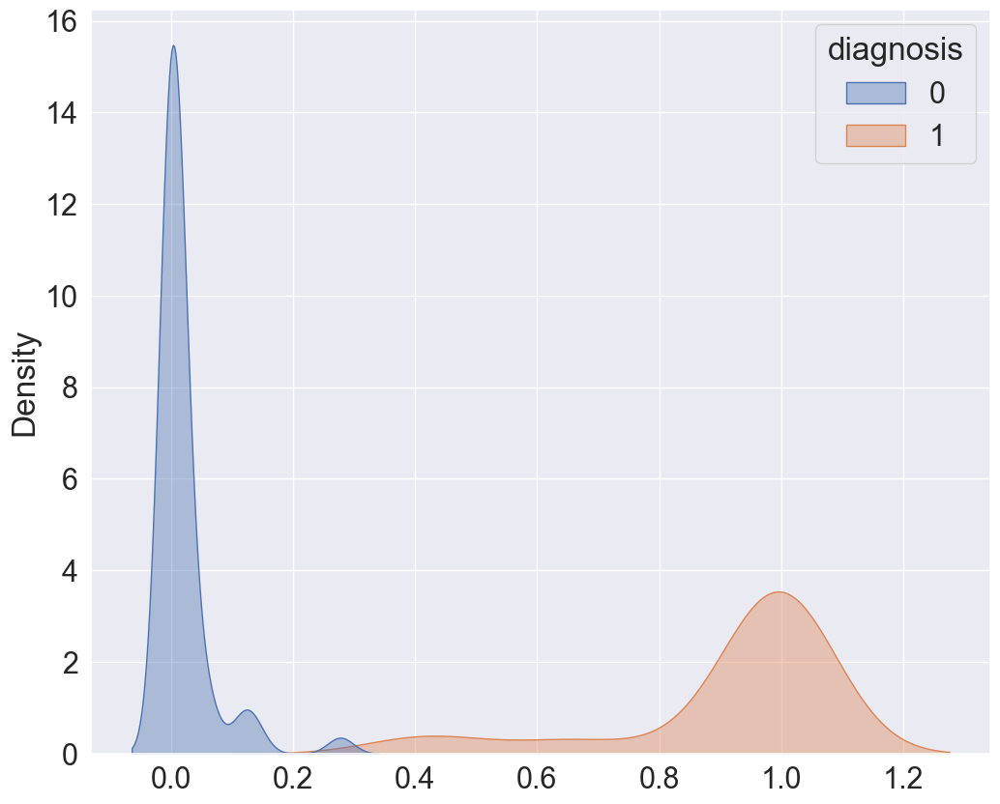

In [188]:
y_pred = model.predict(X_test)
plt.clf()
sns.kdeplot(x=y_pred, hue=y_test, fill=True, common_norm=False, alpha=0.4)
plt.show()

Como muestra el gráfico, el modelo funciona muy bien en la predicción de diagnosis. No hay apenas solapamiento, por lo que el modelo distingue muy bien entre 0 y 1. La distribución de probabilidades estimadas para los 1 está bastante apuntada, mientras que la de los 0 se concentra en valores pequeños.

### 4.4.d. Conclusiones del modelo por validación cruzada repetida. Interpreta el parámetro de la componente 1.

In [190]:
cross_val_log(Form1, wis_pca, seed=12345)

Modelo: diagnosis~PC1 + PC2 + PC3 + PC4
AUC: 0.990 (0.006)


array([0.99206349, 0.98894817, 0.99874411, 0.99206349, 0.98549323,
       0.98001965, 0.99636243, 0.99148379, 0.99763514, 0.9845191 ,
       0.99460146, 0.99523658, 0.98993506, 0.98766234, 0.99839357,
       0.97262197, 0.99279397, 0.99264706, 0.99098229, 0.99898374,
       0.99298363, 0.98776455, 0.98997661, 0.98657289, 0.98960429,
       0.96854701, 0.99936488, 0.99316239, 0.99404762, 0.99771242,
       0.98830605, 0.98716216, 0.99025974, 0.99372057, 0.99087719,
       0.99485294, 0.98917414, 0.99066023, 0.98429669, 0.99203049,
       0.98838305, 0.9900161 , 0.99210859, 0.995437  , 0.99356061,
       0.98871795, 0.98952703, 0.99448052, 0.98545706, 0.9943074 ,
       0.99594595, 0.9811617 , 0.99935065, 0.98595999, 0.98558015,
       0.989375  , 0.98209898, 0.99448529, 0.99516908, 0.99286178,
       0.99623932, 0.99279397, 0.990625  , 0.99145299, 0.98848238,
       0.98666667, 0.99038462, 0.99470899, 0.98141892, 0.99513303,
       0.99104859, 0.99297999, 0.99298363, 0.98735043, 0.99011

El modelo funciona muy bien por validación cruzada. El área bajo la curva ROC muestra un valor muy elevado, de 0.990, llegando casi a formar un ángulo recto (valor de 1, lo que indicaría un modelo de regresión logística perfecta)

In [194]:
pca.components_[1]

array([ 9.28706036e-03, -2.88165405e-03,  6.27481021e-02,  8.51823766e-01,
       -1.48194711e-05, -2.68874647e-06,  7.51416901e-05,  4.63500226e-05,
       -2.52431531e-05, -1.61197457e-05, -5.38714224e-05,  8.19624963e-04,
        7.51089237e-03,  1.49435037e-06,  1.27356782e-05,  2.86919341e-05,
        9.36003344e-06,  1.22646551e-05,  2.89663951e-07, -5.68668933e-04,
       -1.32153330e-02, -1.85938082e-04, -5.19742400e-01, -7.68565471e-05,
       -2.56103935e-04, -1.75471353e-04, -3.05050692e-05, -1.57042682e-04,
       -5.53071561e-05])

In [192]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              diagnosis   No. Observations:                  483
Model:                          Logit   Df Residuals:                      478
Method:                           MLE   Df Model:                            4
Date:                Thu, 22 Dec 2022   Pseudo R-squ.:                  0.8207
Time:                        20:30:56   Log-Likelihood:                -57.180
converged:                       True   LL-Null:                       -318.95
Covariance Type:            nonrobust   LLR p-value:                5.398e-112
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0841      0.420      0.201      0.841      -0.738       0.906
PC1            0.0138      0.002      7.008      0.000       0.010       0.018
PC2           -0.0256      0.006     -4.348      0.000      -0.037      -0.014
PC3            0.0250      0.019      1.333      0.182      -0.012       0.062
PC4           -0.3157      0.054     -5.809      0.000      -0.422      -0.209
==============================================================================

Possibly complete quasi-separation: A fraction 0.25 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

In [196]:
#Odds-Ratio de PC1
math.exp(0.0138)

1.0138956595273219

El parámetro PC1 es significativo (p-valor de 0) y tiene un coeficiente de 0.0138. PC1, compuesto por variables como concavidad u area, tiene un impacto positivo en la probabilidad de desarrollar un tumor maligno. Un aumento unitario en PC1 multiplica el Odds-ratio de diagnosis por 1.013 (=e^0.0138). Dicho de otra manera, la probabilidad de desarrollar un tumor maligno aumenta en un 0.13%.

## Ejercicio 5

El conjunto de datos DatosEleccionesEspaña.xlsx contiene información demográfica sobre los distintos municipios de España junto con los resultados que se obtuvieron en un proceso electoral. En esta práctica, el objetivo fundamental es crear grupos de comunidades autónomas en función de ciertas características previamente seleccionadas.
### 5.1- Escoge 10 variables numéricas presentes en el conjunto de datos previamente depurado


In [197]:
#Plot missings
import missingno as msno 

#Imputación para depurado
import sklearn.impute as skl_imp
from sklearn.experimental import enable_iterative_imputer
import feature_engine.imputation as fe_imp


from sklearn.datasets import make_blobs

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style
style.use('ggplot') or plt.style.use('ggplot')
plt.rcParams["figure.figsize"] = (12,10)

# Preprocesado y modelado
# ==============================================================================
from sklearn.cluster import KMeans
from sklearn.preprocessing import scale
from sklearn.metrics import silhouette_score

from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from time import time

In [198]:
elec = pd.read_excel("DatosEleccionesEspaña.xlsx")
elec.head()
#elec.info()

,Name,CodigoProvincia,CCAA,Population,TotalCensus,AbstentionPtge,AbstencionAlta,Izda_Pct,Dcha_Pct,Otros_Pct,Izquierda,Derecha,Age_0-4_Ptge,Age_under19_Ptge,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,SameComAutonPtge,SameComAutonDiffProvPtge,DifComAutonPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas,Industria,Construccion,ComercTTEHosteleria,Servicios,ActividadPpal,inmuebles,Pob2010,SUPERFICIE,Densidad,PobChange_pct,PersonasInmueble,Explotaciones
0,Abadía,10,Extremadura,336,282,20.213,0,60.444,35.555,1.778,1,0,3.869,18.155,55.059,26.785,44.048,0.89,79.762,0.298,19.345,2.381,54.762,42.857,4.762,9.524,11.905,73.810,15.0,0.0,0.0,0.0,0.0,Otro,216.0,326.0,4507.5593,MuyBaja,3.07,1.56,28
1,Abertura,10,Extremadura,429,364,25.275,0,54.779,44.118,0.368,1,0,1.632,13.055,56.643,30.304,50.117,1.63,90.909,2.797,7.226,16.216,32.432,51.351,8.108,8.108,10.811,67.568,11.0,0.0,0.0,0.0,0.0,Otro,382.0,459.0,6270.7646,MuyBaja,-6.54,1.12,67
2,Acebo,10,Extremadura,569,569,27.241,0,44.203,53.140,0.966,0,1,1.230,9.139,54.834,36.028,49.033,0.70,78.910,0.703,18.102,8.197,36.066,55.738,22.951,9.836,13.115,49.180,49.0,0.0,0.0,0.0,0.0,Otro,918.0,674.0,5702.1000,MuyBaja,-15.58,0.62,74
3,Acehúche,10,Extremadura,822,704,30.114,1,50.813,45.325,0.000,1,0,4.258,14.964,60.098,24.940,51.095,0.12,93.917,0.487,5.109,7.407,61.111,31.481,16.667,5.556,16.667,59.259,50.0,0.0,0.0,0.0,0.0,Otro,599.0,842.0,9106.4649,MuyBaja,-2.38,1.37,66
4,Aceituna,10,Extremadura,623,540,30.185,1,44.562,49.867,0.796,0,1,3.531,15.569,59.391,25.042,48.154,0.64,93.258,0.161,4.173,15.385,48.077,36.538,21.154,0.000,11.538,61.538,22.0,0.0,0.0,0.0,0.0,Otro,394.0,625.0,4007.6141,MuyBaja,-0.32,1.58,96


In [199]:
#Selecciono 10 variables numéricas en porcentage + variable CCAA
ele = elec[['CCAA','AbstentionPtge','Dcha_Pct','Izda_Pct','WomanPopulationPtge','ForeignersPtge','UnemployLess25_Ptge', 'Age_under19_Ptge','Age_over65_pct','DifComAutonPtge','SameComAutonPtge']]
ele.describe()

,AbstentionPtge,Dcha_Pct,Izda_Pct,WomanPopulationPtge,ForeignersPtge,UnemployLess25_Ptge,Age_under19_Ptge,Age_over65_pct,DifComAutonPtge,SameComAutonPtge
count,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000
mean,26.506951,48.915409,34.403789,47.302755,5.619553,7.322292,13.567747,29.073583,10.729018,81.629141
std,7.540091,19.945087,16.482285,4.361907,7.348553,9.408555,6.780648,11.745849,8.847295,12.289063
min,0.000000,0.000000,0.000000,11.765000,-8.960000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,21.678000,38.690500,21.892500,45.725000,1.060000,0.000000,8.334000,19.824500,4.933000,75.806000
50%,26.429000,51.582000,35.165000,48.485000,3.590000,5.882000,13.889000,27.559000,8.271000,84.493000
75%,31.475000,62.201000,46.032000,50.000000,8.180000,10.469500,19.058500,36.908000,13.898000,90.462000
max,57.576000,100.000000,94.117000,72.683000,71.470000,100.000000,33.696000,76.471000,100.000000,127.156000


Al haber escogido variables medidas en porcentage, los valores deberían ir de 0-100, pero hay algunos valores que salen de rango.
- ForeignersPtge: mínimo en -8.960000
- SameComAutonPtge: máximo de 127.156000

In [200]:
#Paso la variable CCAA a categorica
to_factor = list(ele.loc[:,ele.nunique() < 20]);  
ele['CCAA'] = ele['CCAA'].astype('category')
ele.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8119 entries, 0 to 8118
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   CCAA                 8119 non-null   category
 1   AbstentionPtge       8119 non-null   float64 
 2   Dcha_Pct             8119 non-null   float64 
 3   Izda_Pct             8119 non-null   float64 
 4   WomanPopulationPtge  8119 non-null   float64 
 5   ForeignersPtge       8119 non-null   float64 
 6   UnemployLess25_Ptge  8119 non-null   float64 
 7   Age_under19_Ptge     8119 non-null   float64 
 8   Age_over65_pct       8119 non-null   float64 
 9   DifComAutonPtge      8119 non-null   float64 
 10  SameComAutonPtge     8119 non-null   float64 
dtypes: category(1), float64(10)
memory usage: 643.0 KB


Cat
Cont


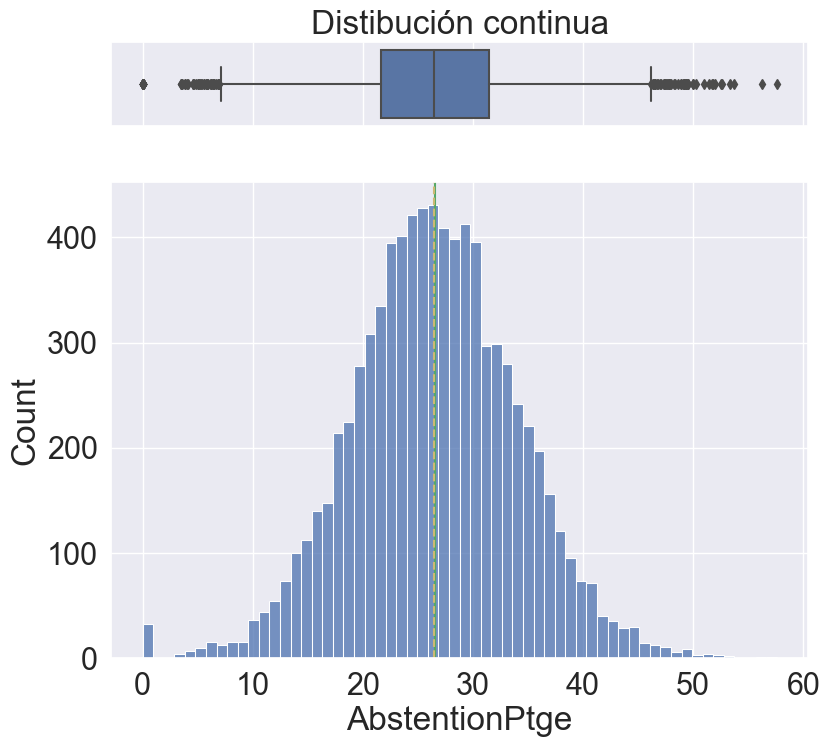

Cont


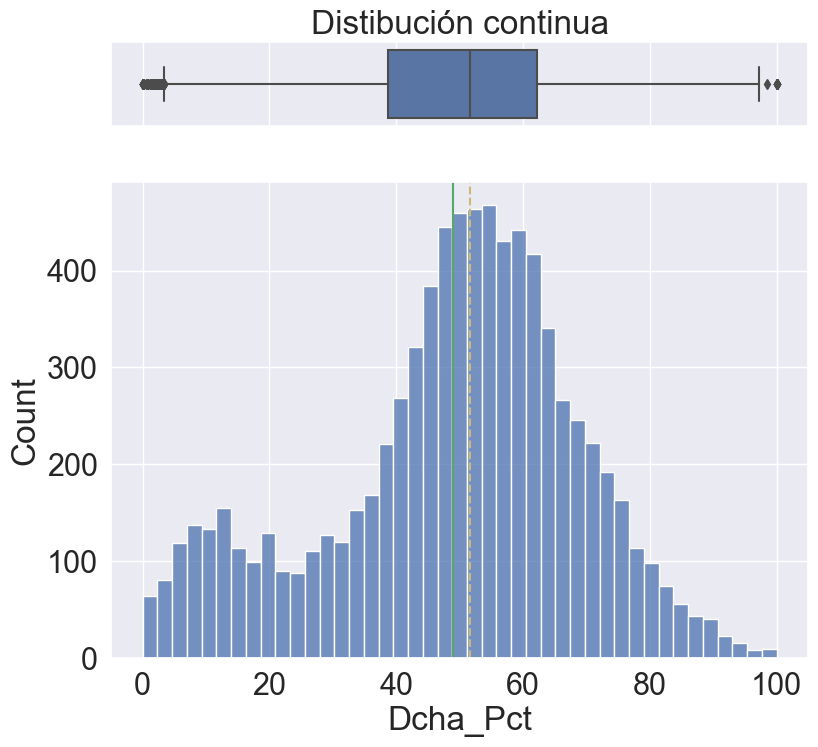

Cont


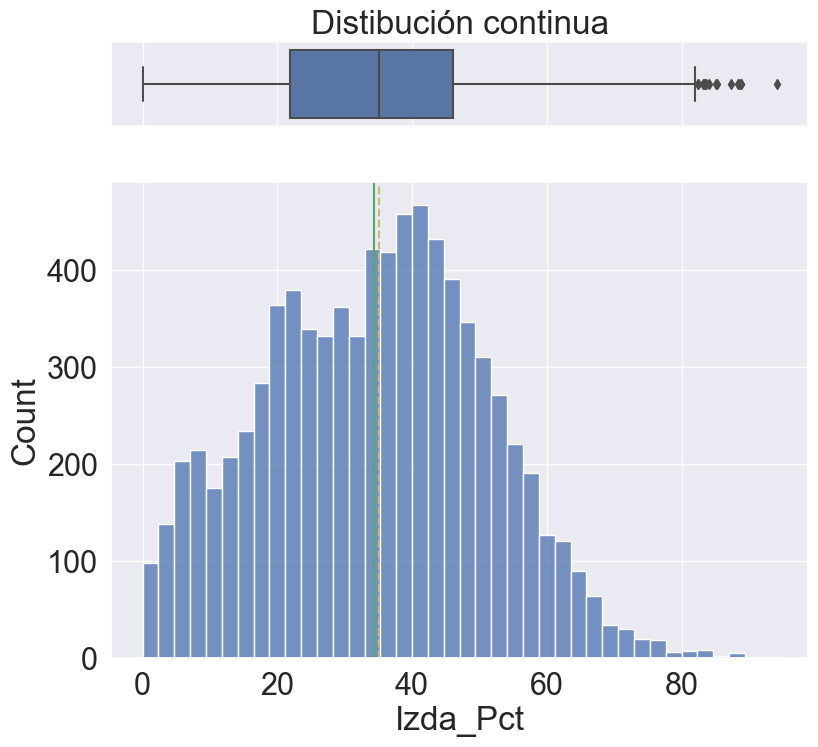

Cont


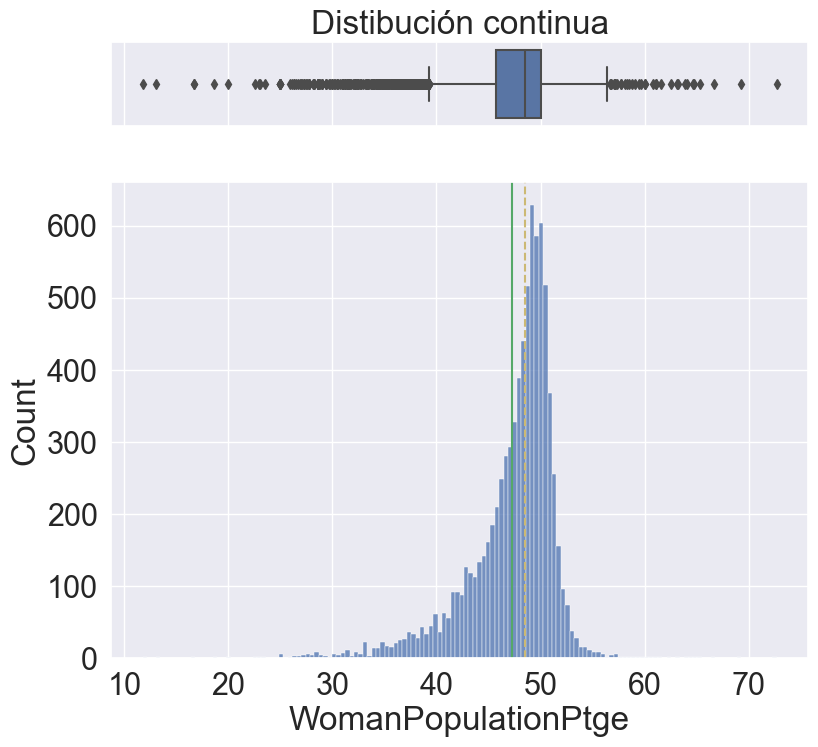

Cont


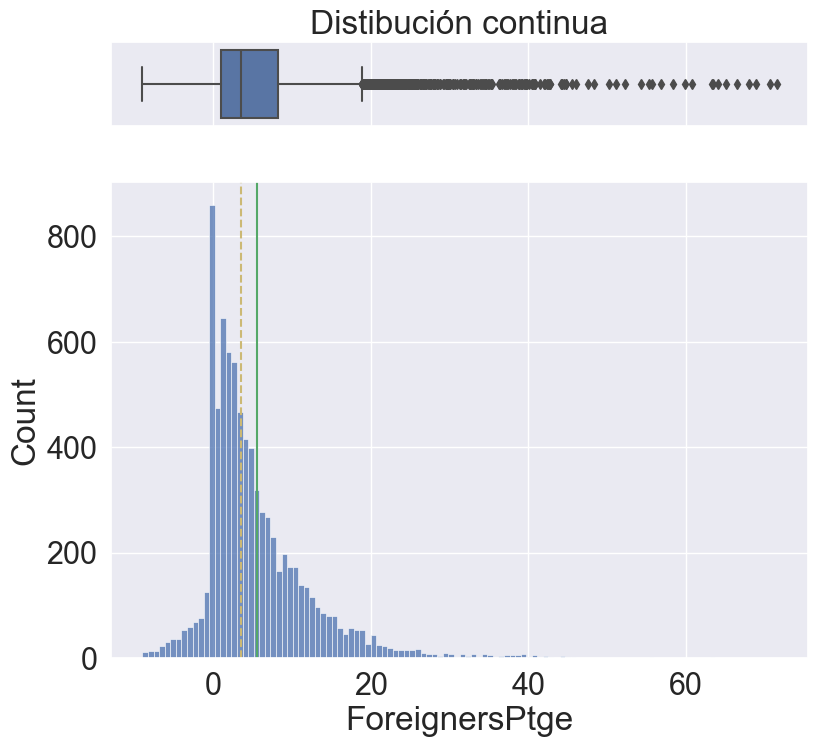

Cont


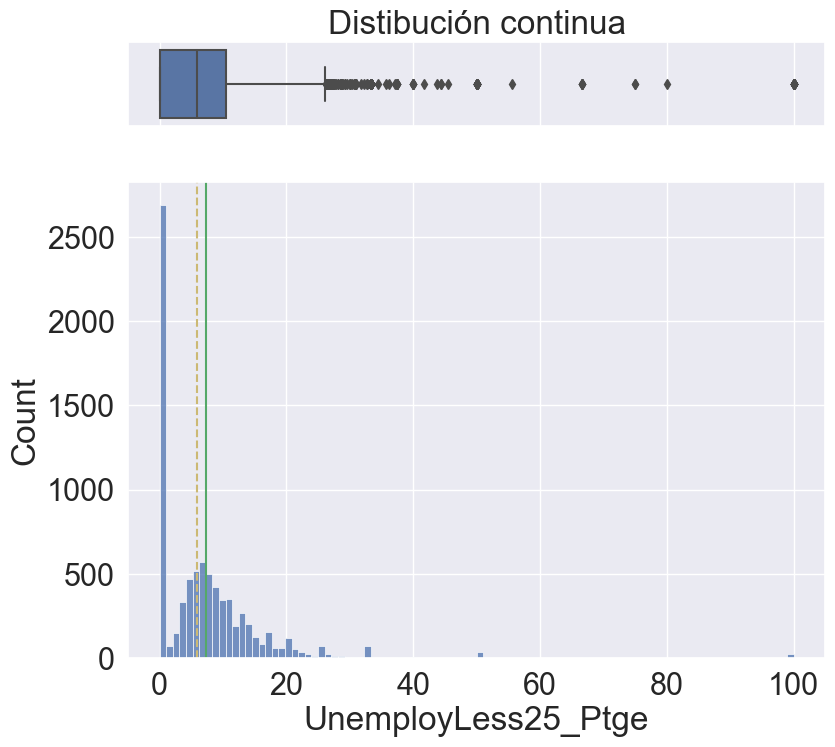

Cont


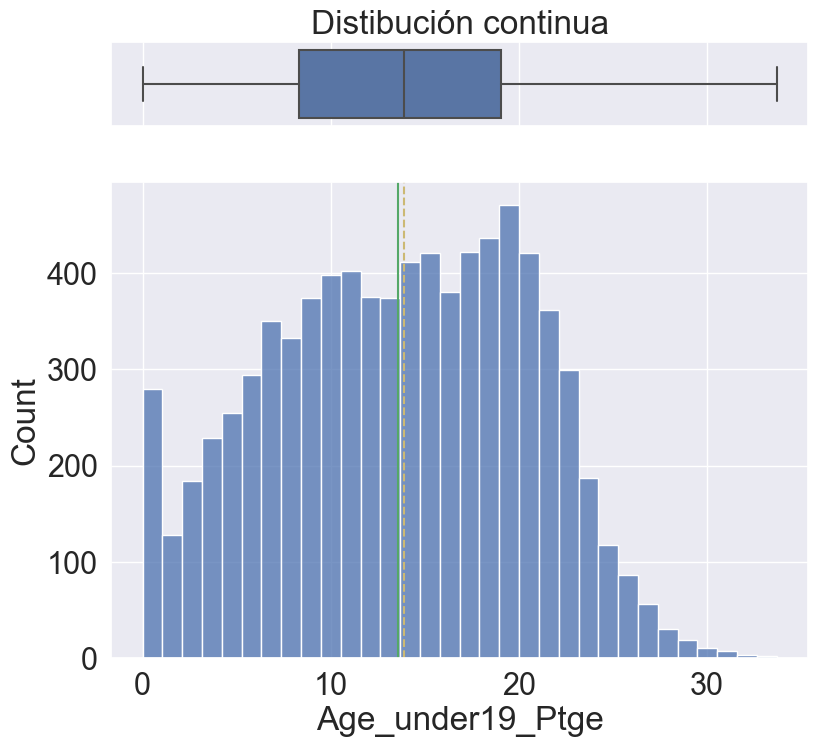

Cont


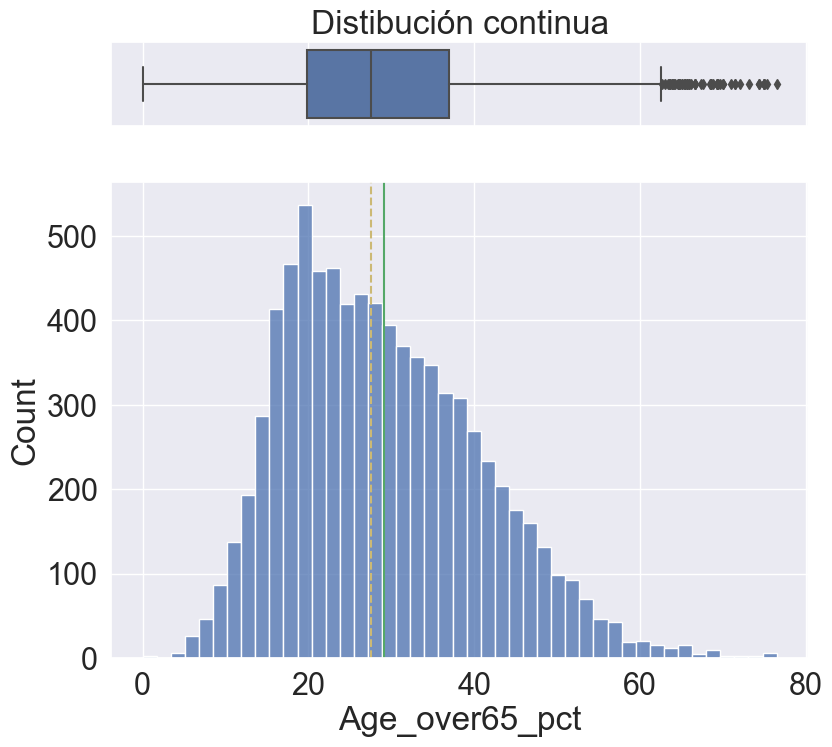

Cont


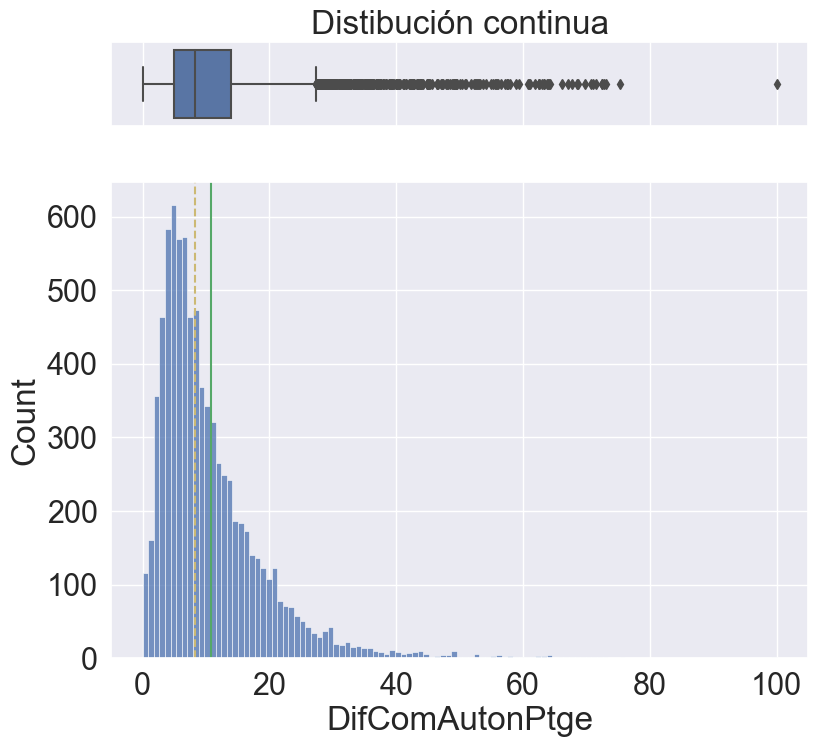

Cont


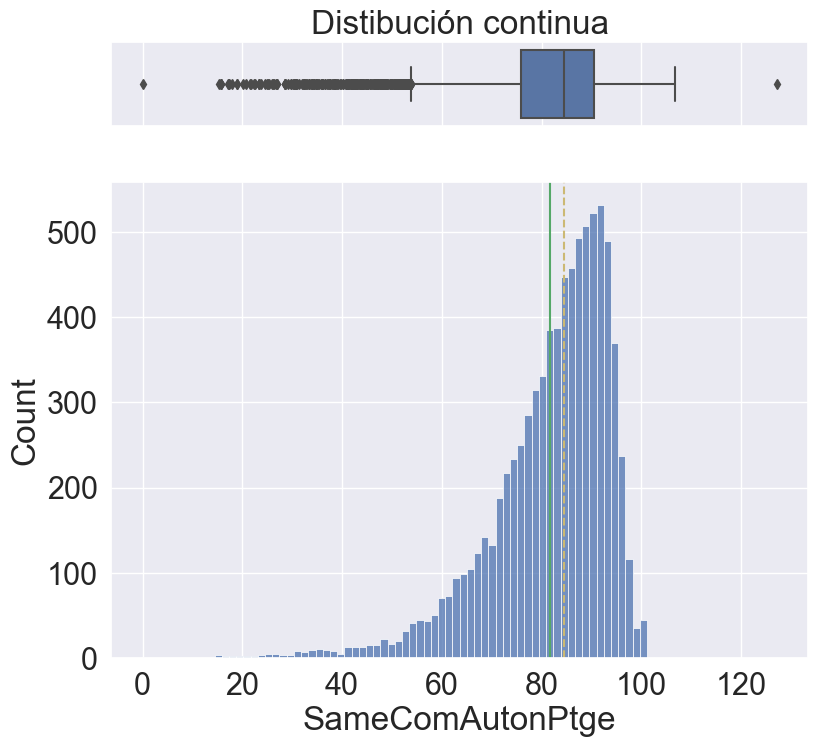

CCAA                   None
AbstentionPtge         None
Dcha_Pct               None
Izda_Pct               None
WomanPopulationPtge    None
ForeignersPtge         None
UnemployLess25_Ptge    None
Age_under19_Ptge       None
Age_over65_pct         None
DifComAutonPtge        None
SameComAutonPtge       None
dtype: object

In [201]:
#Inspección gráfica

ele.apply(plot)

Casi todas las variables tienen valores atípicos, aunque sobretodo AbstentionPge, WomanPopulationPtge, ForeignersPtge, Unemploy25_40_Ptge, DifComAutonPtge y SameComAutonPtge. 

**Valores mal codificados**

In [202]:
#Pasar valores fuera del rango a missing
ele.loc[~ele.ForeignersPtge.between(0, 100), "ForeignersPtge"] = np.nan
ele.ForeignersPtge.min()

0.0

In [203]:
#Pasar valores fuera del rango a missing
ele.loc[~ele.SameComAutonPtge.between(0, 100), "SameComAutonPtge"] = np.nan
ele.SameComAutonPtge.max()

100.0

**Gestión de outliers**

In [204]:
ele.select_dtypes(include=np.number).apply(lambda x: x.skew())

AbstentionPtge        -0.049941
Dcha_Pct              -0.468014
Izda_Pct               0.059920
WomanPopulationPtge   -1.671491
ForeignersPtge         2.755577
UnemployLess25_Ptge    4.149784
Age_under19_Ptge      -0.103561
Age_over65_pct         0.598441
DifComAutonPtge        2.425228
SameComAutonPtge      -1.532291
dtype: float64

Variables ForeignersPtge, DifComAutonPtge, WomanPopulationPtge, SameComAutonPtge están significativamente sesgadas (asimetría mayor a la unidad)

In [205]:
ele.select_dtypes(include=np.number).copy().apply(lambda x: gestiona_outliers(x))

AbstentionPtge
Dcha_Pct
Izda_Pct
WomanPopulationPtge
ForeignersPtge
UnemployLess25_Ptge
Age_under19_Ptge
Age_over65_pct
DifComAutonPtge
SameComAutonPtge


,AbstentionPtge,Dcha_Pct,Izda_Pct,WomanPopulationPtge,ForeignersPtge,UnemployLess25_Ptge,Age_under19_Ptge,Age_over65_pct,DifComAutonPtge,SameComAutonPtge
0,0.0,0.0,0.0,0.123168,0.000000,0.000000,0.0,0.0,0.00000,0.012321
1,0.0,0.0,0.0,0.000000,0.388428,0.418771,0.0,0.0,0.38182,0.000000
2,0.0,0.0,0.0,0.123168,0.388428,0.418771,0.0,0.0,0.38182,0.012321


ForeignersPtge y DifComAutonPtge con porcentage de atípicos > 20%, lo que puede indicar la presencia de dos poblaciones

In [206]:
# Crear copia para evitar pisar información
eleCont = ele.select_dtypes(include=np.number).copy()

# Aplicar la gestión de outliers en modelo winsor
ele_winsor = eleCont.apply(lambda x: gestiona_outliers(x,clas='winsor'))

AbstentionPtge
Dcha_Pct
Izda_Pct
WomanPopulationPtge
ForeignersPtge
UnemployLess25_Ptge
Age_under19_Ptge
Age_over65_pct
DifComAutonPtge
SameComAutonPtge


In [207]:
# Contemos si ha desaparecido algún resgitro o algo 
ele_winsor.apply(lambda x: x.isna().sum()/x.count()*100)

AbstentionPtge         0.000000
Dcha_Pct               0.000000
Izda_Pct               0.000000
WomanPopulationPtge    0.000000
ForeignersPtge         8.746317
UnemployLess25_Ptge    0.000000
Age_under19_Ptge       0.000000
Age_over65_pct         0.000000
DifComAutonPtge        0.000000
SameComAutonPtge       0.036964
dtype: float64

In [208]:
# Juntar columnas con join
ele_wins = ele_winsor.join(ele.select_dtypes(exclude=np.number))

**Valores perdidos**

In [209]:
#Proporción de missings por variable 
ele_wins.apply(lambda x: x.isna().sum()/x.count()*100)

AbstentionPtge         0.000000
Dcha_Pct               0.000000
Izda_Pct               0.000000
WomanPopulationPtge    0.000000
ForeignersPtge         8.746317
UnemployLess25_Ptge    0.000000
Age_under19_Ptge       0.000000
Age_over65_pct         0.000000
DifComAutonPtge        0.000000
SameComAutonPtge       0.036964
CCAA                   0.000000
dtype: float64

ForeignersPtge con un 8% de valores perdidos, proporción bastante alta, surgen dudas sobre la conservación de su distribución tras imputar

<AxesSubplot:>

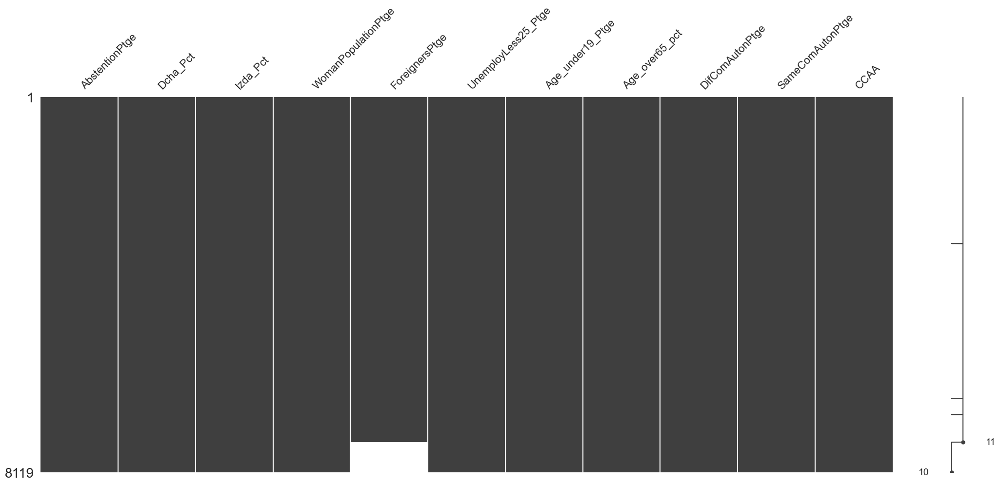

In [210]:
# Plot correlation heatmap of missingness
msno.matrix(ele_wins.sort_values(by='ForeignersPtge'))

No parece haber patrón de missings. Definitivamente ForeignersPtge es la variable con más incidencia de los mismos.

**Imputación de missings**

In [213]:
ele_wins.dropna().describe()

,AbstentionPtge,Dcha_Pct,Izda_Pct,WomanPopulationPtge,ForeignersPtge,UnemployLess25_Ptge,Age_under19_Ptge,Age_over65_pct,DifComAutonPtge,SameComAutonPtge
count,7463.000000,7463.000000,7463.000000,7463.000000,7463.000000,7463.000000,7463.00000,7463.000000,7463.000000,7463.000000
mean,26.519133,48.776276,34.439957,47.304716,6.298290,7.167846,13.58297,29.023893,10.703371,81.640783
std,7.501160,19.931186,16.515213,4.317899,6.900556,8.213958,6.77441,11.708954,8.664676,12.228814
min,0.000000,0.000000,0.000000,23.529000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
25%,21.712500,38.461500,21.875000,45.725500,1.620000,0.000000,8.33400,19.801500,4.930000,75.806000
50%,26.460000,51.428000,35.200000,48.490000,4.130000,5.882000,13.95300,27.508000,8.247000,84.487000
75%,31.466000,62.069000,46.122500,50.000000,8.810000,10.469500,19.05850,36.867500,13.889000,90.476000
max,57.576000,100.000000,94.117000,69.231000,44.190000,55.556000,33.69600,76.471000,58.871000,100.000000


In [214]:
#Separo variables númericas de 'CCAA'
ele_wins_cont = ele_wins.select_dtypes(include=np.number)
ele_wins_cat = ele_wins.select_dtypes(exclude=np.number)

#Imputación por knn (vecinos más cercanos)
imputer_knn = skl_imp.KNNImputer(n_neighbors=3)
ele_wins_knn_imputed = pd.DataFrame(imputer_knn.fit_transform(ele_wins_cont),columns=ele_wins_cont.columns)

# Juntar con 'CCAA'
ele_Dep = pd.concat([ele_wins_knn_imputed, ele_wins_cat], axis=1)
ele_Dep.head()

,AbstentionPtge,Dcha_Pct,Izda_Pct,WomanPopulationPtge,ForeignersPtge,UnemployLess25_Ptge,Age_under19_Ptge,Age_over65_pct,DifComAutonPtge,SameComAutonPtge,CCAA
0,20.213,35.555,60.444,44.048,0.89,2.381,18.155,26.785,19.345,79.762,Extremadura
1,25.275,44.118,54.779,50.117,1.63,16.216,13.055,30.304,7.226,90.909,Extremadura
2,27.241,53.140,44.203,49.033,0.70,8.197,9.139,36.028,18.102,78.910,Extremadura
3,30.114,45.325,50.813,51.095,0.12,7.407,14.964,24.940,5.109,93.917,Extremadura
4,30.185,49.867,44.562,48.154,0.64,15.385,15.569,25.042,4.173,93.258,Extremadura


Decido imputar por knn, porque aunque este método da problemas de sobreajuste en training, en este caso no tengo una variable objetivo ni haré separación training-test, por lo que no va a influir en ese sentido. Posteriormente, lo junto con la variable categórica CCAA. 

### 5.2- Agrega los valores por CCAA, distinguiendo entre valores relativos (agregación por la media) y valores absolutos (agregación por suma)

In [215]:
#Agregación por media
ele_Depm = ele_Dep.groupby(['CCAA']).mean()
ele_Depm.head()

,AbstentionPtge,Dcha_Pct,Izda_Pct,WomanPopulationPtge,ForeignersPtge,UnemployLess25_Ptge,Age_under19_Ptge,Age_over65_pct,DifComAutonPtge,SameComAutonPtge
CCAA,,,,,,,,,,
Andalucía,28.702028,41.409270,55.177999,49.366288,6.237107,13.842166,18.304943,20.938508,5.205537,87.361179
Aragón,25.033557,54.711115,41.598175,45.763100,7.406940,6.136969,11.171264,33.307423,12.278202,79.417042
Asturias,33.762987,46.295385,49.701974,49.841897,2.602479,7.168179,11.563526,29.810372,8.622333,86.720308
Baleares,33.574701,48.681119,44.388761,49.460373,16.164129,7.454119,19.773448,17.805015,16.313537,64.388284
Canarias,34.843398,45.635125,39.926080,49.451693,11.728030,5.438432,17.961705,17.617239,6.130261,76.895852


In [216]:
#Agregación por suma
ele_Deps = ele_Dep.groupby(['CCAA']).sum()
ele_Deps.head()

,AbstentionPtge,Dcha_Pct,Izda_Pct,WomanPopulationPtge,ForeignersPtge,UnemployLess25_Ptge,Age_under19_Ptge,Age_over65_pct,DifComAutonPtge,SameComAutonPtge
CCAA,,,,,,,,,,
Andalucía,22186.668,32009.366,42652.593,38160.141,4821.283333,10699.994,14149.721,16185.467,4023.880,67530.191
Aragón,18299.530,39993.825,30408.266,33452.826,5414.473333,4486.124,8166.194,24347.726,8975.366,58053.858
Asturias,2633.513,3611.040,3876.754,3887.668,202.993333,559.118,901.955,2325.209,672.542,6764.184
Baleares,2249.505,3261.635,2974.047,3313.845,1082.996667,499.426,1324.821,1192.936,1093.007,4314.015
Canarias,3066.219,4015.891,3513.495,4351.749,1032.066667,478.582,1580.630,1550.317,539.463,6766.835


### 5.3- Valora la necesidad de escalar los datos y decide el tipo de distancia a aplicar

Debido a que todas las variables numéricas son porcentages y tienen por lo tanto la misma unidad de medida, no considero necesario hacer escalado de los datos. 

Decido utilizar la distancia euclídea, una de las más utilizadas para clustering con variables numéricas

### 5.4- Explora los métodos de clustering jerárquico para estos datos y decide el tipo de Linkage más adecuado.

Running time for ward :	0.05s


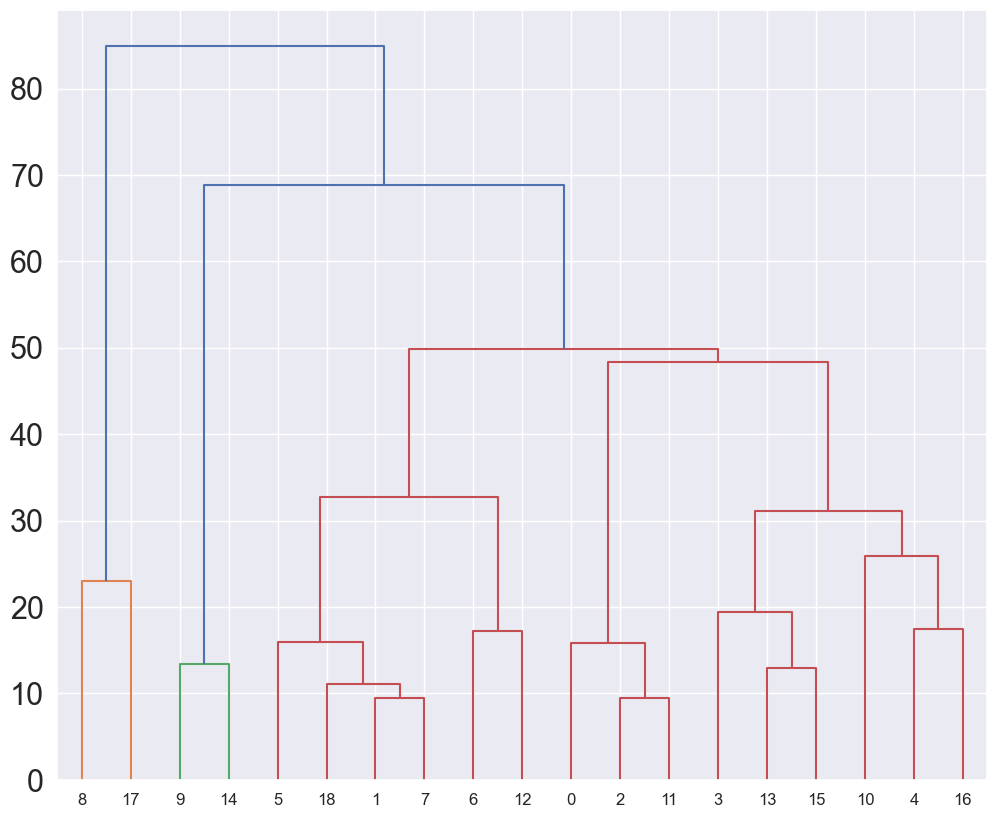

Running time for average :	0.01s


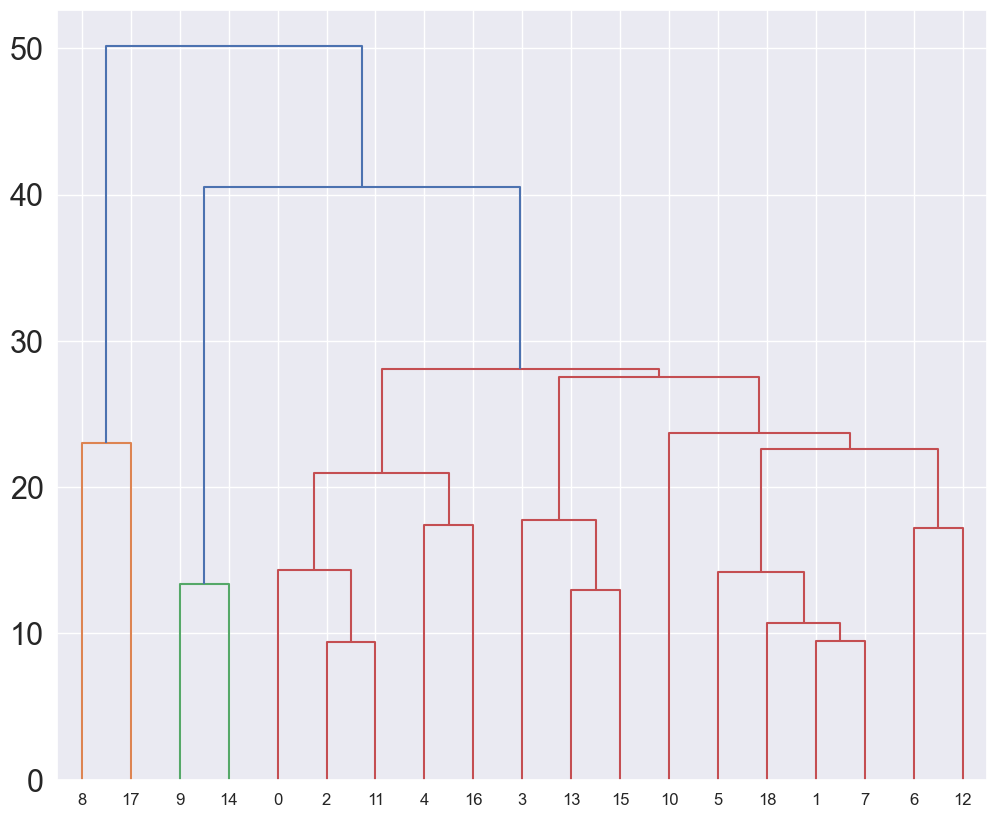

Running time for complete :	0.00s


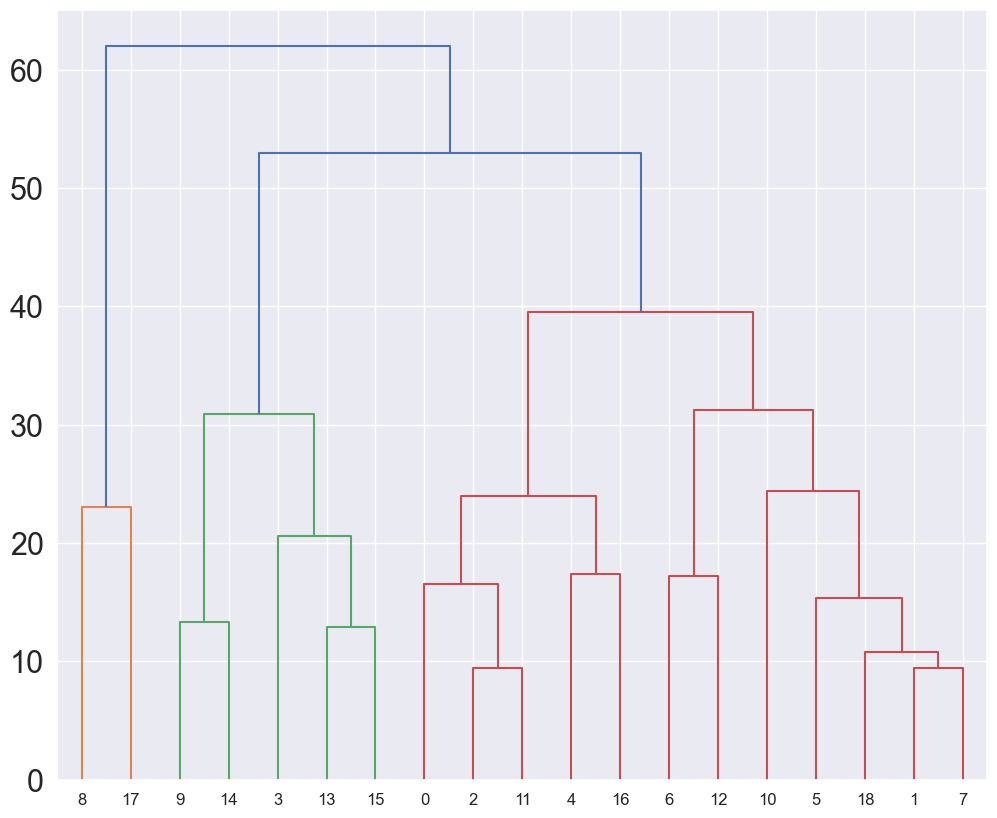

Running time for single :	0.02s


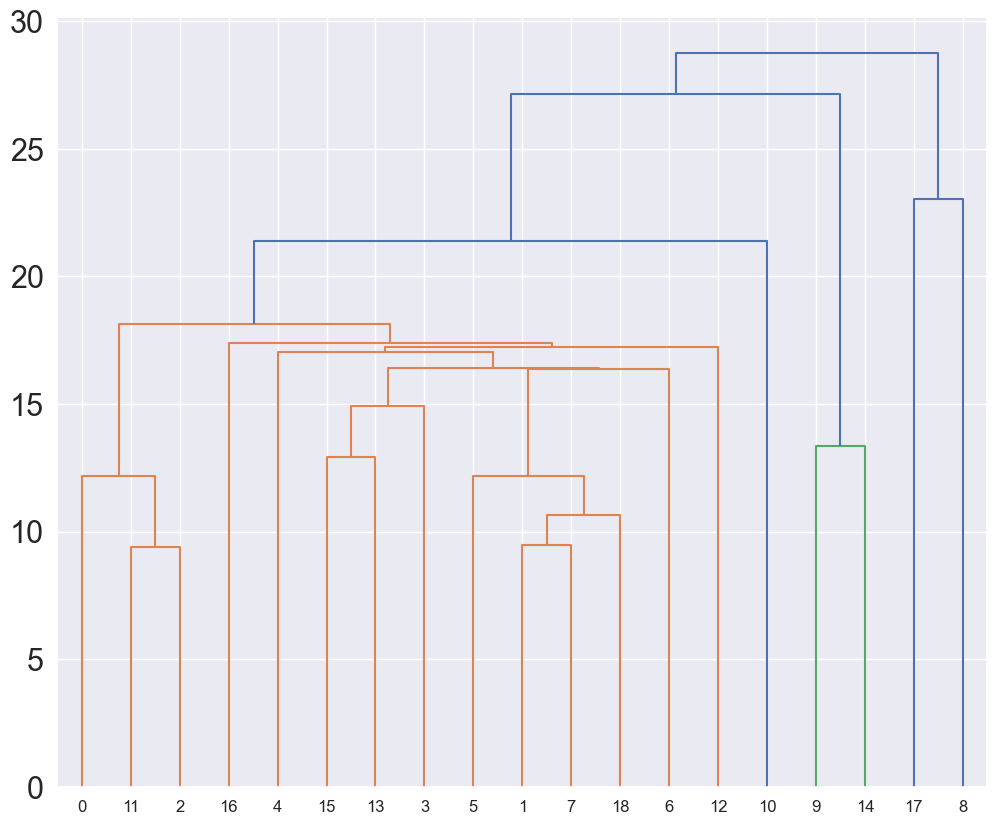

In [217]:
for linkage in ("ward", "average", "complete", "single"):
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=None,
                            distance_threshold = 0)
    t0 = time()
    clustering.fit(ele_Depm)
    print("Running time for %s :\t%.2fs" % (linkage, time() - t0))
    
    plt.clf()
    plot_dendogram(clustering)

El método que elijo es el de **Ward**, ya que hace grupos más homogéneos. En los demás queda un grupo más pequeño al principio.

### 5.5- Toma una decisión sobre el número de clusters a considerar y realiza un análisis cluster mediante el método k-means.

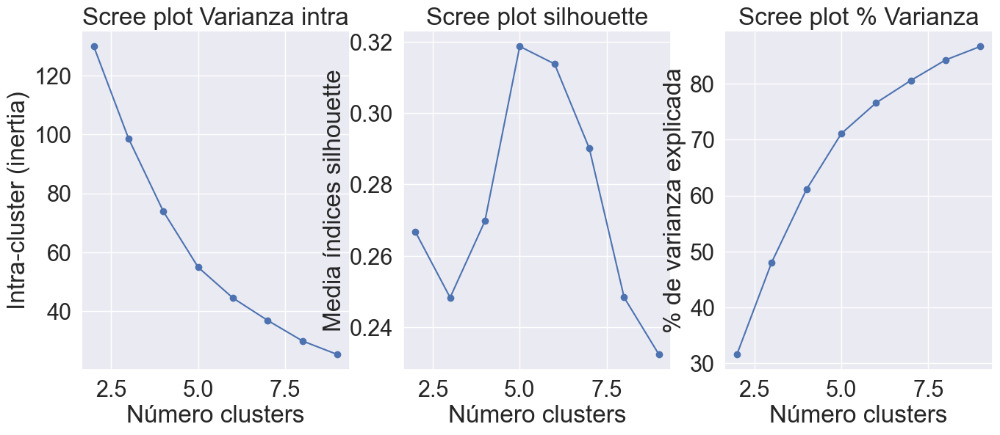

In [221]:
scree_plot_kmeans(ele_Depm,10)
plt.show()

Analizando los gráficos, un buen punto de corte sería aplicar **5 clusters**, con los que ya tendría un 70% de la varianza explicada.

In [222]:
# calcular el coeficiente de silueta y Indice de Calinski-Harabasz
cluster_labels = modelo_hclust.fit_predict(ele_Depm)
for linkage in ("ward", "average", "complete", "single"):
    modelo_hclust = AgglomerativeClustering(
                            affinity = 'euclidean',
                            linkage  = linkage,
                            n_clusters=5
                     )
    modelo_hclust.fit(X=ele_Depm)
    cluster_labels = modelo_hclust.fit_predict(ele_Depm)
    print(silhouette_score(ele_Depm, cluster_labels))
    print(metrics.calinski_harabasz_score(ele_Depm, cluster_labels))

0.32380409437931873
10.920157735140808
0.3249328121915234
11.438175410139683
0.27576863177862704
9.841238932140994
0.10021497552552319
5.208490277938885


- Silueta: nos indica de los bien o mal clasificada que se encuentra cada observación en su grupo.
- Indice de Calinski-Harabasz: compara la variación interna de los grupos con la variación entre unos grupos y otros.

El mejor método de linkage para este número de clusters es el average, seguido de ward, ya que se buscan valores altos en ambas medidas. Por ello, el método **Average** sería más adecuado en este caso.

In [223]:
modelo_kmeans = KMeans(n_clusters=5, n_init=25, random_state=123)
modelo_kmeans.fit(X=ele_Depm)

KMeans(n_clusters=5, n_init=25, random_state=123)

In [224]:
cluster_labels = modelo_kmeans.labels_
# Etiquetas de grupos
cluster_labels

array([0, 4, 0, 1, 1, 4, 4, 4, 3, 2, 4, 0, 4, 1, 2, 1, 0, 3, 4])

In [225]:
print('Varianza intra: ' + str(modelo_kmeans.inertia_))

Varianza intra: 2498.1737646675087


### 5.6- Muestra el biplot y comenta los grupos formados. Interpreta los centroides.

In [226]:
print('Centroides')
pd.DataFrame(modelo_kmeans.cluster_centers_)

Centroides


,0,1,2,3,4,5,6,7,8,9
0,29.757648,42.359833,49.132553,48.817420,4.072100,10.212570,15.053132,26.247675,9.171199,85.250043
1,30.218538,52.785265,40.096380,49.158974,13.411273,7.092730,20.242109,16.982294,12.063197,71.527385
2,48.030500,62.080000,33.722000,49.161000,10.615000,15.645500,28.419000,10.356000,17.858500,64.100500
3,33.125773,12.641851,20.503528,48.622651,7.145216,5.304601,18.974902,20.691728,11.442941,79.942664
4,24.320571,56.716936,33.701899,46.940784,6.055368,5.882964,12.108518,30.820815,11.880504,80.522651


Se muestra, para cada uno de los 5 clusters, los 10 centroides asociados a las 10 variables numéricas escogidas. Por ejemplo, en el primer cluster, la media del porcentage de abstención es de 29.75%, para el porcentage de votos a partidos de derecha de 42.35%, porcentage partidos izquierda de 49.13%, etc.

Por otro lado, se pueden ir comparando centroide por centroide de los diferentes clusters para ver diferencias entre ellos.

Así, en términos generales:
- Primer cluster: valores altos en votos a partidos de izquierda, residir en la misma comunidad. Valores bajos de extranjeros.
- 2C: Valores medios-altos en general, en el segundo puesto de muchas variables
- 3c: valores altos de abtención, partidos de derecha, poblacion de mujeres, desempleo juvenil, edad<19, residir en CCAA autónoma distinta de nacimiento.
- 4C: valores medios más dispares; valores bajos de partidos de izquierda y desempleo juvenil.
- 5C: alta población > 65; baja población joven, de mujeres, y porcentaje de abstención.

In [236]:
import plotly.express as px
ele_Depm['cluster'] = cluster_labels
fig = px.scatter(ele_Depm, x='Age_over65_pct',y='AbstentionPtge', color='cluster', text=ele_Depm.index)
fig.show()

El biplot muestra la distribución de las CCAA en función al porcentaje de población mayores de 65 años y el porcentaje de abstención. Como comentaba antes, el cluster 5 se caracterizaba por un valor alto en Age_over65_pct, y bajo en AbstentionPtge. Las CCAA identificadas en este grupo son ComValenciana, Castilla la Macha, Castilla León, Aragón... (en amarillo). En el lado contrario, Cauta y Melilla, del 3 cluster, y muy bien clasificadas espacialmente. Esto podría reflejar el fenómeno del aumento del abstentismo entre la gente joven, que se muestran más desinteresados por la política que personas más mayores. El segundo cluster, con valores medio-altos, incluye a Madrid, Murcia y las islas Canarias y Baleares. Y el 4, que incluye a Andalucía, Navarra o Extremadura.